# **The Air We Breathe**
### **A Local Data Science Project**

## **PART 1: Exploratory Data Analysis**

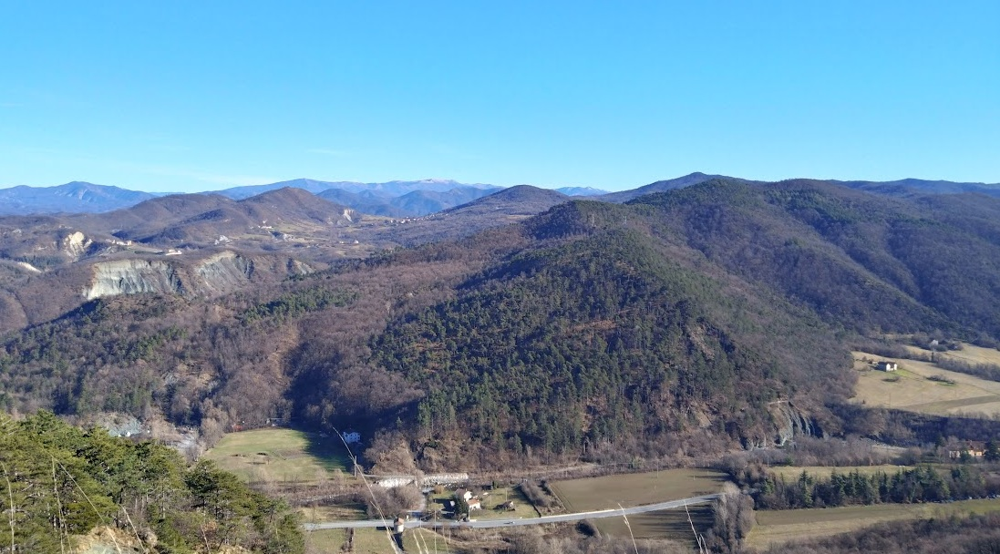

## Introduction

One of the first things I thought once I realized how much I like data science has been how I could have used to somehow benefit, or at least do something about, other things I care about, and one of the first that naturally came to my mind are my home territories and their nature, for which I have a strong bond.
So, after having gained some experience, becoming better at evaluating the feasability and validity of a project, I decided that a good homage to my original home (at the center bottom in the picture) and to the surrounding area (the "Val Lemme" area, athe border between Piemonte and Liguria) was to use data science and machine learning to evaluate how different conditions affect the quality of the air, specifically in that area (I expected that a smaller dataset about a specific geographical place would come with certains biases and certain implicit dynamics, of course).

So, while I spent time both continuing studying and working on other projects to deepen my knowledge of data science, I collected day by day the pollutant levels as reported from an app available for smartphones, over the course of two years, after which I had enough data (and experience) to perform some (hopefully!) good analysis. What follows is the result.

## Dataset Description
As mentioned, the pollutants have been noted manually by me each day from the 13th January 2024 to the 31st December 2025. Just a few days have been skipped. I tried my best to note the pollutant levels at 2pm, since I thought that it was a relevant time of day for outdoor activities and thus it was more interesting to take into consideration. I am aware that sometimes, during 2024, I noted it at a bit different times, which reduced the quality of data introducing some noise into it. However from the end of 2024 and during 2025 I improved the reliability of my procedure, so later data are better. I still decided to use all of them, both to have more and to see what happens if there is some noise into the data (which is a common condition anyway).

Instead, weather data have been downloaded from the ARPA Piemonte database, accessible here: https://webgis.arpa.piemonte.it/radar/open-scripts/richiesta_dati_gg_2024.php

The station I used, which seemed to me the closest to my home, was "BRIC CASTELLARO": it is not in the same spot but it is pretty close, so the weather conditions cannot be so much different and anyway they have to be strongly correlated, so they could be used as independent features.

Finally, for the daylight hours, I just took them from one of the available calendars.

The dataset is composed by those columns
- date
- pm2.5 (μg/m3)
- pm10 (μg/m3)
- no2 (μg/m3)
- o3 (μg/m3)
- so2 (μg/m3)
- DAYLIGHT HOURS
- PRECIPITATION TOTAL (mm)
- AIR TEMP time min
- AIR TEMP T min (°C)
- AIR TEMP T avg (°C)
- AIR TEMP time max
- AIR TEMP T max (°C)
- HUMIDITY time min
- HUMIDITY min (relative humidity in %)
- HUMIDITY avg (relative humidity in %)
- HUMIDITY time max
- HUMIDITY max (relative humidity in %)
- WIND time gust
- WIND speed gust (m/s)
- WIND direction gust (sexagesimal degrees, 0 = North)
- WIND speed avg (m/s)

## **Executive Summary**

This study investigates the temporal dynamics and predictive modeling of two key air quality indicators: **PM2.5 and O₃**. The analysis integrates statistical modeling, interquartile range (IQR)-based variability assessment, quantile regression (Q1 and Q3), and multi-class danger-level classification. Particular attention is devoted to the relationship between pollutant concentration, meteorological day types, and predictive reliability across seasons.

For **PM2.5**, results show a **strong capacity of the models to reproduce central tendencies and correctly classify danger levels**, especially in low and moderate conditions. **Classification accuracy remains high across most classes, with limited confusion primarily occurring between adjacent risk categories.** The use of quantile-based thresholds (Q1 and Q3) provides an effective mechanism for **managing variability** and **identifying potential deviations** from typical concentration ranges.

For **O₃**, the **seasonal signal is more pronounced**. **Concentrations rise significantly during hot, dry, and stable conditions, while decreasing during rainy or unstable atmospheric regimes**. Quantile modeling successfully captures the temporal evolution of dispersion and volatility. The multi-class classification results demonstrate strong predictive consistency, with high diagonal dominance in the confusion matrix and limited misclassification across non-adjacent categories.

Overall, **both pollutant models exhibit robust predictive performance, good temporal coherence, and meaningful sensitivity to meteorological regimes.** The combined use of regression, quantile modeling, and categorical classification provides a comprehensive framework for air quality risk assessment.

## Project Objective
The primary goal of this analysis is to model and forecast daily levels of **PM2.5** and **Ozone (O3)** using a probabilistic approach, and determining which are the elements that influence more the pollutants levels in the air.
Instead of predicting a single deterministic value, the project employs **Quantile Regression** to estimate the **25th**, **50th (Median)**, and **75th percentiles**. This allows for the construction of a dynamic **prediction interval (Interquartile Range - IQR)**, providing actionable insights into the uncertainty and potential risk of extreme pollution events.
Finally, taking as the main reference for predictions the median models, their functioning is analyzed to determine how the different informations contribute to the forecasted result, both individually and interacting with one another.

## Methodology
1.  **Exploratory Data Analysis (EDA):** Comprehensive study of pollutant distributions and their correlation with meteorological factors (Temperature, Humidity, Wind, Rain). Statistical tests (Kruskal-Wallis, Chi-Squared) were used to validate relationships.
2.  **Weather Clustering:** Implementation of **K-Means Clustering** to segment days into 12 distinct "Weather Types" (e.g., *dry_stable_calm*, *windy_humid_worsening*). This feature helps the model understand the synoptic context favoring accumulation or dispersion.
3.  **Feature Engineering:** Development of temporal features including:
    *   **Lag Variables:** Previous day's pollution and weather values to capture persistence.
    *   **Rolling Means:** To smooth short-term noise and capture trends.
    *   **Interaction Terms:** Combinations of wind, temperature, and daylight to model complex atmospheric dynamics.
4.  **Modeling:** Training of **CatBoost Regressors** using the `Quantile` loss function. Separate models were optimized for the Q1, Median, and Q3 percentiles for both pollutants.
5.  **Evaluation:** Assessment using **Pinball Loss** (a metric specifically for quantile accuracy) and Confusion Matrices mapped to EU Air Quality Index (AQI) classes.
6.  **Explanation:** Analysis with **Shap Values** of the median model to understand how the different features influence the pollutant levels.

In [1]:
import sys
sys.path.append('..')

from utils import *
from scipy.spatial.distance import cdist
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.preprocessing import KBinsDiscretizer, RobustScaler
from sklearn.cluster import KMeans
import pickle
import os

In [2]:
data = pd.read_excel('../data/AIR MEASURAMENTS.xlsx')

In [3]:
display(data.head())

display(data.tail())

data.info()

,date,pm2.5,pm10,no2,o3,so2,DAYLIGHT HOURS,PRECIPITATION TOTAL,AIR TEMP time min,AIR TEMP T min,...,AIR TEMP T max,HUMIDITY time min,HUMIDITY min,HUMIDITY avg,HUMIDITY time max,HUMIDITY max,WIND time gust,WIND speed gust,WIND direction gust,WIND speed avg
0,2024-01-13,63.0,66.0,14.0,33.0,1.0,9.066667,0.0,06:00:00,0.8,...,4.2,19:50:00,65,88,14:10:00,98,21:33:00,3.3,217,0.9
1,2024-01-14,33.0,37.0,10.0,45.0,1.0,9.100000,0.0,08:20:00,0.8,...,4.4,00:20:00,72,87,08:20:00,97,08:38:00,3.9,246,1.4
2,2024-01-15,46.0,52.0,8.0,44.0,1.0,9.133333,0.0,00:30:00,0.8,...,10.0,23:30:00,51,82,01:10:00,97,20:41:00,5.7,229,1.3
3,2024-01-16,72.0,75.0,41.0,11.0,2.0,9.166667,0.0,08:00:00,-0.8,...,8.7,00:30:00,51,95,05:20:00,100,13:54:00,6.2,230,2.1
4,2024-01-17,81.0,85.0,13.0,27.0,1.0,9.183333,12.0,21:10:00,1.5,...,2.5,01:40:00,89,99,02:50:00,100,22:05:00,4.5,250,1.6


,date,pm2.5,pm10,no2,o3,so2,DAYLIGHT HOURS,PRECIPITATION TOTAL,AIR TEMP time min,AIR TEMP T min,...,AIR TEMP T max,HUMIDITY time min,HUMIDITY min,HUMIDITY avg,HUMIDITY time max,HUMIDITY max,WIND time gust,WIND speed gust,WIND direction gust,WIND speed avg
714,2025-12-27,16.0,19.0,6.0,42.0,1.0,8.816667,1.2,00:20:00,1.5,...,10.2,18:30:00,42,73,00:00:00,100,00:18:00,5.5,233,1.6
715,2025-12-28,7.0,9.0,7.0,56.0,1.0,8.816667,0.0,23:30:00,3.3,...,11.7,04:10:00,22,53,23:30:00,90,21:07:00,4.4,254,1.6
716,2025-12-29,42.0,65.0,24.0,16.0,5.0,8.816667,0.0,02:00:00,2.5,...,11.9,16:30:00,34,65,02:20:00,92,19:44:00,10.3,181,1.2
717,2025-12-30,21.0,27.0,17.0,29.0,1.0,8.833333,0.0,23:30:00,1.0,...,9.5,00:40:00,70,86,16:00:00,100,00:34:00,12.8,165,2.4
718,2025-12-31,29.0,33.0,14.0,42.0,1.0,8.850000,0.0,00:00:00,1.0,...,5.0,14:00:00,73,95,00:00:00,100,03:58:00,4.3,,1.4


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 719 entries, 0 to 718
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 719 non-null    datetime64[ns]
 1   pm2.5                697 non-null    float64       
 2   pm10                 697 non-null    float64       
 3   no2                  697 non-null    float64       
 4   o3                   697 non-null    float64       
 5   so2                  697 non-null    float64       
 6   DAYLIGHT HOURS       719 non-null    float64       
 7   PRECIPITATION TOTAL  719 non-null    float64       
 8   AIR TEMP time min    719 non-null    object        
 9   AIR TEMP T min       719 non-null    float64       
 10  AIR TEMP T avg       719 non-null    float64       
 11  AIR TEMP time max    719 non-null    object        
 12  AIR TEMP T max       719 non-null    float64       
 13  HUMIDITY time min    719 non-null  

In [4]:
print('Number of listed days:',data['date'].nunique())

Number of listed days: 719


As seen above some columns are not recognized as numeric columns so they need to be converted.

In [5]:
data['PRECIPITATION TOTAL'] = pd.to_numeric(data['PRECIPITATION TOTAL'], errors="coerce")
data['WIND speed gust'] = pd.to_numeric(data['WIND speed gust'], errors="coerce")
data['WIND direction gust'] = pd.to_numeric(data['WIND direction gust'], errors="coerce")
data['WIND speed avg'] = pd.to_numeric(data['WIND speed avg'], errors="coerce")

Below the thresholds to classify the quality level of the different pollutants is defined, based on the leves indicated by the European Air Quality Index, with update at february 2026 (see website: https://airindex.eea.europa.eu/AQI/index.html )

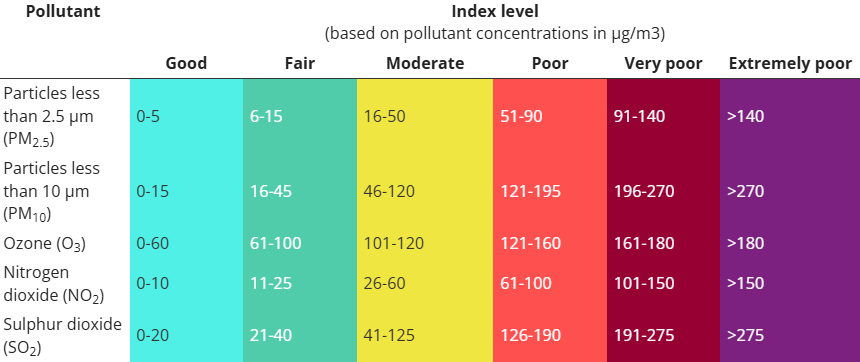

The EU AQI level is determined by the worst level between the pollutants.

In [6]:
data['eu aqi'] = data[data.columns[1:6]].apply(calculate_eu_aqi_category, axis = 1)

In [7]:
for pollutant in EU_AQI_THRESHOLDS:
    data[pollutant+' CLASS'] = data[pollutant].apply(lambda p: classify_level(p, EU_AQI_THRESHOLDS[pollutant]))

Since the wind direction in the dataset is represented in degrees, a conversion is done in cardinal directions.

In [8]:
data['WIND direction gust'] = data['WIND direction gust'].apply(cardinal_direction)

The year and month of year are useful information to be considered in the analysis.

In [9]:
data['date'] = pd.to_datetime(data['date'])

In [10]:
data['month of year'] = data['date'].dt.strftime("%B")

In [11]:
data['year'] = data['date'].dt.year.astype(str)

There are different columns that represent a time of the day, it is useful to group them in four distinct moments of day: morning, afternoon, evening and night.

In [12]:
data['AIR TEMP time min'] = pd.to_datetime(data['AIR TEMP time min'], format="%H:%M:%S", errors="coerce")
data['AIR TEMP time max'] = pd.to_datetime(data['AIR TEMP time max'], format="%H:%M:%S", errors="coerce")
data['HUMIDITY time min'] = pd.to_datetime(data['HUMIDITY time min'], format="%H:%M:%S", errors="coerce")
data['HUMIDITY time max'] = pd.to_datetime(data['HUMIDITY time max'], format="%H:%M:%S", errors="coerce")
data['WIND time gust'] = pd.to_datetime(data['WIND time gust'], format="%H:%M:%S", errors="coerce")

In [13]:
data['AIR TEMP time min'] = data['AIR TEMP time min'].apply(day_moment)
data['AIR TEMP time max'] = data['AIR TEMP time max'].apply(day_moment)
data['HUMIDITY time min'] = data['HUMIDITY time min'].apply(day_moment)
data['HUMIDITY time max'] = data['HUMIDITY time max'].apply(day_moment)
data['WIND time gust'] = data['WIND time gust'].apply(day_moment)

In [14]:
data.index = data['date']

data.drop('date', axis = 1, inplace = True)

In [15]:
# Creation of the lists used to build the dataframe to display the informations about the columns
tot_val = [] # List for the column about the total amount of values
un_val = [] #List for the column about the quantity of unique values
nan_val = [] # List for the quantity of NaN values


for c in data.columns:
    # column.isna() == False is used to select the rows of the dataframe where that column doesn't have NaN values
    tot_val.append(data[data[c].isna() == False][c].count()) # count the number of elements in the selection made
    un_val.append(data[data[c].isna() == False][c].nunique())
    # shape[0] gives the number of rows of the dataframe
    nan_val.append(data[data[c].isna() == True].shape[0])

# The dataframe to display is defined with a dictionary
columns_summary = pd.DataFrame({
    'Column': data.columns.tolist(),
    'data Type': data.dtypes.tolist(),
    'Total Values': tot_val,
    'Unique Values': un_val,
    'NaN Values': nan_val,
})

# Display of the resulting table
display(columns_summary)

,Column,data Type,Total Values,Unique Values,NaN Values
0,pm2.5,float64,697,63,22
1,pm10,float64,697,74,22
2,no2,float64,697,45,22
3,o3,float64,697,152,22
4,so2,float64,697,7,22
5,DAYLIGHT HOURS,float64,719,344,0
6,PRECIPITATION TOTAL,float64,719,121,0
7,AIR TEMP time min,object,719,4,0
8,AIR TEMP T min,float64,719,234,0
9,AIR TEMP T avg,float64,719,262,0


# EDA

## Univariate Analysis

In [16]:
display(data.select_dtypes(include = 'object').describe(include = 'all').T)
display(data.describe().T)

,count,unique,top,freq
AIR TEMP time min,719,4,night,445
AIR TEMP time max,719,4,afternoon,545
HUMIDITY time min,719,4,afternoon,377
HUMIDITY time max,719,4,night,391
WIND time gust,719,5,afternoon,271
WIND direction gust,719,17,UNKNOWN,140
eu aqi,719,6,Fair,303
pm2.5 CLASS,719,6,Fair,340
pm10 CLASS,719,4,Good,353
no2 CLASS,719,4,Good,513


,count,mean,std,min,25%,50%,75%,max
pm2.5,697.0,14.740316,14.266652,0.000000,6.000000,10.00,18.000000,110.000000
pm10,697.0,19.631277,15.867548,1.000000,9.000000,15.00,26.000000,115.000000
no2,697.0,8.272597,8.937700,1.000000,2.000000,5.00,11.000000,60.000000
o3,697.0,75.104735,36.878944,0.000000,49.000000,74.00,100.000000,172.000000
so2,697.0,0.975610,0.848075,0.000000,1.000000,1.00,1.000000,6.000000
DAYLIGHT HOURS,719.0,12.285025,2.312772,8.783333,10.058333,12.35,14.516667,15.583333
PRECIPITATION TOTAL,719.0,4.250070,13.636347,0.000000,0.000000,0.00,1.200000,186.200000
AIR TEMP T min,719.0,10.775661,6.611599,-3.400000,5.350000,10.70,16.400000,24.400000
AIR TEMP T avg,719.0,13.927955,7.337849,-0.700000,7.800000,13.60,20.000000,29.400000
AIR TEMP T max,719.0,17.624757,8.383521,0.600000,10.350000,17.40,24.300000,35.000000


****************************************************************************************************
PM2.5
Description of column pm2.5
The column pm2.5 has 22 missing values
The column pm2.5 has 1 zero values


,count,mean,std,min,25%,50%,75%,max
pm2.5,697.0,14.740316,14.266652,0.0,6.0,10.0,18.0,110.0


Skew of the column: 2.461163804851461


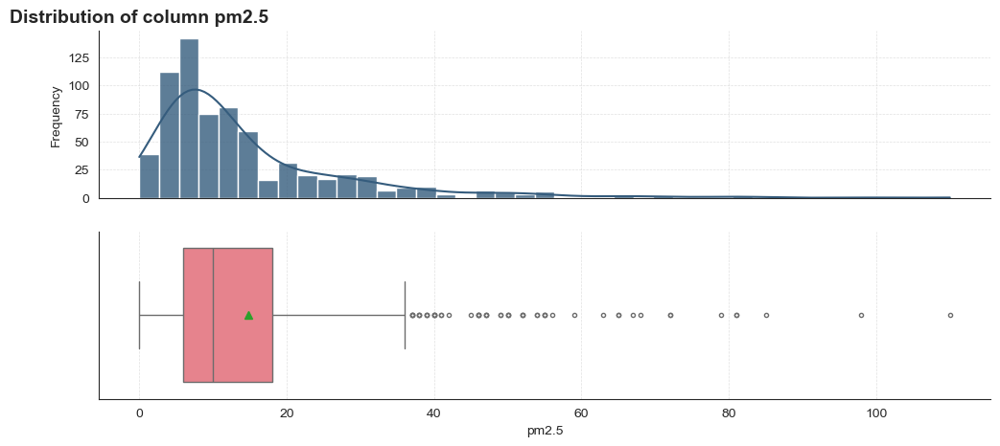

****************************************************************************************************
PM10
Description of column pm10
The column pm10 has 22 missing values
The column pm10 has 0 zero values


,count,mean,std,min,25%,50%,75%,max
pm10,697.0,19.631277,15.867548,1.0,9.0,15.0,26.0,115.0


Skew of the column: 2.0720871143658424


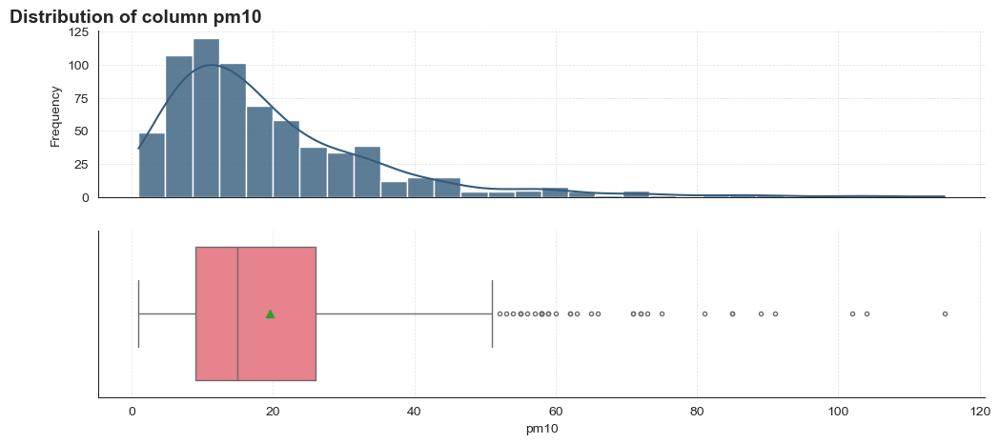

****************************************************************************************************
NO2
Description of column no2
The column no2 has 22 missing values
The column no2 has 0 zero values


,count,mean,std,min,25%,50%,75%,max
no2,697.0,8.272597,8.9377,1.0,2.0,5.0,11.0,60.0


Skew of the column: 2.171339603106909


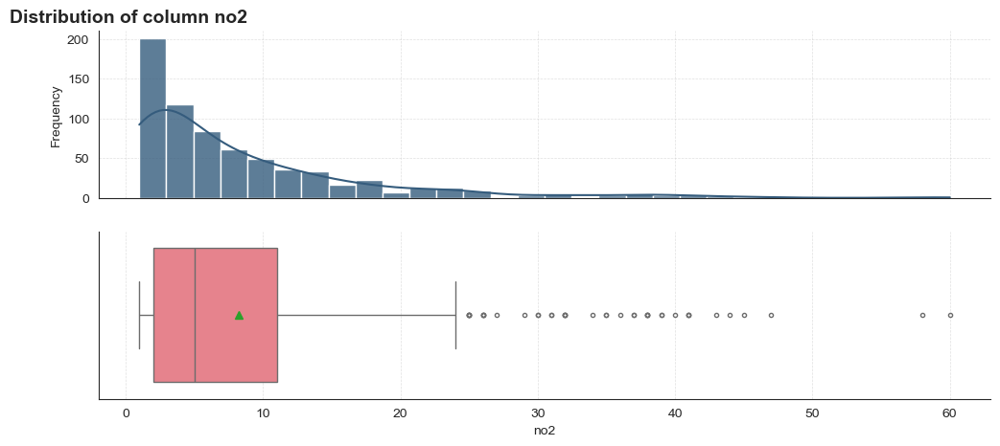

****************************************************************************************************
O3
Description of column o3
The column o3 has 22 missing values
The column o3 has 3 zero values


,count,mean,std,min,25%,50%,75%,max
o3,697.0,75.104735,36.878944,0.0,49.0,74.0,100.0,172.0


Skew of the column: 0.12947535247797262


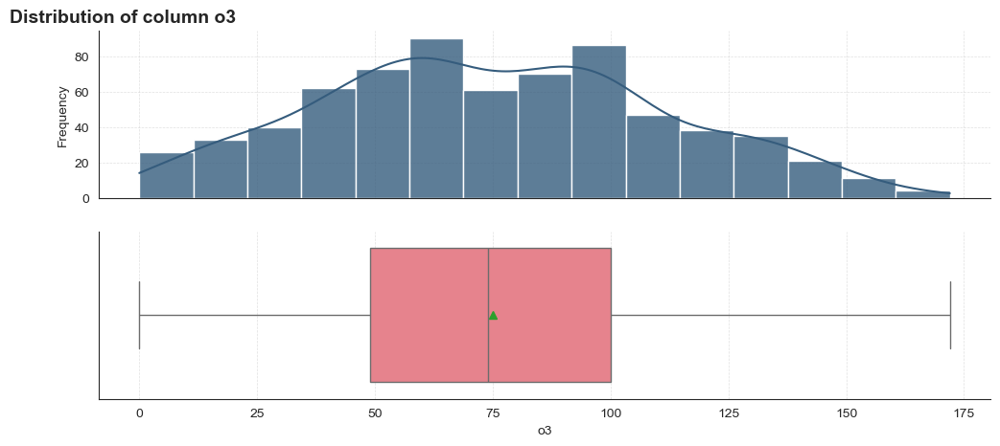

****************************************************************************************************
SO2
Description of column so2
The column so2 has 22 missing values
The column so2 has 172 zero values


,count,mean,std,min,25%,50%,75%,max
so2,697.0,0.97561,0.848075,0.0,1.0,1.0,1.0,6.0


Skew of the column: 1.9740298330421149


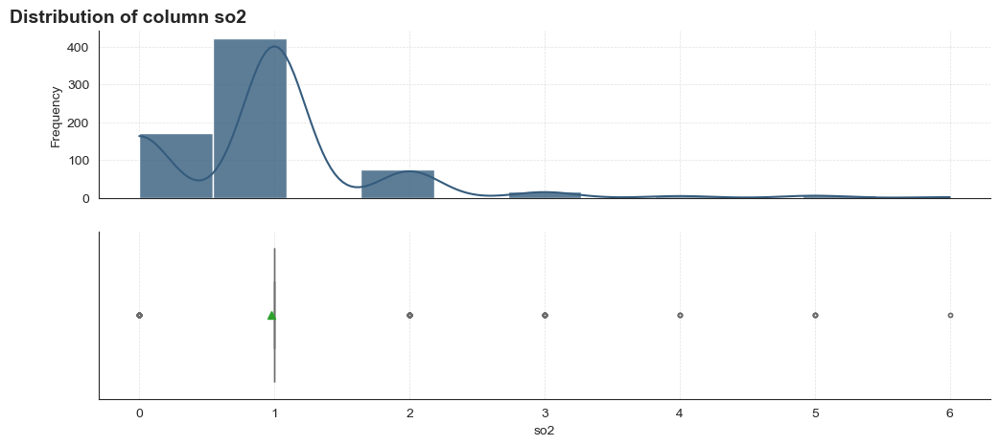

****************************************************************************************************
DAYLIGHT HOURS
Description of column DAYLIGHT HOURS
The column DAYLIGHT HOURS has 0 missing values
The column DAYLIGHT HOURS has 0 zero values


,count,mean,std,min,25%,50%,75%,max
DAYLIGHT HOURS,719.0,12.285025,2.312772,8.783333,10.058333,12.35,14.516667,15.583333


Skew of the column: -0.05354420671266351


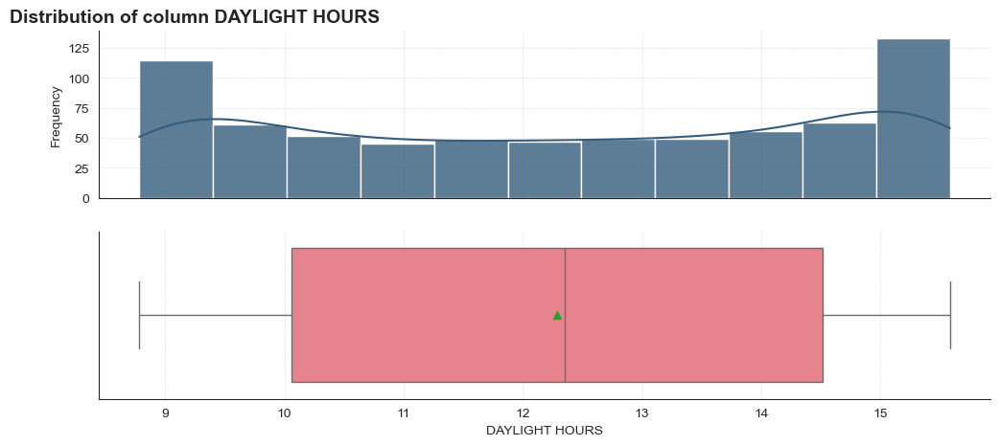

****************************************************************************************************
PRECIPITATION TOTAL
Description of column PRECIPITATION TOTAL
The column PRECIPITATION TOTAL has 0 missing values
The column PRECIPITATION TOTAL has 476 zero values


,count,mean,std,min,25%,50%,75%,max
PRECIPITATION TOTAL,719.0,4.25007,13.636347,0.0,0.0,0.0,1.2,186.2


Skew of the column: 6.694492405700384


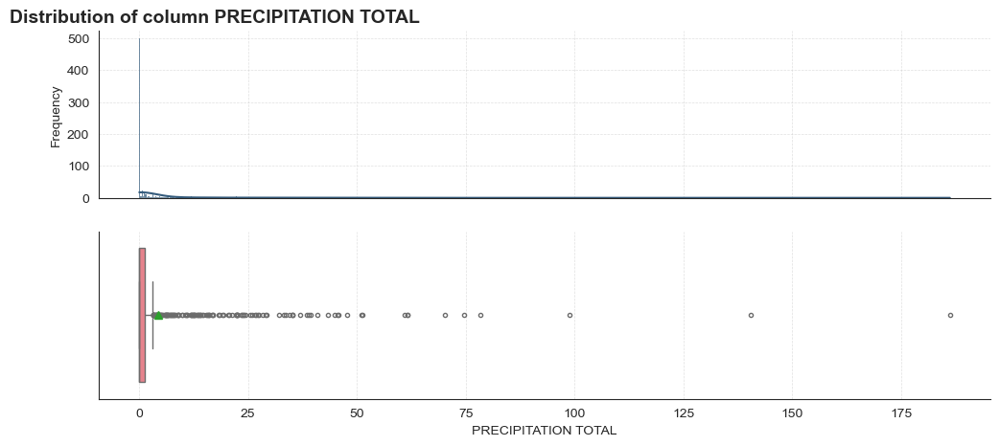

****************************************************************************************************
AIR TEMP TIME MIN
Description of column AIR TEMP time min
The column AIR TEMP time min has 0 missing values


,AIR TEMP time min values,Absolute frequency,Relative frequency (%)
0,night,445,61.89
1,evening,138,19.19
2,morning,124,17.25
3,afternoon,12,1.67


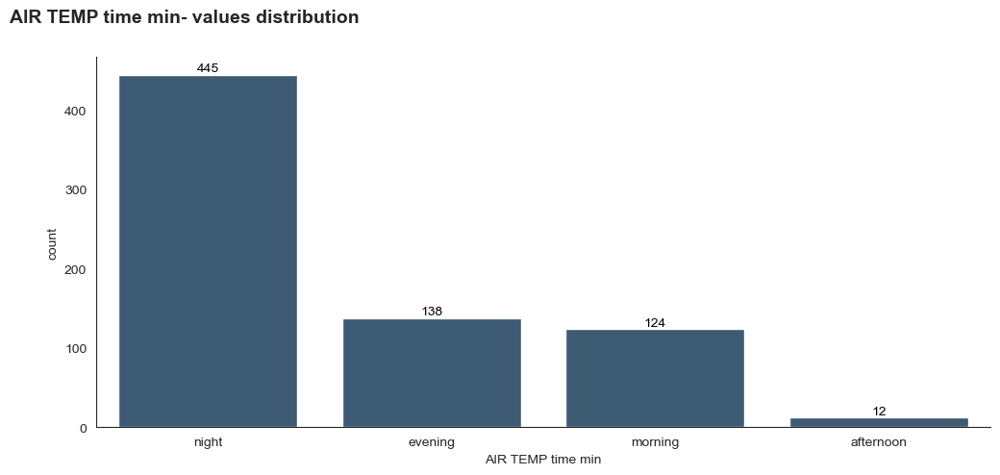

****************************************************************************************************
AIR TEMP T MIN
Description of column AIR TEMP T min
The column AIR TEMP T min has 0 missing values
The column AIR TEMP T min has 0 zero values


,count,mean,std,min,25%,50%,75%,max
AIR TEMP T min,719.0,10.775661,6.611599,-3.4,5.35,10.7,16.4,24.4


Skew of the column: 0.11227373502220028


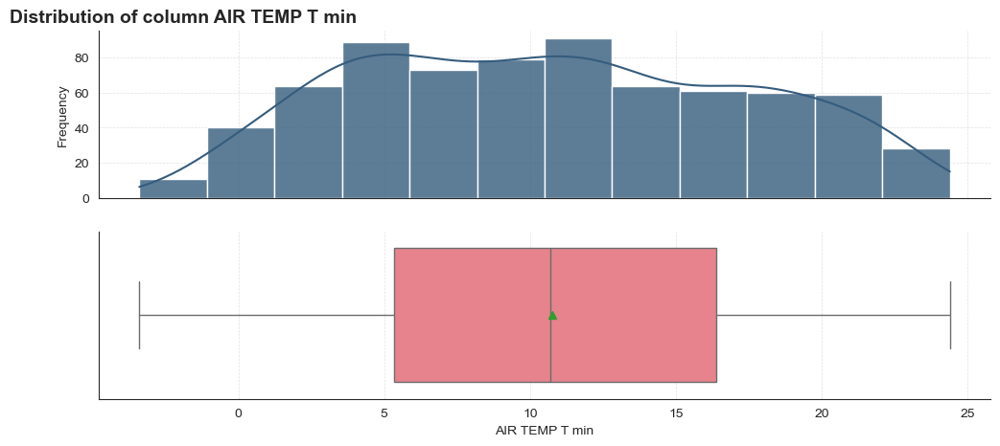

****************************************************************************************************
AIR TEMP T AVG
Description of column AIR TEMP T avg
The column AIR TEMP T avg has 0 missing values
The column AIR TEMP T avg has 1 zero values


,count,mean,std,min,25%,50%,75%,max
AIR TEMP T avg,719.0,13.927955,7.337849,-0.7,7.8,13.6,20.0,29.4


Skew of the column: 0.14414555167395005


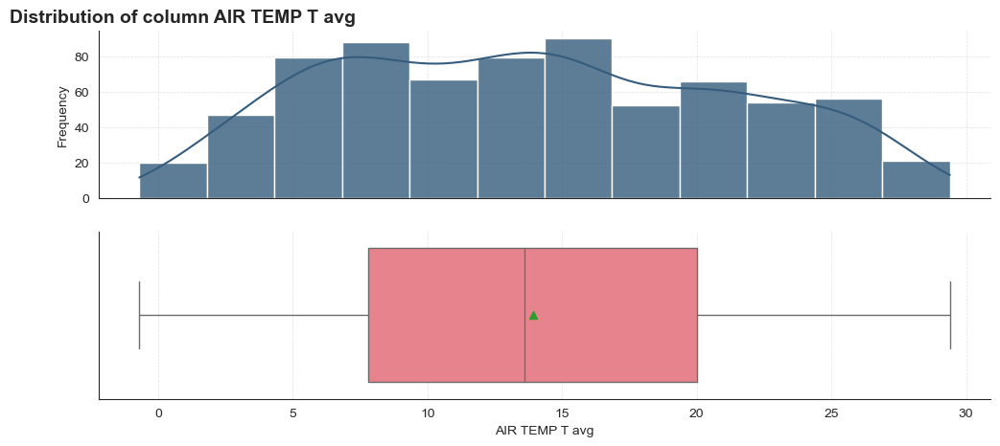

****************************************************************************************************
AIR TEMP TIME MAX
Description of column AIR TEMP time max
The column AIR TEMP time max has 0 missing values


,AIR TEMP time max values,Absolute frequency,Relative frequency (%)
0,afternoon,545,75.80
1,morning,83,11.54
2,night,53,7.37
3,evening,38,5.29


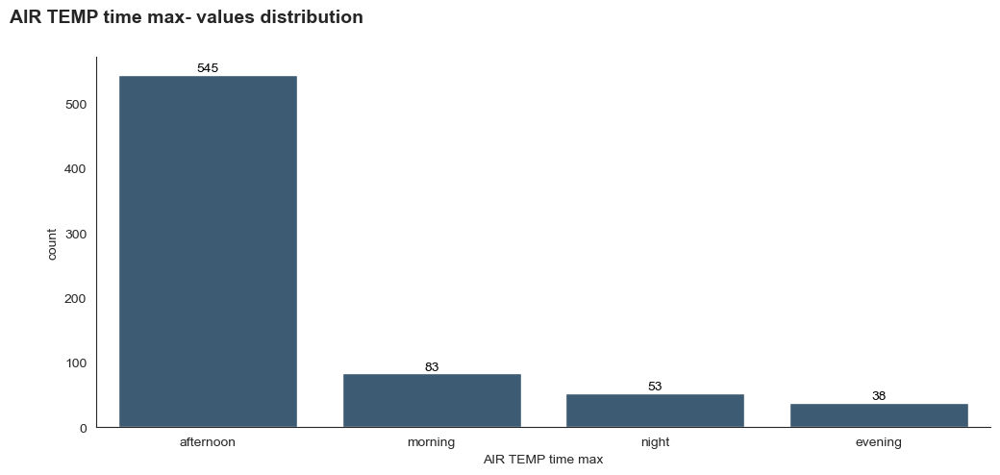

****************************************************************************************************
AIR TEMP T MAX
Description of column AIR TEMP T max
The column AIR TEMP T max has 0 missing values
The column AIR TEMP T max has 0 zero values


,count,mean,std,min,25%,50%,75%,max
AIR TEMP T max,719.0,17.624757,8.383521,0.6,10.35,17.4,24.3,35.0


Skew of the column: 0.13361465737443637


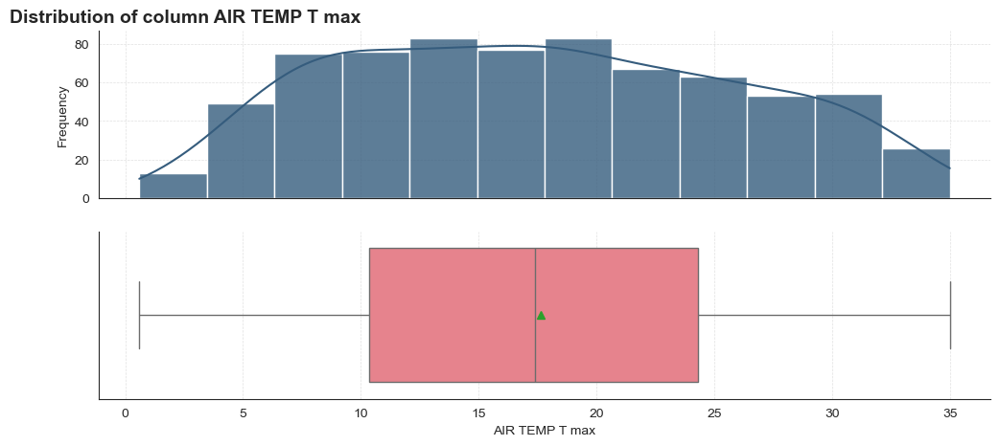

****************************************************************************************************
HUMIDITY TIME MIN
Description of column HUMIDITY time min
The column HUMIDITY time min has 0 missing values


,HUMIDITY time min values,Absolute frequency,Relative frequency (%)
0,afternoon,377,52.43
1,night,173,24.06
2,evening,105,14.60
3,morning,64,8.90


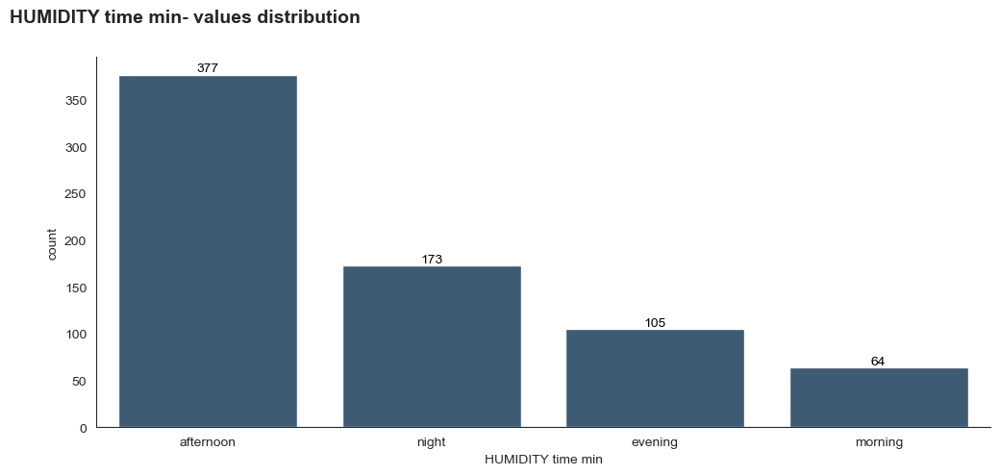

****************************************************************************************************
HUMIDITY MIN
Description of column HUMIDITY min
The column HUMIDITY min has 0 missing values
The column HUMIDITY min has 0 zero values


,count,mean,std,min,25%,50%,75%,max
HUMIDITY min,719.0,57.399166,20.670395,14.0,43.0,55.0,70.0,100.0


Skew of the column: 0.3756584605163372


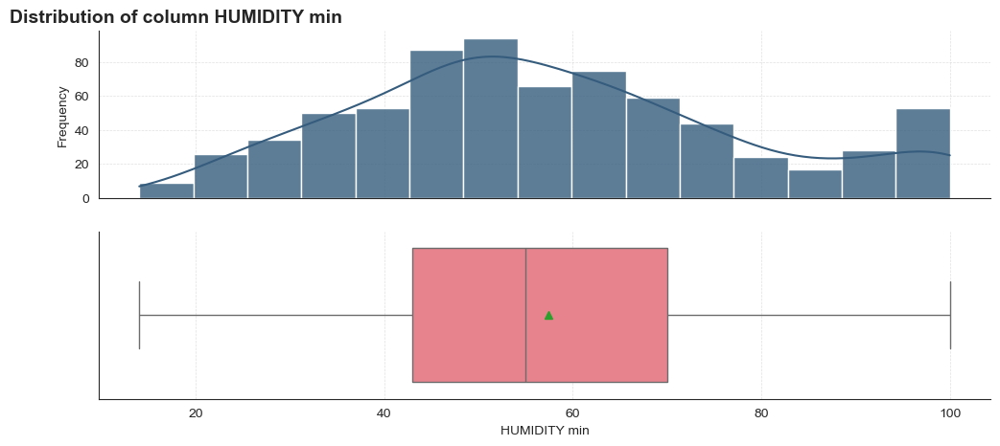

****************************************************************************************************
HUMIDITY AVG
Description of column HUMIDITY avg
The column HUMIDITY avg has 0 missing values
The column HUMIDITY avg has 0 zero values


,count,mean,std,min,25%,50%,75%,max
HUMIDITY avg,719.0,74.600834,16.549682,26.0,64.0,74.0,88.0,100.0


Skew of the column: -0.2139476094543068


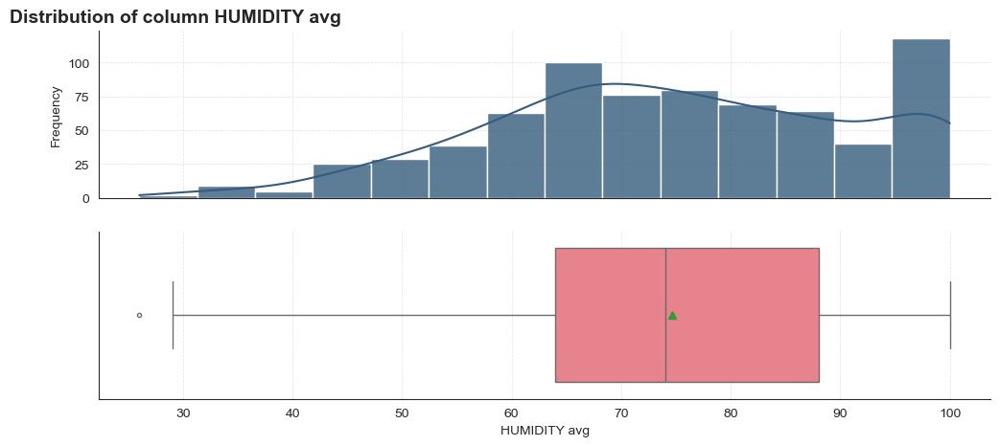

****************************************************************************************************
HUMIDITY TIME MAX
Description of column HUMIDITY time max
The column HUMIDITY time max has 0 missing values


,HUMIDITY time max values,Absolute frequency,Relative frequency (%)
0,night,391,54.38
1,morning,157,21.84
2,evening,143,19.89
3,afternoon,28,3.89


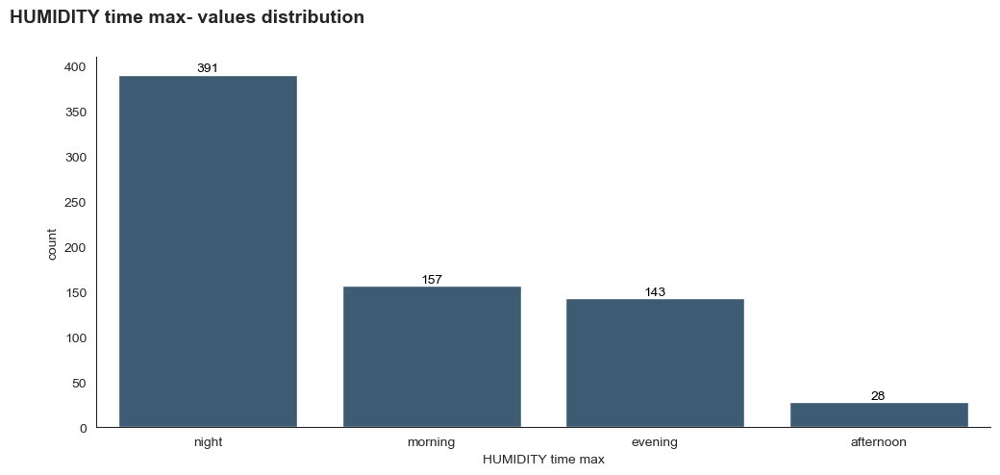

****************************************************************************************************
HUMIDITY MAX
Description of column HUMIDITY max
The column HUMIDITY max has 0 missing values
The column HUMIDITY max has 0 zero values


,count,mean,std,min,25%,50%,75%,max
HUMIDITY max,719.0,89.4242,12.032663,35.0,83.0,94.0,100.0,100.0


Skew of the column: -1.2509367714946442


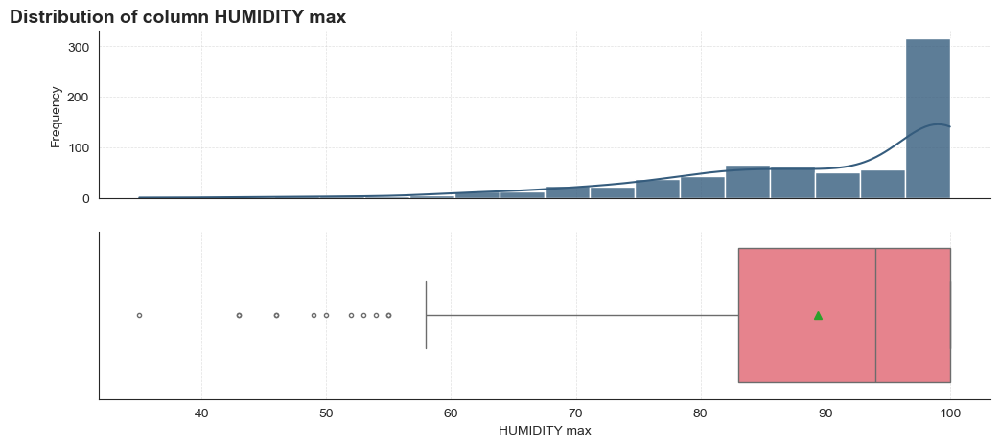

****************************************************************************************************
WIND TIME GUST
Description of column WIND time gust
The column WIND time gust has 0 missing values


,WIND time gust values,Absolute frequency,Relative frequency (%)
0,afternoon,271,37.69
1,evening,169,23.50
2,night,140,19.47
3,morning,134,18.64
4,empty,5,0.70


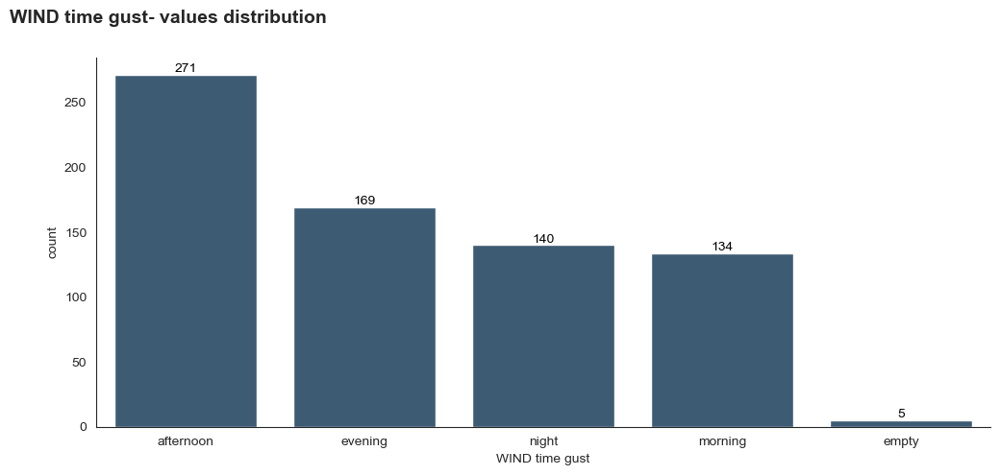

****************************************************************************************************
WIND SPEED GUST
Description of column WIND speed gust
The column WIND speed gust has 5 missing values
The column WIND speed gust has 0 zero values


,count,mean,std,min,25%,50%,75%,max
WIND speed gust,714.0,8.30056,4.667458,0.4,4.8,6.8,10.375,27.5


Skew of the column: 1.2690975179737185


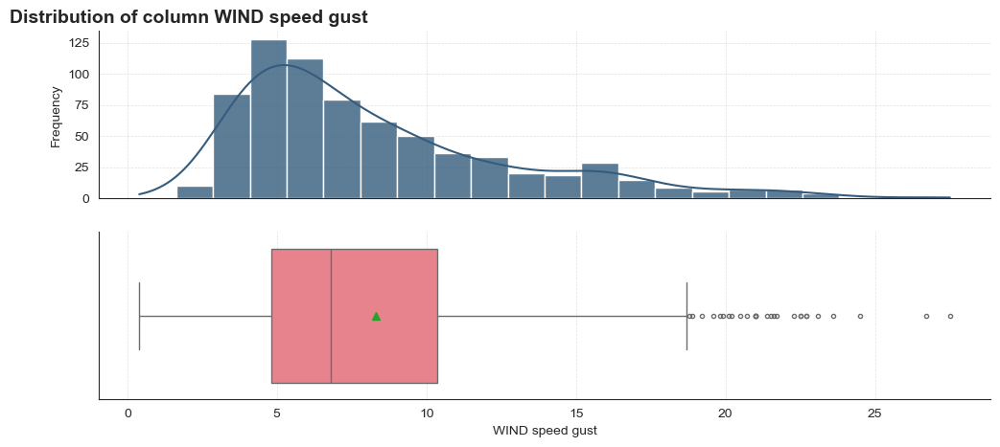

****************************************************************************************************
WIND DIRECTION GUST
Description of column WIND direction gust
The column WIND direction gust has 0 missing values


,WIND direction gust values,Absolute frequency,Relative frequency (%)
0,UNKNOWN,140,19.47
1,SE,115,15.99
2,NW,76,10.57
3,WSW,61,8.48
4,ESE,60,8.34
5,WNW,59,8.21
6,SSE,46,6.40
7,SW,41,5.70
8,W,30,4.17
9,NNW,23,3.20


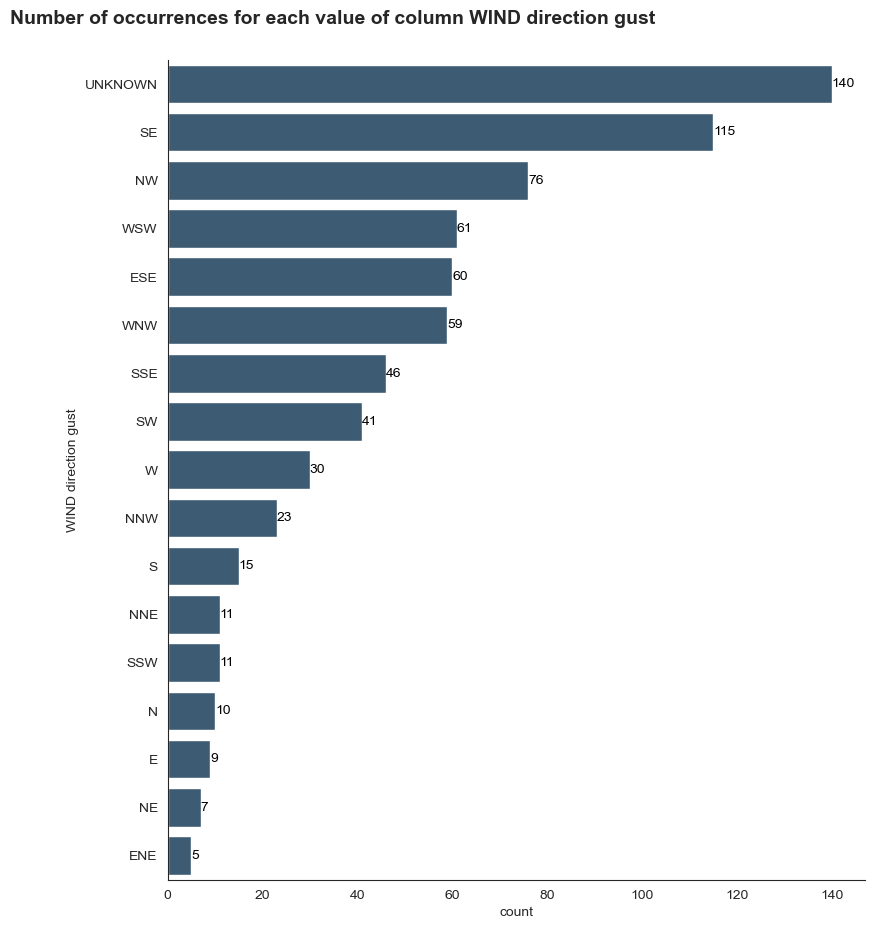

****************************************************************************************************
WIND SPEED AVG
Description of column WIND speed avg
The column WIND speed avg has 4 missing values
The column WIND speed avg has 0 zero values


,count,mean,std,min,25%,50%,75%,max
WIND speed avg,715.0,2.027133,1.027693,0.3,1.4,1.8,2.35,8.6


Skew of the column: 2.160343782531388


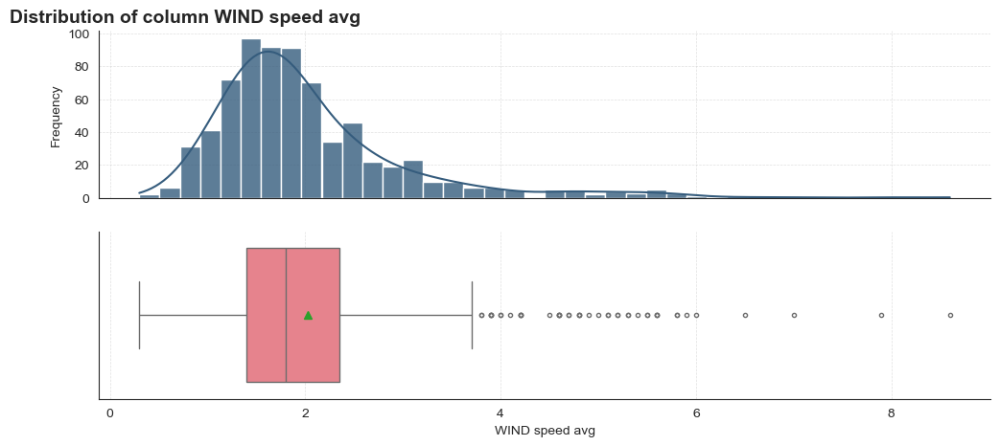

****************************************************************************************************
EU AQI
Description of column eu aqi
The column eu aqi has 0 missing values


,eu aqi values,Absolute frequency,Relative frequency (%)
0,Fair,303,42.14
1,Moderate,259,36.02
2,Poor,111,15.44
3,missing_vals,22,3.06
4,Good,18,2.50
5,Very Poor,6,0.83


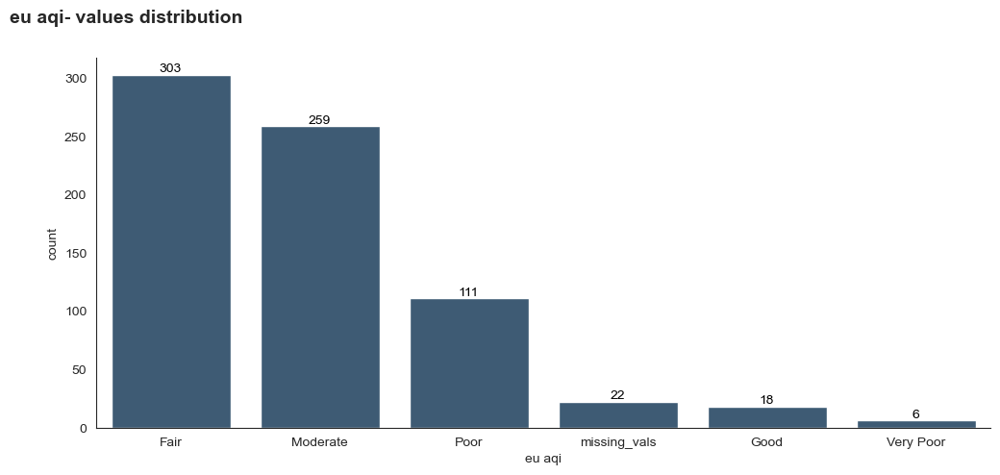

****************************************************************************************************
PM2.5 CLASS
Description of column pm2.5 CLASS
The column pm2.5 CLASS has 0 missing values


,pm2.5 CLASS values,Absolute frequency,Relative frequency (%)
0,Fair,340,47.29
1,Moderate,183,25.45
2,Good,151,21.00
3,missing_vals,22,3.06
4,Poor,21,2.92
5,Very Poor,2,0.28


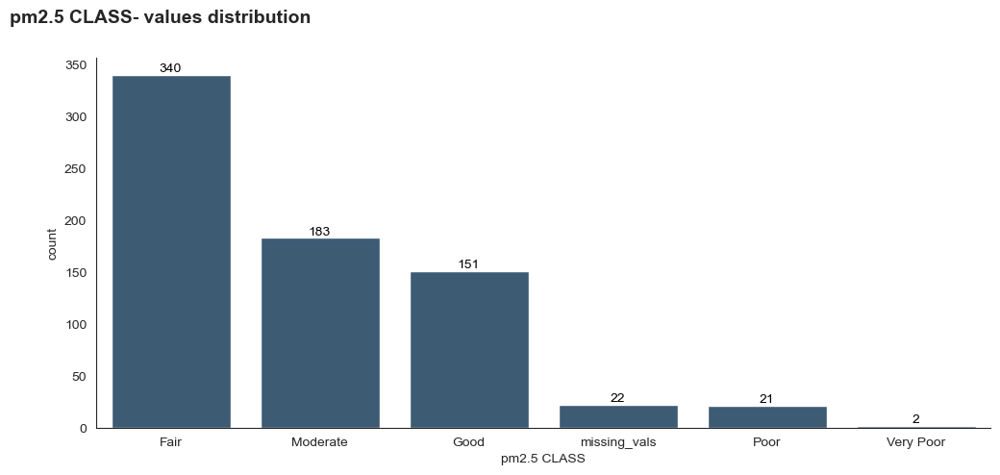

****************************************************************************************************
PM10 CLASS
Description of column pm10 CLASS
The column pm10 CLASS has 0 missing values


,pm10 CLASS values,Absolute frequency,Relative frequency (%)
0,Good,353,49.10
1,Fair,302,42.00
2,Moderate,42,5.84
3,missing_vals,22,3.06


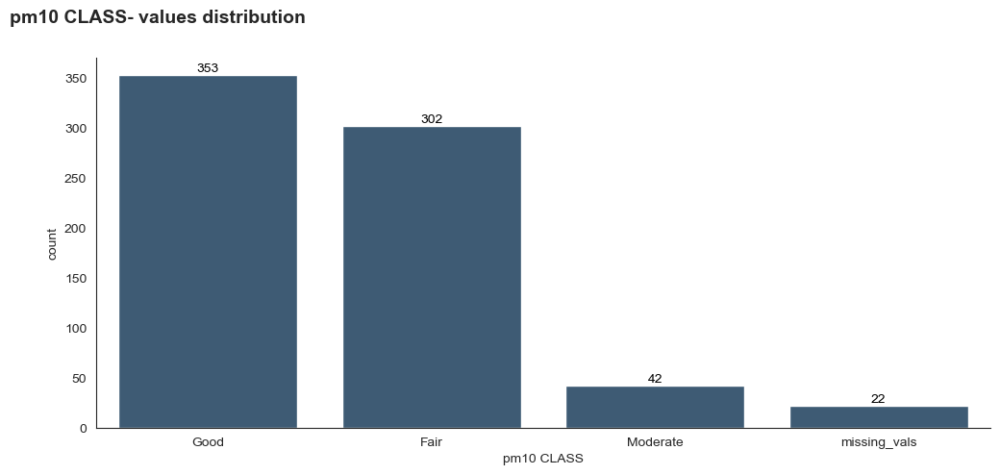

****************************************************************************************************
NO2 CLASS
Description of column no2 CLASS
The column no2 CLASS has 0 missing values


,no2 CLASS values,Absolute frequency,Relative frequency (%)
0,Good,513,71.35
1,Fair,148,20.58
2,Moderate,36,5.01
3,missing_vals,22,3.06


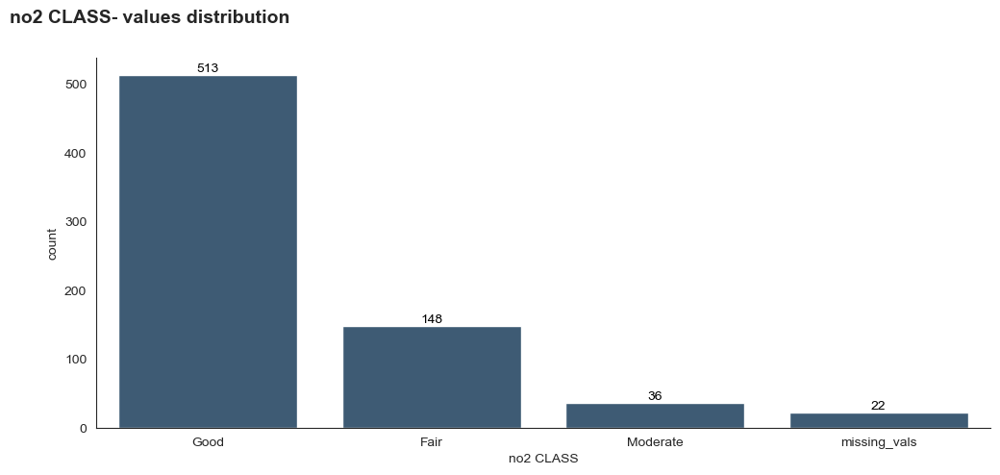

****************************************************************************************************
O3 CLASS
Description of column o3 CLASS
The column o3 CLASS has 0 missing values


,o3 CLASS values,Absolute frequency,Relative frequency (%)
0,Fair,265,36.86
1,Good,260,36.16
2,Poor,90,12.52
3,Moderate,78,10.85
4,missing_vals,22,3.06
5,Very Poor,4,0.56


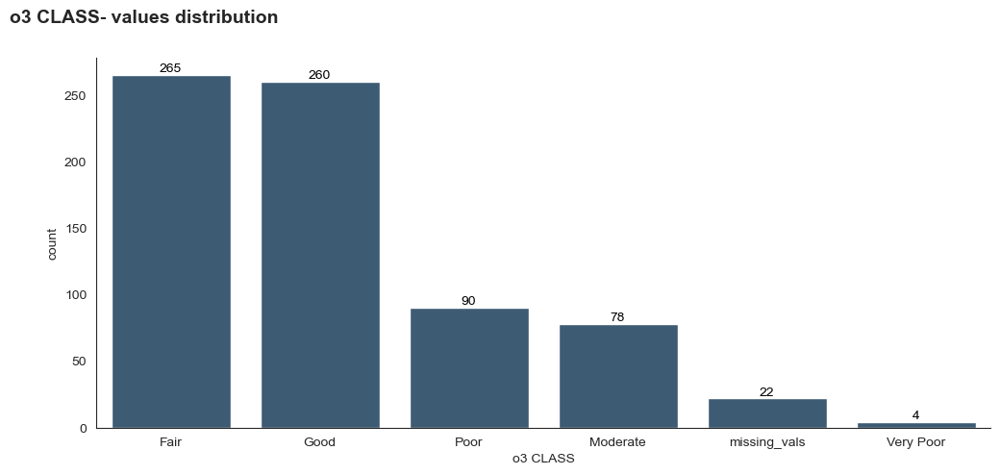

****************************************************************************************************
SO2 CLASS
Description of column so2 CLASS
The column so2 CLASS has 0 missing values


,so2 CLASS values,Absolute frequency,Relative frequency (%)
0,Good,697,96.94
1,missing_vals,22,3.06


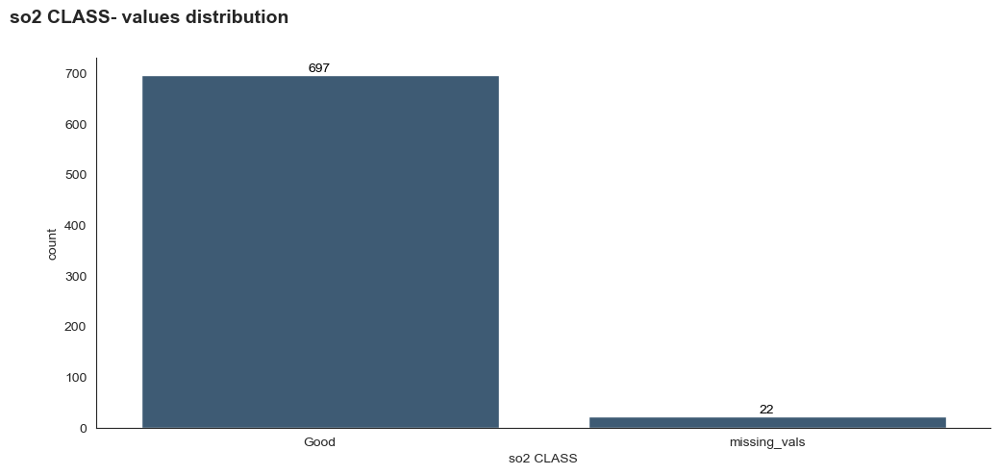

****************************************************************************************************
MONTH OF YEAR
Description of column month of year
The column month of year has 0 missing values


,month of year values,Absolute frequency,Relative frequency (%)
0,March,62,8.62
1,August,62,8.62
2,July,62,8.62
3,May,62,8.62
4,December,62,8.62
5,October,62,8.62
6,April,60,8.34
7,June,60,8.34
8,September,60,8.34
9,November,60,8.34


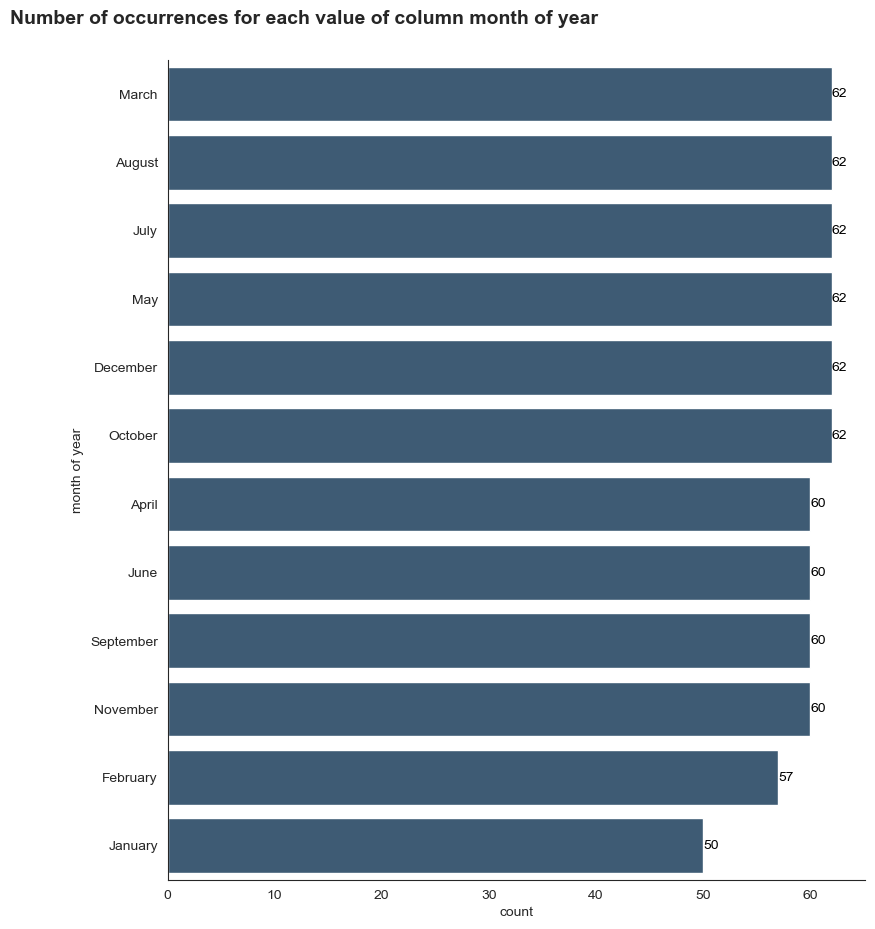

****************************************************************************************************
YEAR
Description of column year
The column year has 0 missing values


,year values,Absolute frequency,Relative frequency (%)
0,2025,365,50.76
1,2024,354,49.24


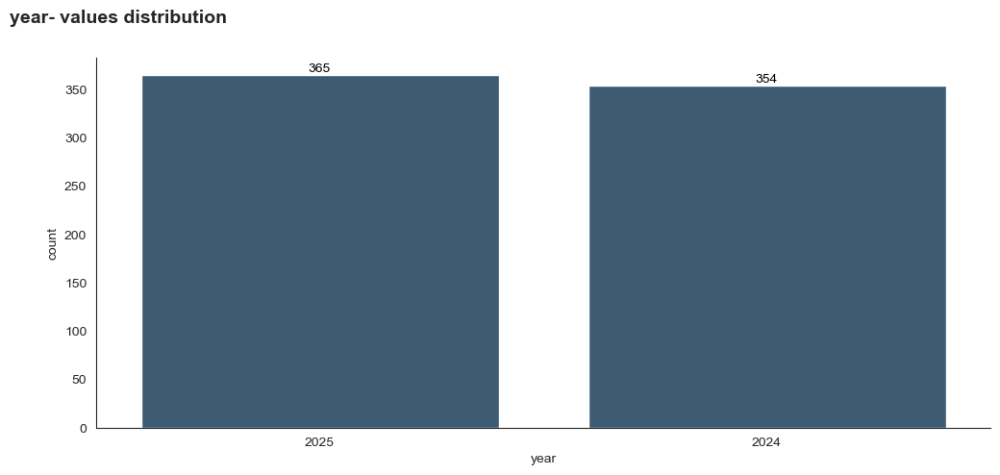

In [17]:
for c in data.columns:
    print('*'*100)
    print(c.upper())
    if (data[c].dtype == 'object' and data[c].nunique() < 7):
        describe_cat_column(data,c)
    elif (data[c].dtype == 'object' and data[c].nunique() >= 7):
        describe_cat_column_h(data,c)
    else:
        describe_column(data,c, scale = False)

The "PRECIPITATION TOTAL" column needs to be transformed because the vast majority of days had no precipitations at all, a numeric column with this distribution is not very effective.

In [18]:
display(pd.DataFrame(data['PRECIPITATION TOTAL'].describe()).reset_index())

,index,PRECIPITATION TOTAL
0,count,719.000000
1,mean,4.250070
2,std,13.636347
3,min,0.000000
4,25%,0.000000
5,50%,0.000000
6,75%,1.200000
7,max,186.200000


In [19]:
print('Percentual of days without rain',
      round((data[data['PRECIPITATION TOTAL'] == 0].shape[0]/data.shape[0])*100,2),'%')

Percentual of days without rain 66.2 %


It is possible to check what is the rainy days distribution.

In [20]:
rainy_days = data[data['PRECIPITATION TOTAL'] != 0].copy()

In [21]:
display(pd.DataFrame(rainy_days['PRECIPITATION TOTAL'].describe()).reset_index())

,index,PRECIPITATION TOTAL
0,count,243.000000
1,mean,12.575309
2,std,21.132386
3,min,0.200000
4,25%,1.200000
5,50%,4.200000
6,75%,15.700000
7,max,186.200000


Description of column PRECIPITATION TOTAL
The column PRECIPITATION TOTAL has 0 missing values
The column PRECIPITATION TOTAL has 0 zero values


,count,mean,std,min,25%,50%,75%,max
PRECIPITATION TOTAL,243.0,12.575309,21.132386,0.2,1.2,4.2,15.7,186.2


Skew of the column: 4.128602102522828


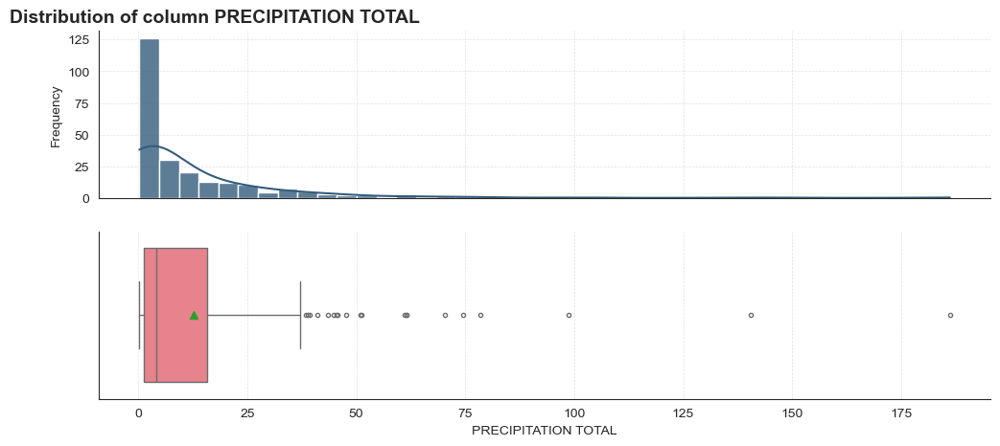

In [22]:
describe_column(rainy_days,'PRECIPITATION TOTAL', scale = False)

Even taking into account only rainy days this column is too much skewed: the best approach is to transform the column in a categorical one, determining Rain Classes seeing how the column values get binned together.

In [23]:
discretizer = KBinsDiscretizer(n_bins = 6, encode='ordinal', strategy='kmeans',
                               random_state = 0).fit(pd.DataFrame(rainy_days['PRECIPITATION TOTAL']))

In [24]:
rain_bins = discretizer.bin_edges_[0].tolist()
rain_bins.insert(0, 0.0)
del rain_bins[-1]

After having grouped the numeric data in different bins, a check to the boundaries of those bin is made to determine a transformation in a categorical column, that could also be potentially reaused.

In [25]:
display(rain_bins)

[0.0,
 0.2,
 10.479957805907176,
 30.689393939393938,
 61.785227272727276,
 110.5125,
 163.35]

In [26]:
def rain_classes(rain):
    if rain == 0.0:
        return 'no rain'
    elif rain <= rain_bins[1]:
        return'very light rain'
    elif rain <= rain_bins[2]:
        return 'light rain'
    elif rain <= rain_bins[3]:
        return 'normal rain'
    elif rain <= rain_bins[4]:
        return 'heavy rain'
    elif rain <= rain_bins[5]:
        return 'very heavy rain'
    else:
        return 'exceptional rain'

In [27]:
data['Rain Classes'] = data['PRECIPITATION TOTAL'].apply(rain_classes)

Description of column Rain Classes
The column Rain Classes has 0 missing values


,Rain Classes values,Absolute frequency,Relative frequency (%)
0,no rain,476,66.20
1,light rain,134,18.64
2,normal rain,57,7.93
3,very light rain,24,3.34
4,heavy rain,22,3.06
5,very heavy rain,4,0.56
6,exceptional rain,2,0.28


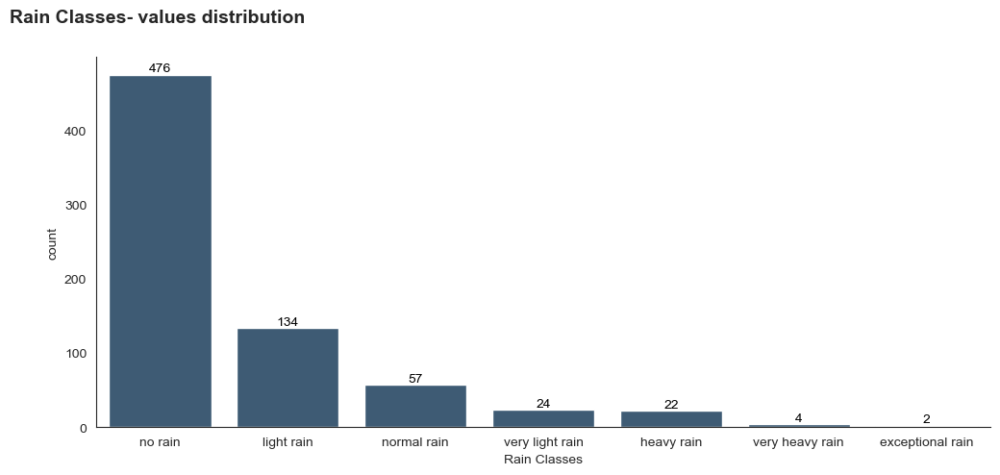

In [28]:
describe_cat_column(data,'Rain Classes')

In [29]:
data.drop('PRECIPITATION TOTAL', axis = 1, inplace = True)

### 🔎 Final Remarks on the Univariate Analysis

#### 🌫️ Main pollutants
**PM2.5**

The distribution of PM2.5 is clearly positively skewed, characterized by:

- A concentration of observations in low-to-moderate ranges,
- A pronounced right tail,
- The presence of episodic high-value outliers.
- The median appears more representative of central tendency than the mean, which is influenced by extreme pollution events.
- The variability suggests alternating periods of relative stability and days marked by significant accumulation.

**O₃ (Ozone)**

Ozone exhibits a different distributional structure:

Greater dispersion during warmer months,

A more symmetric shape compared to PM2.5,

A seasonally varying range of values.

A clear seasonal component is observable, with higher average levels during periods of increased solar radiation.

#### 🌡️ Meteorological Variables
**Temperature**

Temperature displays a distribution consistent with local climatic seasonality:

- Wide annual range,
- Bimodal tendency reflecting cold and warm seasons.
- No structural anomalies are observed in its distribution.

**Humidity**

Humidity shows:

- A relatively concentrated distribution,
- Moderate dispersion during unstable atmospheric periods,
- No pronounced extreme tails.

**Wind Speed**

Wind speed presents an asymmetric distribution:

- Frequent low-to-moderate values,
- Relatively rare high-intensity wind events.
- This suggests that calm atmospheric conditions are common within the observation period.

**Wind Direction**

Wind direction is not uniformly distributed:

- Certain prevailing directions appear more frequently,
- Others are less represented.

This indicates recurrent local circulation patterns.

**Precipitation**

Precipitation is strongly zero-inflated:

- High frequency of dry days,
- Few events with significant rainfall accumulation.

The resulting distribution is highly skewed: with ~66% of days being dry, the transformation of precipitation into categorical Rain Classes is crucial.

#### 🎯 Summary

Overall, the univariate analysis reveals that:

- Most variables do not follow Gaussian distributions.
- Several phenomena are characterized by rare but intense events.
- Seasonal structure plays a significant role in multiple variables.
- Dispersion varies substantially across different measurements.

## Analysis autocorrelation of main pollutants

To support the specification of the quantile regression models, the Partial Autocorrelation Function (PACF) of PM2.5 and O₃ is analyzed. Even though the final models include multiple exogenous predictors, the PACF helps identify the appropriate number of lagged dependent variables to include, ensuring that the temporal persistence of the series is properly captured and reducing residual autocorrelation across quantiles.

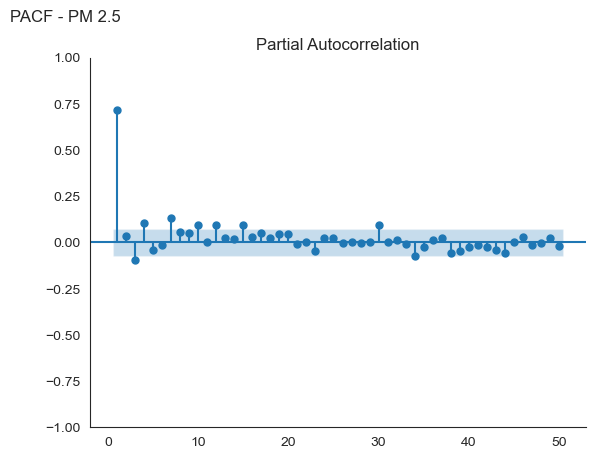

In [30]:
plot_pacf(data['pm2.5'].interpolate(), lags=50, zero = False)
plt.suptitle("PACF - PM 2.5", ha = 'left', x = 0)
sns.despine()
plt.show()

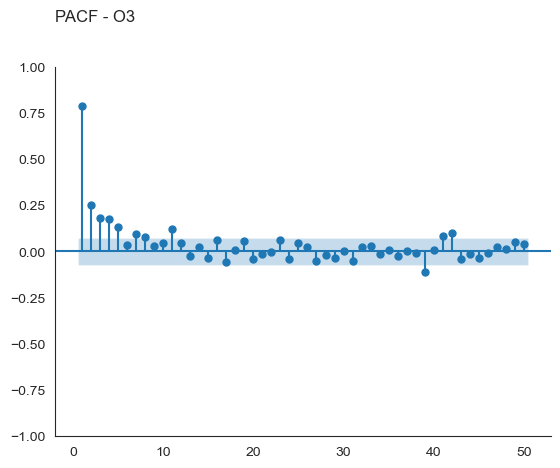

In [31]:
plot_pacf(data['o3'].interpolate(), lags=50, zero = False)
plt.title("PACF - O3", ha = 'left', x = 0, y = 1.1)
sns.despine()
plt.show()

For PM2.5, the PACF shows a strong and significant spike at lag 1, suggesting that including the first lag is sufficient to account for its serial dependence. In contrast, O₃ exhibits significant partial autocorrelations at lag 1 and, while a lot lower, also at lag 2, indicating a more persistent dynamic structure.

Anyway for both the first lag is by far the most significant and, also for homogeneity, it will be the only one used (knowing that the O₃ could maybe improve a bit more adding the second one as well).

Before proceeding to the Bivariate Analysis multiple additional columns are created, using past values of many features, and also their rolling mean, as feature to determine future values. It is really important to keep into consideration how conditions in past days influence current pollutants levels.

In [32]:
for ind in data.columns[:5]:
    data['PREV_'+ind] = data[ind].shift(1)
    data['PREV_RMEAN_'+ind] = data[ind].interpolate().rolling(window=3, min_periods=1).mean().shift(1)

In [33]:
for ind in ['HUMIDITY avg','HUMIDITY min','AIR TEMP T avg', 'AIR TEMP T max',
            'WIND speed gust','Rain Classes']: #,'HUMIDITY time min'
    data['PREV_'+ind] = data[ind].shift(1)
    if ind != 'Rain Classes' and ind != 'HUMIDITY time min':
        data['RMEAN_'+ind] = data[ind].rolling(window=3, min_periods=1).mean()

## Bivariate Analysis

In [34]:
data.drop(['so2','so2 CLASS','no2','no2 CLASS'], axis = 1, inplace = True)

In [35]:
data['PREV_so2'] = data['PREV_so2'].astype(str)

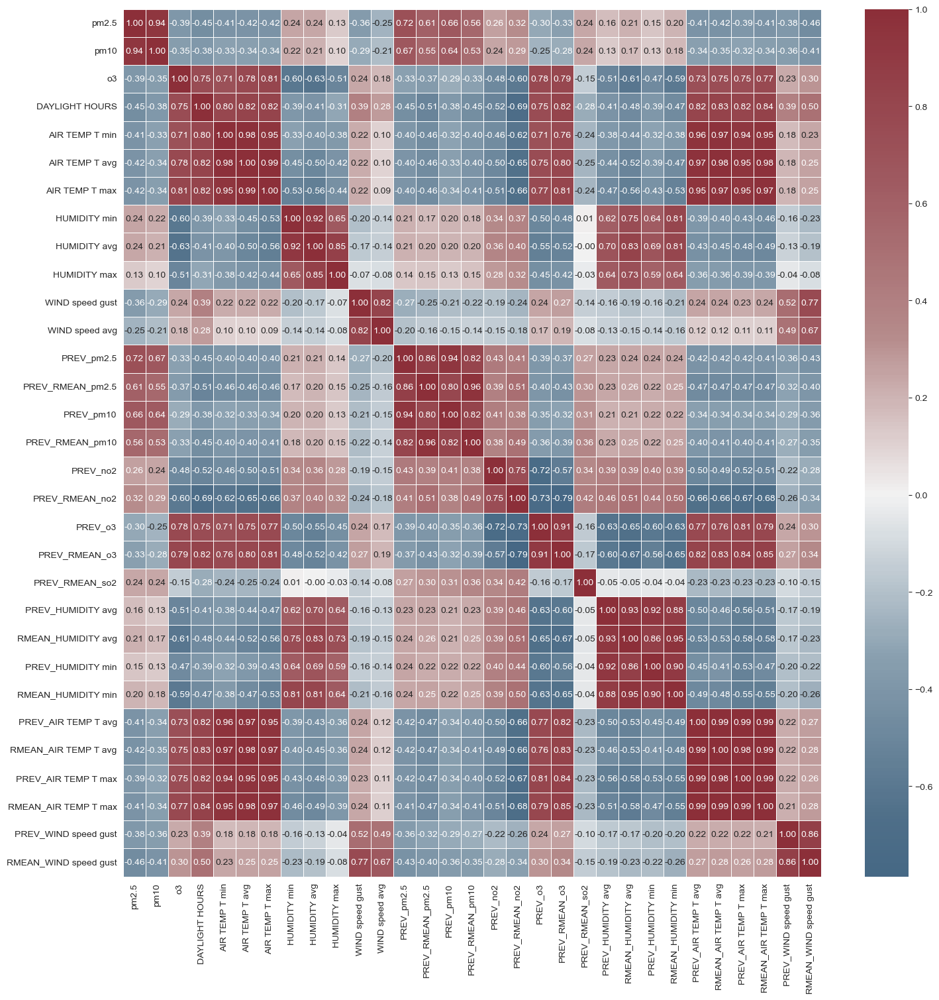

In [36]:
num_cols = data.select_dtypes(exclude = 'object').columns

plt.figure(figsize = (17, 17))
sns.heatmap(data[num_cols].corr(), annot = True, fmt = '0.2f', cmap= hcmap, center=0, linewidths=0.5)
plt.show()

### 🔗 Correlation Matrix Interpretation

Several clear structural patterns emerge.

#### 🌫️ Relationships Among Pollutants

- PM2.5 and PM10 show a very strong positive correlation (≈ 0.94), indicating that fine and coarse particulate matter tend to increase and decrease together, likely reflecting shared emission sources or common atmospheric accumulation conditions.
- O₃ (ozone) is negatively correlated with particulate matter (around -0.35 / -0.40), suggesting that the atmospheric conditions favoring ozone formation differ from those driving particulate accumulation.

This confirms that the two pollutants exhibit distinct behavioral regimes.

#### 🌡️ Temperature and Solar Variables

Daylight hours show strong positive correlations with:

- O₃ (≈ 0.75),
- Air temperature (min/avg/max all above 0.80).

Air temperature variables are almost perfectly correlated with each other (min, avg, max > 0.95), indicating strong internal coherence and seasonal structure.

Ozone’s strong positive association with temperature and daylight supports its known seasonal behavior.

#### 💧 Humidity

- Humidity (min/avg/max) shows strong internal correlations (> 0.80).
- It is negatively correlated with O₃ (around -0.60).
- Correlation with PM2.5 is weaker and slightly positive in some cases.

This suggests that humid conditions may suppress ozone formation, while their relationship with particulate matter appears more nuanced.

#### 💨 Wind Variables

- Wind gust and average wind speed are strongly correlated (> 0.80).
- Both are negatively correlated with PM2.5 (around -0.30 to -0.40).

This indicates that higher wind intensity is associated with lower particulate concentration, consistent with dispersion effects.

Correlations with ozone are weaker.

#### ⏳ Lagged and Rolling Variables

Lagged pollutant values (e.g., PREV_pm2.5, PREV_pm10) exhibit strong positive correlations with current values (≈ 0.70–0.80), indicating temporal continuity.

Rolling means show even stronger associations with current pollutant levels, reflecting the smoothing of short-term variability.

These high correlations confirm the presence of temporal persistence, particularly for particulate matter.

#### 📊 Structural Observations

Several broader statistical patterns can be noted:

- Strong blocks of high correlation within homogeneous variable groups (temperature, humidity, wind).
- Clear seasonal structure linking daylight, temperature, and ozone.
- Negative associations between dispersion-related variables (wind) and particulate concentration.
- Moderate to strong persistence effects in pollutants.
- Absence of extreme multicollinearity across fundamentally different meteorological domains (e.g., wind vs humidity vs radiation).

#### 🎯 Overall Interpretation

The matrix highlights a structured atmospheric system characterized by:

- A particulate regime associated with calm and potentially dry conditions.
- An ozone regime associated with warmth and solar radiation.
- Strong internal coherence within meteorological variable families.
- Clear temporal continuity in pollutant concentrations.

While correlation does not imply causation, the matrix provides a consistent and interpretable descriptive picture of the atmospheric dynamics captured in the dataset.

## Relationship Between Main Pollutants and EU AQI

The result of the Chi Squared test makes us reject the null hypotesys, so the column eu aqi and the column pm2.5 CLASS are dependent to each other


pm2.5 CLASS,Fair,Good,Moderate,Poor,Very Poor
eu aqi,,,,,
Good,0,18,0,0,0
Fair,198,105,0,0,0
Moderate,65,22,172,0,0
Poor,76,6,8,21,0
Very Poor,1,0,3,0,2


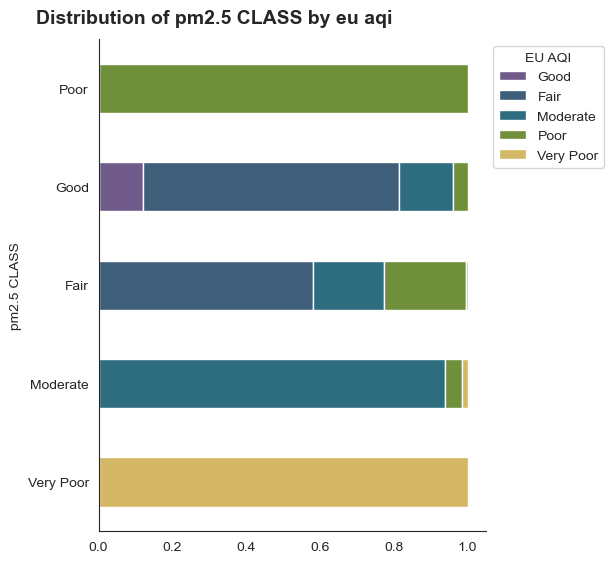

The result of the Chi Squared test makes us reject the null hypotesys, so the column eu aqi and the column pm10 CLASS are dependent to each other


pm10 CLASS,Fair,Good,Moderate
eu aqi,,,
Good,0,18,0
Fair,77,226,0
Moderate,180,60,19
Poor,42,48,21
Very Poor,3,1,2


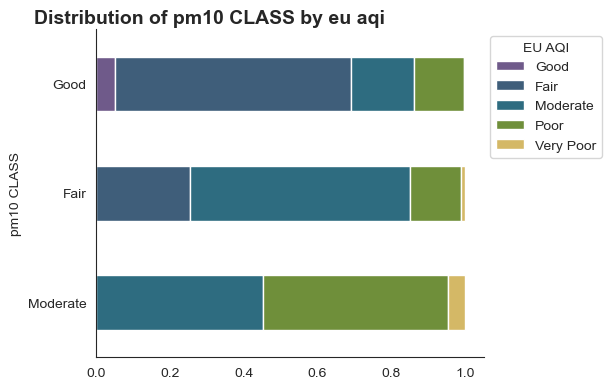

The result of the Chi Squared test makes us reject the null hypotesys, so the column pm2.5 CLASS and the column pm10 CLASS are dependent to each other


pm10 CLASS,Fair,Good,Moderate
pm2.5 CLASS,,,
Good,2,149,0
Fair,135,204,1
Moderate,165,0,18
Poor,0,0,21
Very Poor,0,0,2


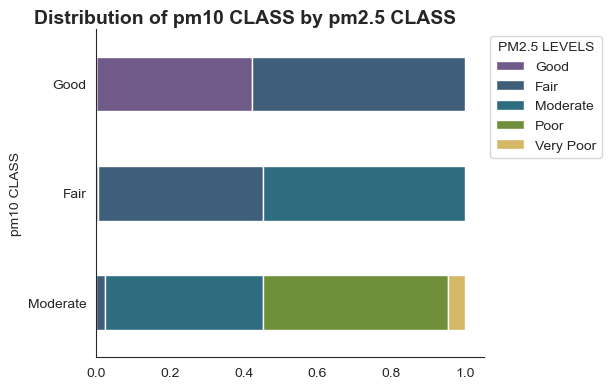

The result of the Chi Squared test makes us reject the null hypotesys, so the column eu aqi and the column o3 CLASS are dependent to each other


o3 CLASS,Fair,Good,Moderate,Poor,Very Poor
eu aqi,,,,,
Good,0,18,0,0,0
Fair,219,84,0,0,0
Moderate,41,141,77,0,0
Poor,3,17,1,90,0
Very Poor,2,0,0,0,4


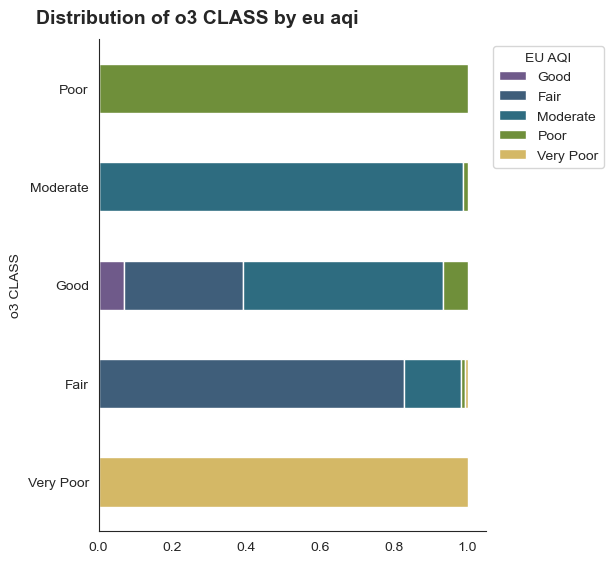

The result of the Chi Squared test makes us reject the null hypotesys, so the column pm2.5 CLASS and the column o3 CLASS are dependent to each other


o3 CLASS,Fair,Good,Moderate,Poor,Very Poor
pm2.5 CLASS,,,,,
Good,91,34,20,6,0
Fair,132,77,54,76,1
Moderate,37,132,3,8,3
Poor,3,17,1,0,0
Very Poor,2,0,0,0,0


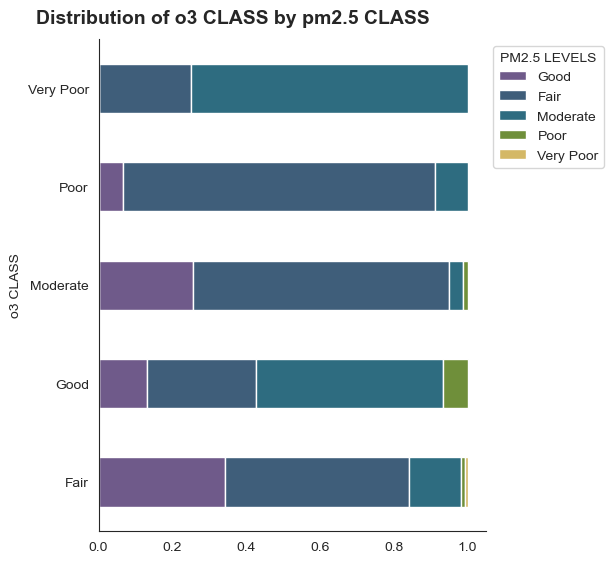

In [37]:
cat_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'eu aqi','pm2.5 CLASS','EU AQI',
           ['Good','Fair','Moderate','Poor','Very Poor'])

cat_cat_rel(data[data['pm10 CLASS'] != 'missing_vals'],'eu aqi','pm10 CLASS','EU AQI',
           ['Good','Fair','Moderate','Poor','Very Poor'])

cat_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'pm2.5 CLASS','pm10 CLASS','PM2.5 LEVELS',
           ['Good','Fair','Moderate','Poor','Very Poor'])

cat_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'eu aqi','o3 CLASS','EU AQI',
           ['Good','Fair','Moderate','Poor','Very Poor'])

cat_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'pm2.5 CLASS','o3 CLASS','PM2.5 LEVELS',
           ['Good','Fair','Moderate','Poor','Very Poor'])

#### Intermediate Remarks on EU AQI Daily Classes

The comparison between **EU AQI daily categories** and pollutant classes highlights several consistent patterns.

- **PM2.5** shows the strongest alignment with AQI levels: higher AQI categories (Poor, Very Poor) are predominantly associated with elevated PM2.5 classes, while Good AQI days largely correspond to lower particulate levels. This suggests a clear structural link between fine particulate concentration and overall air quality classification.
- **PM10** follows a similar trend, although with slightly greater overlap across intermediate categories, indicating a more gradual contribution to AQI deterioration.
- **Ozone (O₃)** presents a more regime-specific pattern: higher AQI classes tend to concentrate in higher ozone categories, but intermediate AQI levels display greater variability. This suggests that ozone-driven events may occur under more specific atmospheric conditions compared to particulate accumulation.

Overall, the distributions indicate that *AQI worsening does not stem from a single uniform mechanism*. **Particulate matter** appears to *contribute consistently across multiple classes*, while **ozone** shows more *distinct peaks*. Intermediate AQI levels exhibit higher internal heterogeneity, whereas extreme categories are more clearly dominated by specific pollutant regimes.

## Significant relationships between weather data and and with time periods

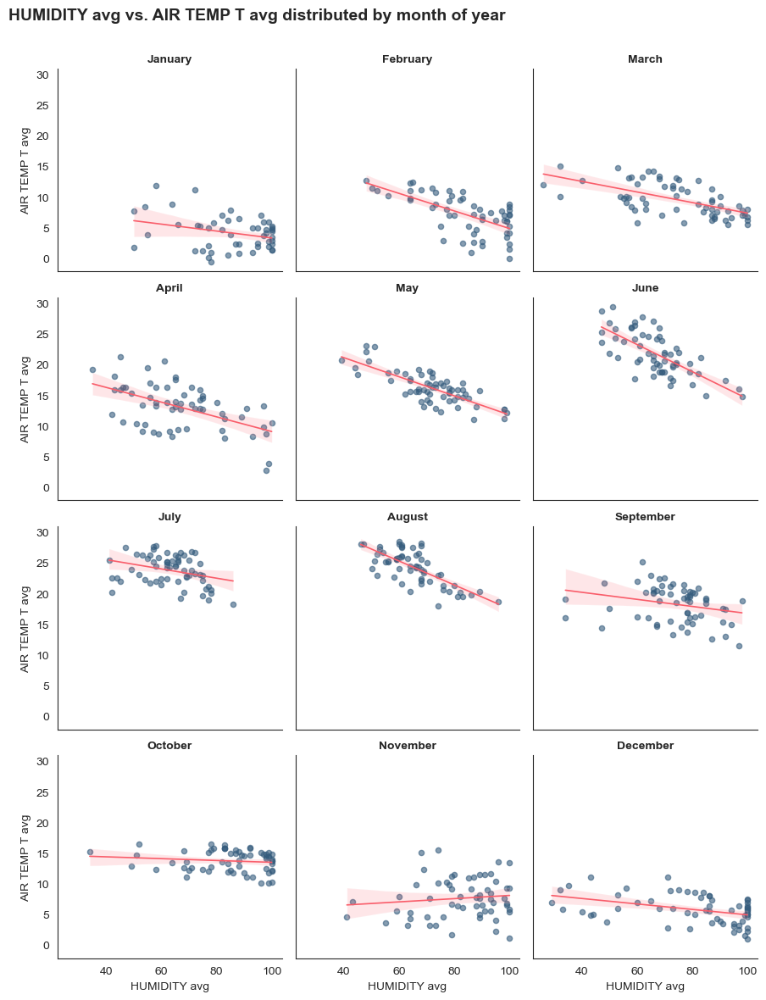


 Correlation test between HUMIDITY avg and AIR TEMP T avg 

The correlation between HUMIDITY avg and AIR TEMP T avg is -0.50177


 ANOVA test between the values of  HUMIDITY avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


In [38]:
numx_numy_cat_rel(data,'HUMIDITY avg','AIR TEMP T avg','month of year','Month of year')

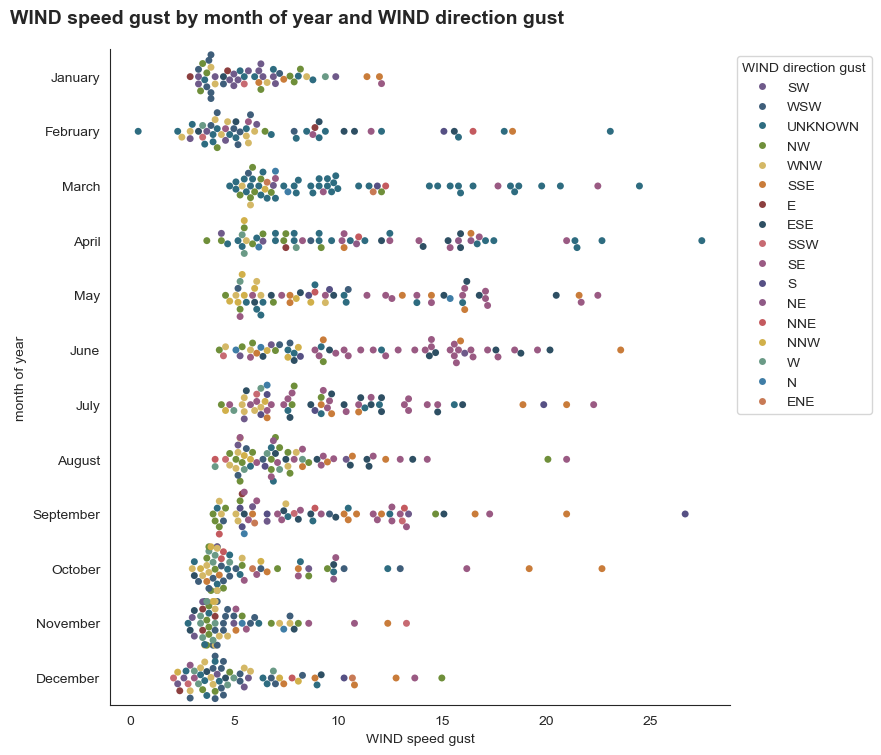



 ANOVA test between the values of  WIND speed gust based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  WIND speed gust based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 Chi-Squared test between the elements of  WIND direction gust and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column WIND direction gust and the column month of year are dependent to each other


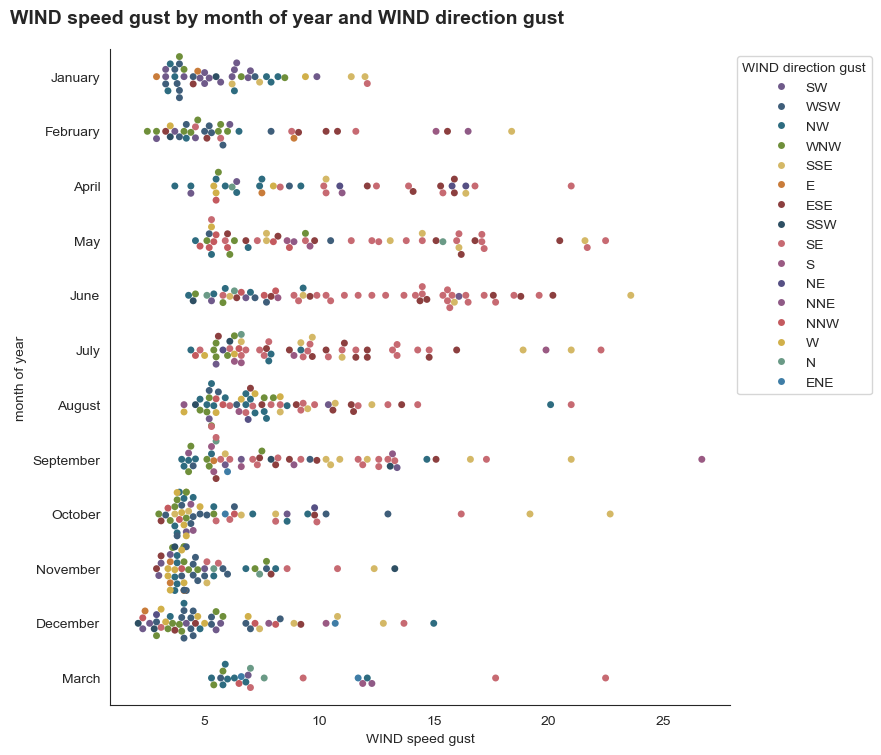



 ANOVA test between the values of  WIND speed gust based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  WIND speed gust based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 Chi-Squared test between the elements of  WIND direction gust and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column WIND direction gust and the column month of year are dependent to each other


In [39]:
numx_caty_cat_rel(data,'WIND speed gust','month of year','WIND direction gust')
numx_caty_cat_rel(data[data['WIND direction gust'] != 'UNKNOWN'],'WIND speed gust','month of year','WIND direction gust')

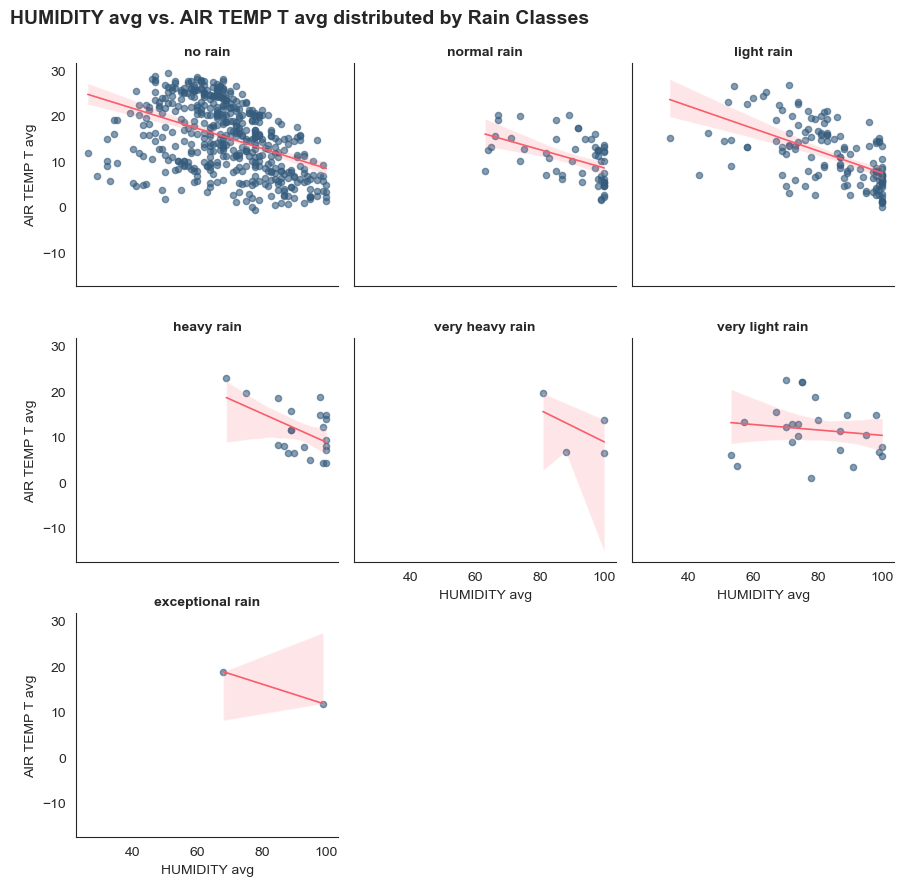


 Correlation test between HUMIDITY avg and AIR TEMP T avg 

The correlation between HUMIDITY avg and AIR TEMP T avg is -0.50177


 ANOVA test between the values of  HUMIDITY avg based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


In [40]:
numx_numy_cat_rel(data,'HUMIDITY avg','AIR TEMP T avg','Rain Classes','Rain Intensity',
                 ['no rain','very light rain','light rain','normal rain','heavy rain','very heavy rain','exceptional rain'])

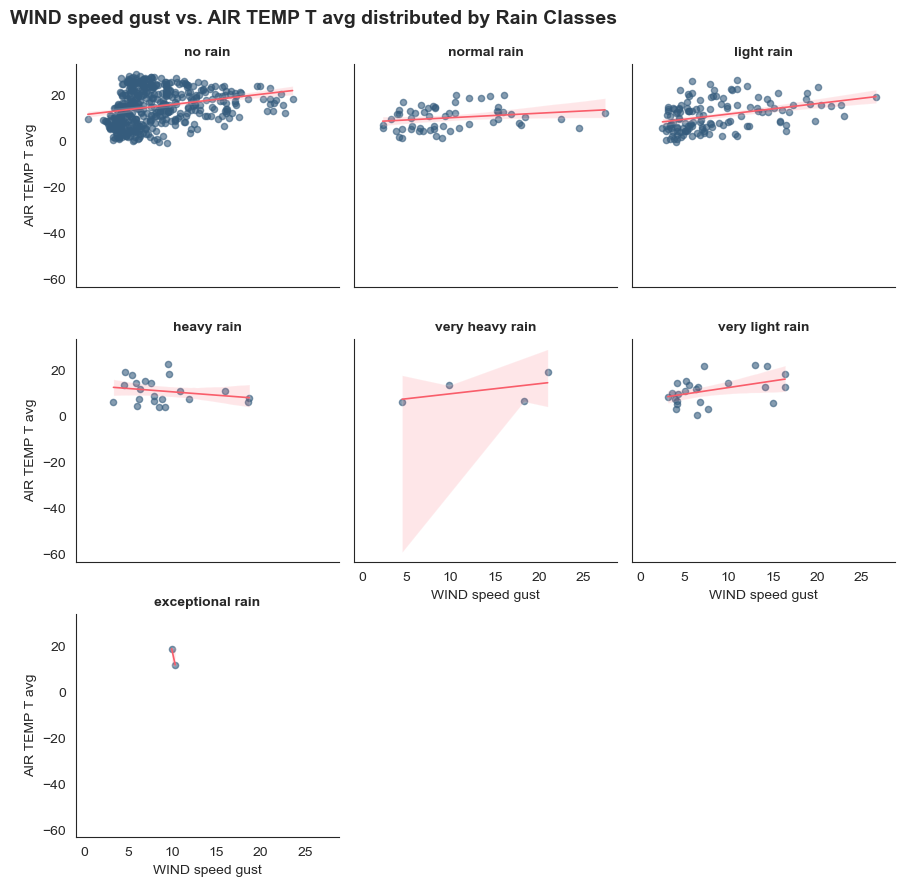


 Correlation test between WIND speed gust and AIR TEMP T avg 

The correlation between WIND speed gust and AIR TEMP T avg is 0.2242


 ANOVA test between the values of  WIND speed gust based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column WIND speed gust is 0.05218 so the median of WIND speed gust for the different groups does not show relevant deviations.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


In [41]:
numx_numy_cat_rel(data,'WIND speed gust','AIR TEMP T avg','Rain Classes','Rain Intensity',
                 ['no rain','very light rain','light rain','normal rain','heavy rain','very heavy rain','exceptional rain'])

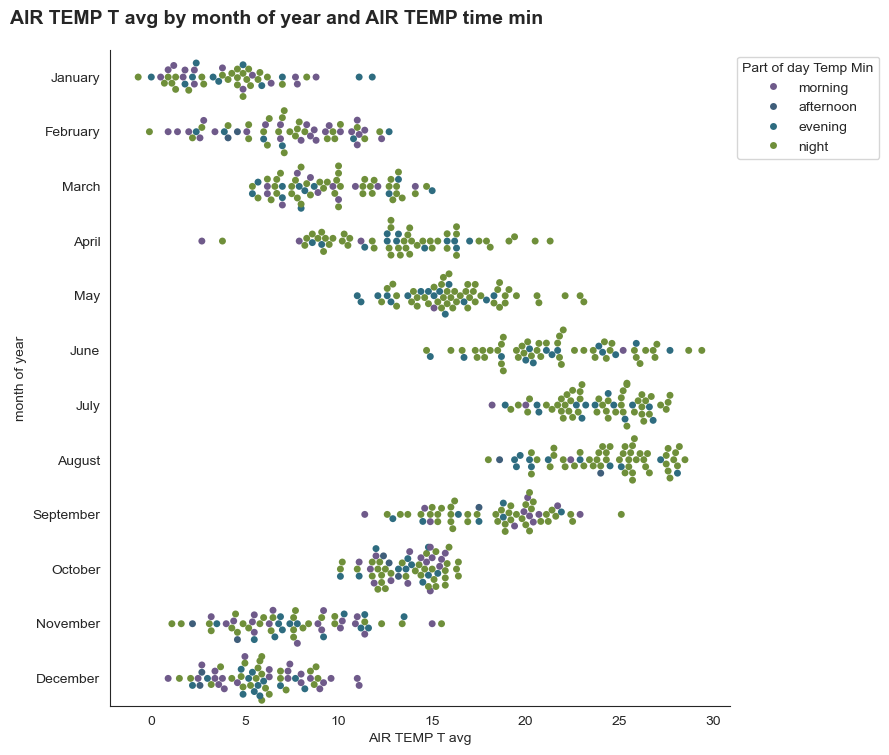



 ANOVA test between the values of  AIR TEMP T avg based on the groups of AIR TEMP time min 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time min and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 Chi-Squared test between the elements of  AIR TEMP time min and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column AIR TEMP time min and the column month of year are dependent to each other


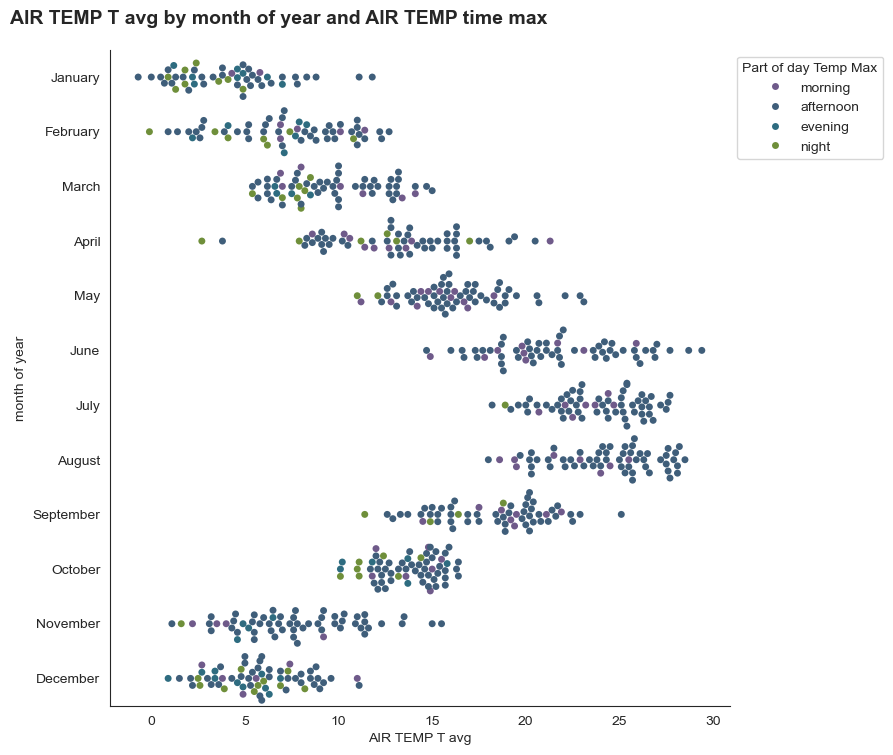



 ANOVA test between the values of  AIR TEMP T avg based on the groups of AIR TEMP time max 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time max and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 Chi-Squared test between the elements of  AIR TEMP time max and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column AIR TEMP time max and the column month of year are dependent to each other


In [42]:
numx_caty_cat_rel(data,'AIR TEMP T avg','month of year','AIR TEMP time min','Part of day Temp Min',
                 ['morning','afternoon','evening','night'])
numx_caty_cat_rel(data,'AIR TEMP T avg','month of year','AIR TEMP time max','Part of day Temp Max',
                 ['morning','afternoon','evening','night'])

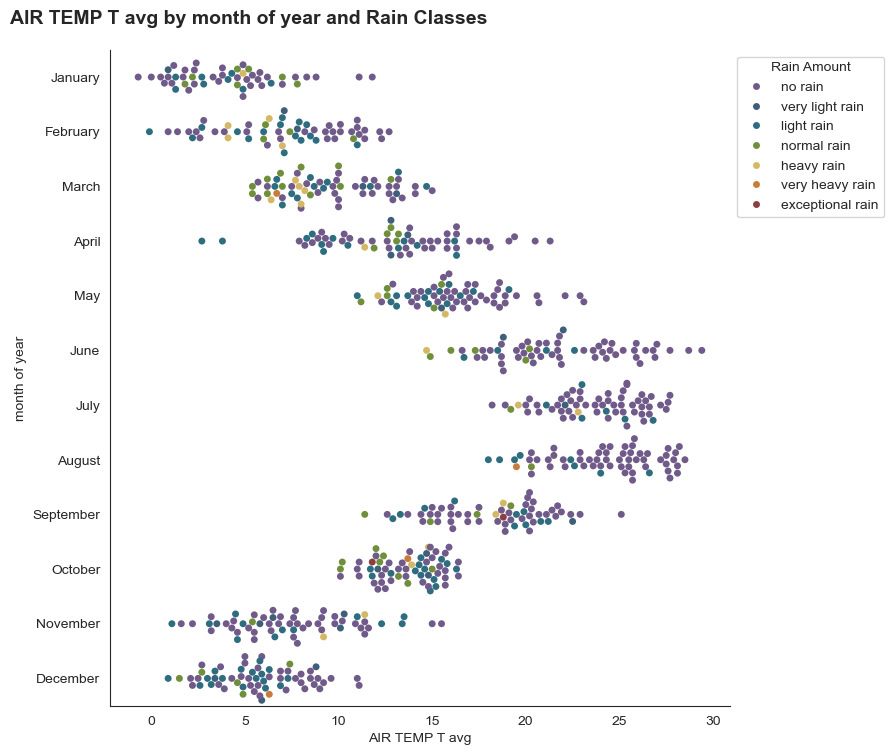



 ANOVA test between the values of  AIR TEMP T avg based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 Chi-Squared test between the elements of  Rain Classes and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.02566 makes us reject the null hypotesys, so the column Rain Classes and the column month of year are dependent to each other


In [43]:
numx_caty_cat_rel(data,'AIR TEMP T avg','month of year','Rain Classes','Rain Amount',
                 ['no rain','very light rain','light rain','normal rain','heavy rain','very heavy rain',
                 'exceptional rain'])

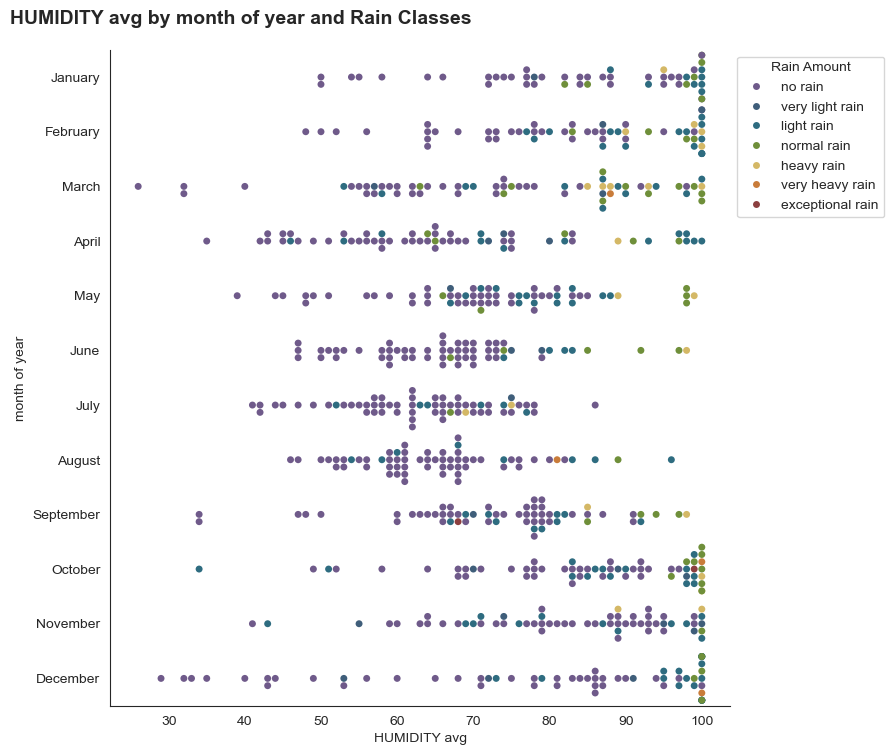



 ANOVA test between the values of  HUMIDITY avg based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 ANOVA test between the values of  HUMIDITY avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 Chi-Squared test between the elements of  Rain Classes and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.02566 makes us reject the null hypotesys, so the column Rain Classes and the column month of year are dependent to each other
The result of the Chi Squared test makes us reject the null hypotesys, so the column Rain Classes and the column month of year are dependent to each

month of year,April,August,December,February,January,July,June,March,May,November,October,September
Rain Classes,,,,,,,,,,,,
no rain,38,52,36,31,33,52,48,31,40,40,33,42
very light rain,3,0,3,2,1,1,2,2,1,5,3,1
light rain,13,8,17,16,8,6,4,12,14,12,14,10
normal rain,5,1,5,4,7,1,5,11,5,1,8,4
heavy rain,1,0,0,4,1,2,1,5,2,2,2,2
very heavy rain,0,1,1,0,0,0,0,1,0,0,1,0
exceptional rain,0,0,0,0,0,0,0,0,0,0,1,1


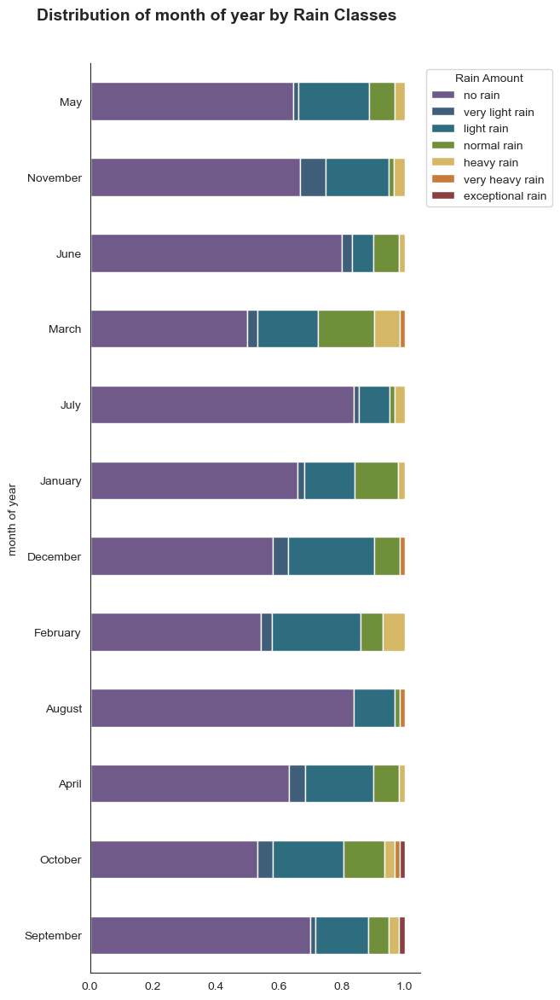

In [44]:
numx_caty_cat_rel(data,'HUMIDITY avg','month of year','Rain Classes','Rain Amount',
                 ['no rain','very light rain','light rain','normal rain','heavy rain','very heavy rain',
                 'exceptional rain'])
cat_cat_rel(data,'Rain Classes','month of year','Rain Amount',
                 ['no rain','very light rain','light rain','normal rain','heavy rain','very heavy rain',
                 'exceptional rain'])

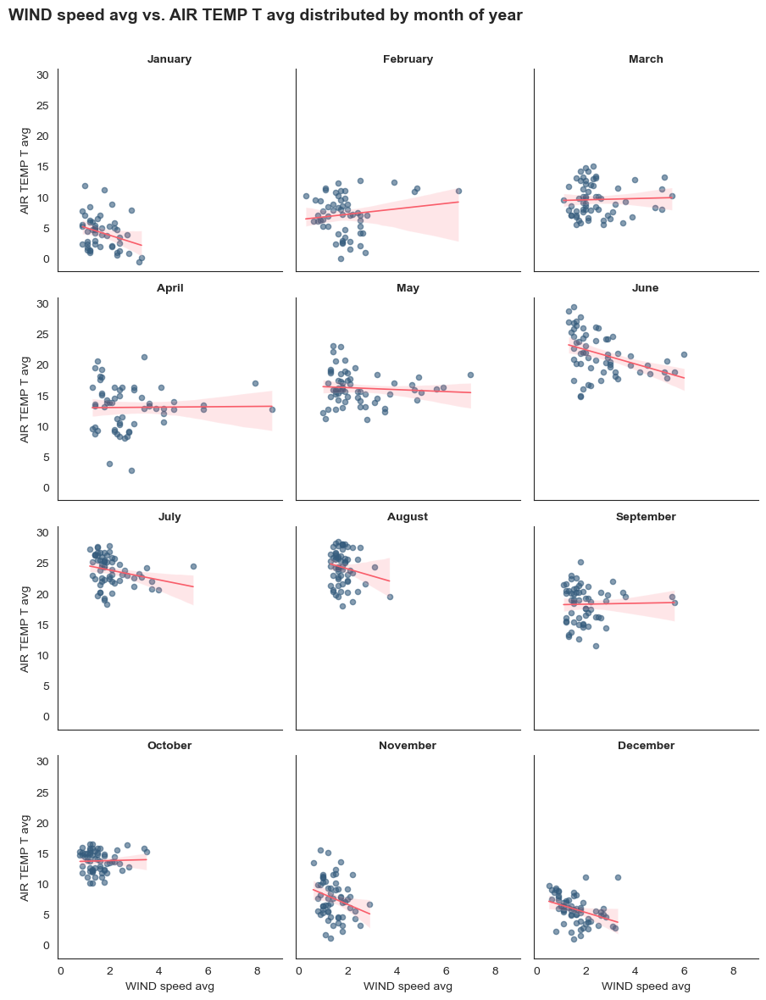


 Correlation test between WIND speed avg and AIR TEMP T avg 

The correlation between WIND speed avg and AIR TEMP T avg is 0.09693


 ANOVA test between the values of  WIND speed avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


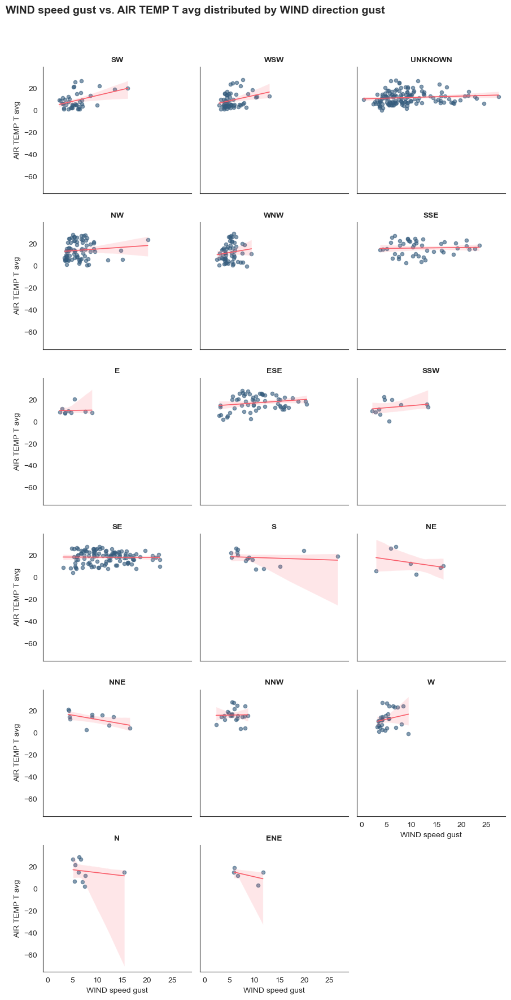


 Correlation test between WIND speed gust and AIR TEMP T avg 

The correlation between WIND speed gust and AIR TEMP T avg is 0.2242


 ANOVA test between the values of  WIND speed gust based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


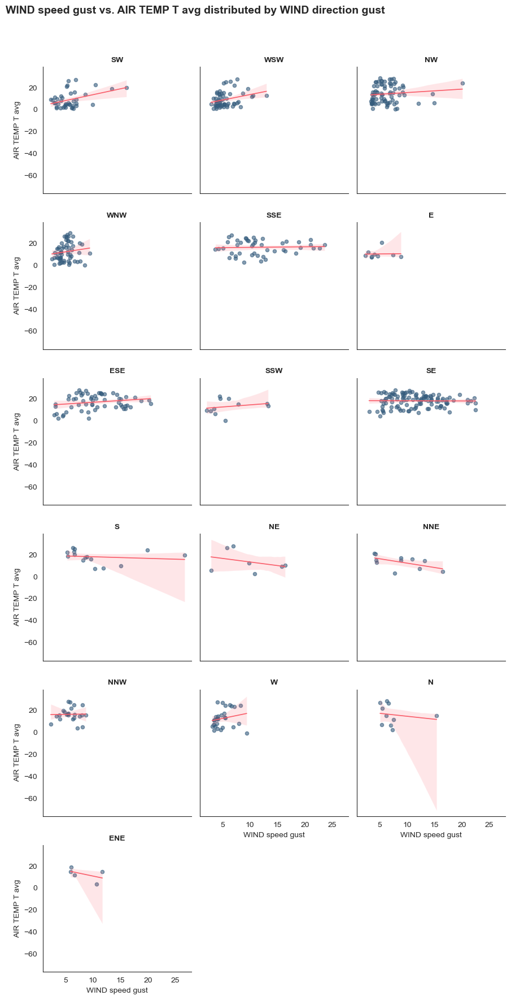


 Correlation test between WIND speed gust and AIR TEMP T avg 

The correlation between WIND speed gust and AIR TEMP T avg is 0.27034


 ANOVA test between the values of  WIND speed gust based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


In [45]:
numx_numy_cat_rel(data,'WIND speed avg','AIR TEMP T avg','month of year','Month of year')
numx_numy_cat_rel(data,'WIND speed gust','AIR TEMP T avg','WIND direction gust','Wind Gust Direction')
numx_numy_cat_rel(data[data['WIND direction gust'] != 'UNKNOWN'],'WIND speed gust','AIR TEMP T avg',
                  'WIND direction gust','Wind Gust Direction')

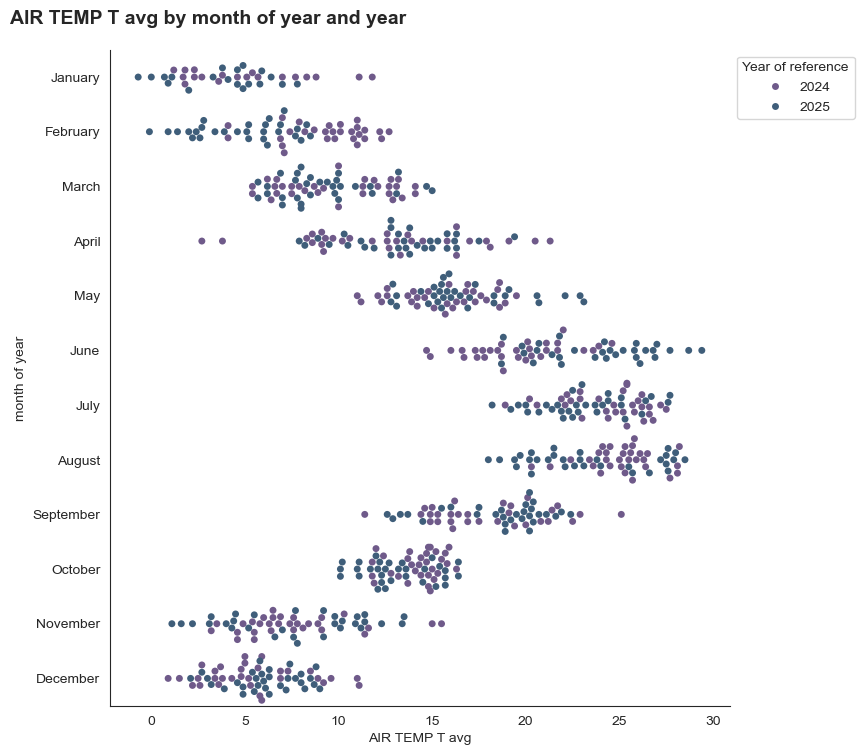



 ANOVA test between the values of  AIR TEMP T avg based on the groups of year 

The Kruskal-Wallis H-test for the different groups of the column year and the column AIR TEMP T avg is 0.70781 so the median of AIR TEMP T avg for the different groups does not show relevant deviations.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 Chi-Squared test between the elements of  year and those of month of year 

The result of the Chi Squared test, with a Pvalue of 1.0  does not leave us reject the null hypotesys that the column year and the column month of year are independent to each other


In [46]:
day_month = data.index.strftime('%d-%m')

listed_2024 = (data.index.year == 2024) & (day_month.isin(day_month[data.index.year == 2025]))
listed_2025 = (data.index.year == 2025) & (day_month.isin(day_month[data.index.year == 2024]))

data_year = data.loc[data.index[listed_2024 | listed_2025]]

numx_caty_cat_rel(data_year,'AIR TEMP T avg','month of year','year','Year of reference',
                 ['2024','2025'])

### 🌦️ Key Findings on Atmospheric Variables and Temporal Structure

The extended analysis confirms that atmospheric variables exhibit a strong seasonal organization combined with regime-dependent behavior linked to rainfall, wind intensity, wind direction, and time of day.

📅 **Seasonal Temperature Structure**

The distribution of average air temperature by month shows a clear and progressive seasonal cycle:

- Minimum values concentrate in winter (December-February),
- Transitional months (March-May, September-October) display intermediate and more dispersed ranges,
- Summer months (June-August) show higher and more compact clusters.

The comparison across time-of-day minima and maxima indicates consistent intra-daily structure:
night and morning values cluster at lower ranges, while afternoon values dominate higher temperature observations, particularly in late spring and summer.

**The split by reference year (2024 vs 2025) suggests overall seasonal coherence between years, without evident structural breaks**. Differences appear marginal and confined within normal seasonal variability.

💧 **Humidity–Temperature Dynamics**

- Across months, humidity and temperature maintain a generally inverse relationship, especially visible during transitional and summer periods.
- When stratified by rain classes, this relationship becomes more structured:
- Under no rain conditions, temperature shows wider dispersion, especially in warmer months.
- During light and normal rain, humidity concentrates at higher levels, while temperature remains seasonally consistent.
- Heavy and exceptional rain events show limited observations and increased variability, suggesting more unstable atmospheric configurations.
- The distribution of rain classes by month confirms a predominance of no-rain days across most of the year, with heavier precipitation concentrated in transitional seasons.

💨 **Wind Intensity and Seasonal Interaction**

The relationship between average wind speed and temperature by month reveals:

- Weak or slightly negative associations in summer months (June-August), possibly reflecting thermal-driven calm conditions.
- Mild positive or neutral associations in transitional periods.
- More pronounced negative tendencies in colder months (November-December).
- Wind gust intensity further confirms seasonal modulation: higher gust variability appears in spring and early summer, while winter shows generally lower dispersion.

🧭 **Wind Direction Regimes**

When stratifying wind gust vs temperature by wind direction, distinct directional regimes emerge:

- South-western and western components (SW, WSW, WNW, W) tend to associate with moderate-to-higher temperatures and show mild positive slopes.
- Northern and north-eastern components (N, NNE, NE) display greater variability and in some cases weaker or negative trends.
- Several minor directional classes exhibit limited observations, resulting in broader uncertainty bands.

This suggests that temperature dynamics are partially influenced by dominant circulation patterns, though the strength of association varies by direction.

🎯 **Interpretation**

The integrated temporal analysis reveals a coherent atmospheric system characterized by:

- Strong seasonal temperature progression,
- Stable intra-daily thermal structure,
- Inverse humidity-temperature coupling,
- Rainfall acting as a variability modifier rather than a structural disruptor,
- Wind intensity and direction introducing regime-specific modulation.

No abrupt discontinuities or structural anomalies emerge across months or between years, indicating consistent atmospheric behavior throughout the observation period.

These findings provide a consolidated understanding of the environmental background conditions in which pollutant dynamics evolve, highlighting the importance of seasonality and circulation regimes in shaping local atmospheric structure.

## PM 2.5

### Differences between 2024 and 2025 in the same period

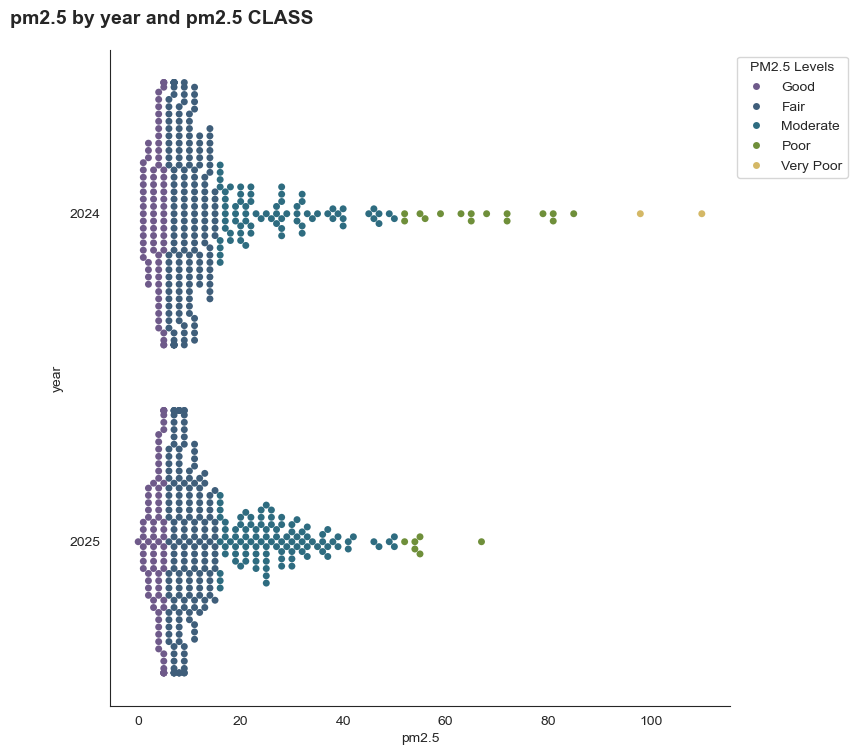



 ANOVA test between the values of  pm2.5 based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of year 

The Kruskal-Wallis H-test for the different groups of the column year and the column pm2.5 is 0.54541 so the median of pm2.5 for the different groups does not show relevant deviations.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of year 

The result of the Chi Squared test, with a Pvalue of 0.0421 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column year are dependent to each other


In [47]:
day_month = data.index.strftime('%d-%m')

listed_2024 = (data.index.year == 2024) & (day_month.isin(day_month[data.index.year == 2025]))
listed_2025 = (data.index.year == 2025) & (day_month.isin(day_month[data.index.year == 2024]))

data_year = data.loc[data.index[listed_2024 | listed_2025]]


numx_caty_cat_rel(data_year[data_year['pm2.5 CLASS'] != 'missing_vals'],'pm2.5','year','pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

📊 **PM2.5 Distribution by Year and Class**

**Both 2024 and 2025 show a similar overall structure**, with most observations concentrated in the Good and Fair classes and progressively fewer days in higher pollution categories.

The main difference lies in the upper tail: 2024 displays more extreme high PM2.5 values, including some Very Poor episodes, while 2025 appears more compact, with fewer pronounced outliers.

Overall, **the distribution remains broadly consistent across years**, with slightly greater variability in 2024.

### Relationship between PM 2.5 levels and air temperature

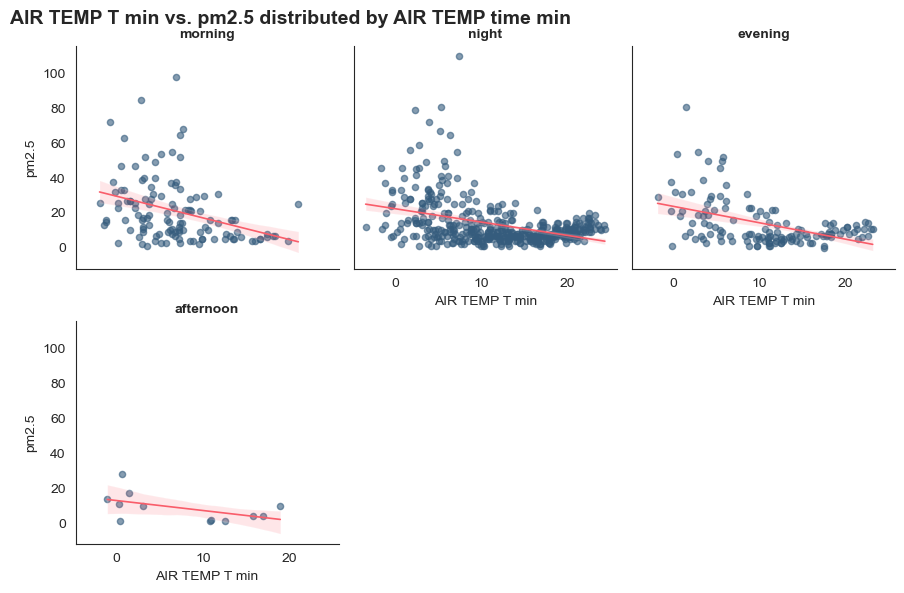


 Correlation test between AIR TEMP T min and pm2.5 

The correlation between AIR TEMP T min and pm2.5 is -0.41301


 ANOVA test between the values of  AIR TEMP T min based on the groups of AIR TEMP time min 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time min and the column AIR TEMP T min is 0.0 so there is a significant deviation of the median of AIR TEMP T min in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of AIR TEMP time min 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time min and the column pm2.5 is 1e-05 so there is a significant deviation of the median of pm2.5 in at least two groups.


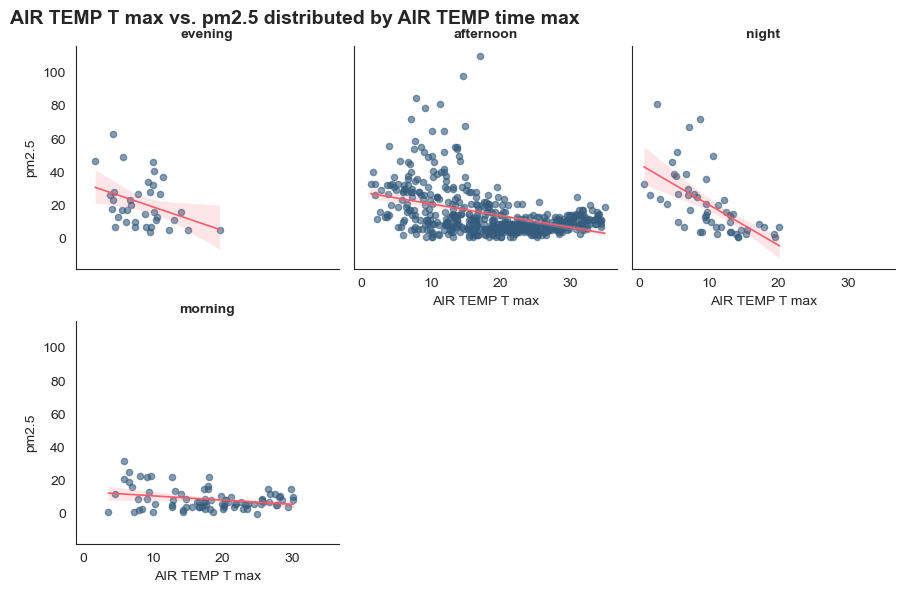


 Correlation test between AIR TEMP T max and pm2.5 

The correlation between AIR TEMP T max and pm2.5 is -0.41817


 ANOVA test between the values of  AIR TEMP T max based on the groups of AIR TEMP time max 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time max and the column AIR TEMP T max is 0.0 so there is a significant deviation of the median of AIR TEMP T max in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of AIR TEMP time max 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time max and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


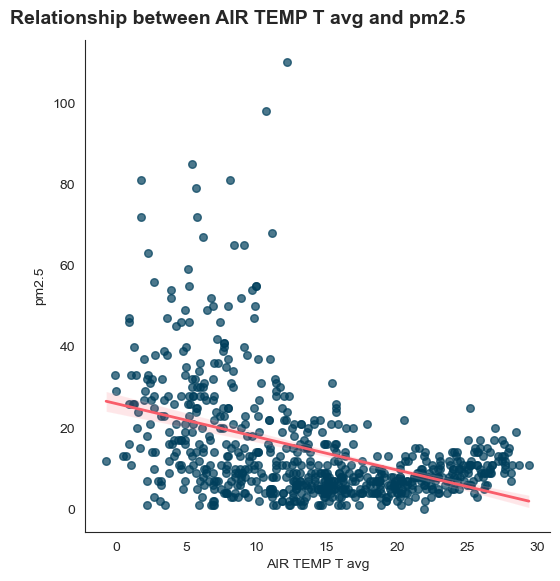


 Correlation test between AIR TEMP T avg and pm2.5 

The correlation between AIR TEMP T avg and pm2.5 is -0.4194


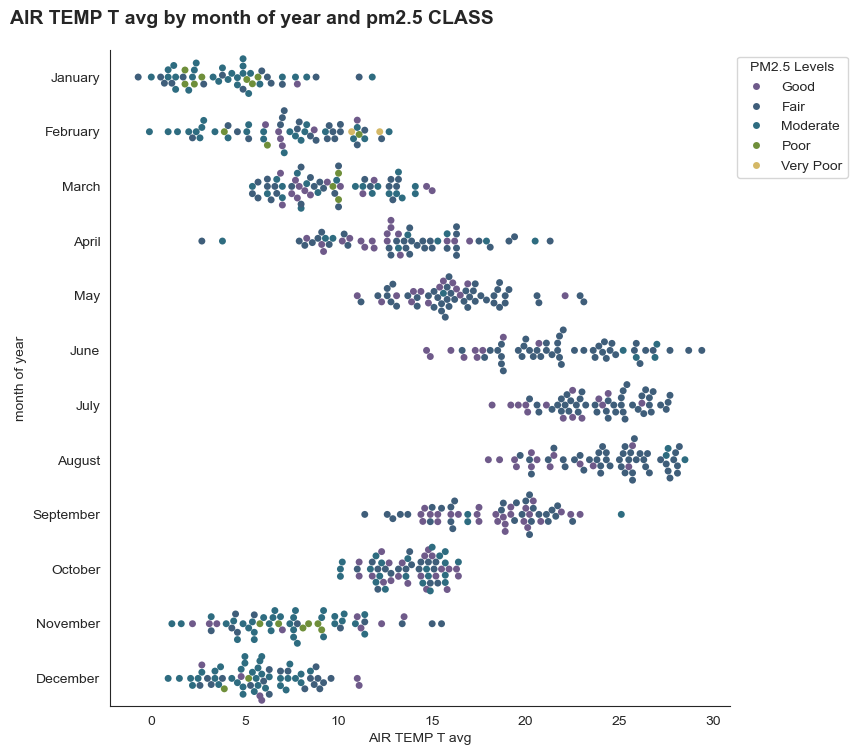



 ANOVA test between the values of  AIR TEMP T avg based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column month of year are dependent to each other


In [48]:
numx_numy_cat_rel(data,'AIR TEMP T min','pm2.5','AIR TEMP time min','Part of day',
                 ['morning','afternoon','evening','night'])
numx_numy_cat_rel(data,'AIR TEMP T max','pm2.5','AIR TEMP time max','Part of day',
                 ['morning','afternoon','evening','night'])
num_corr(data,('AIR TEMP T avg','pm2.5'))
numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'AIR TEMP T avg','month of year','pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

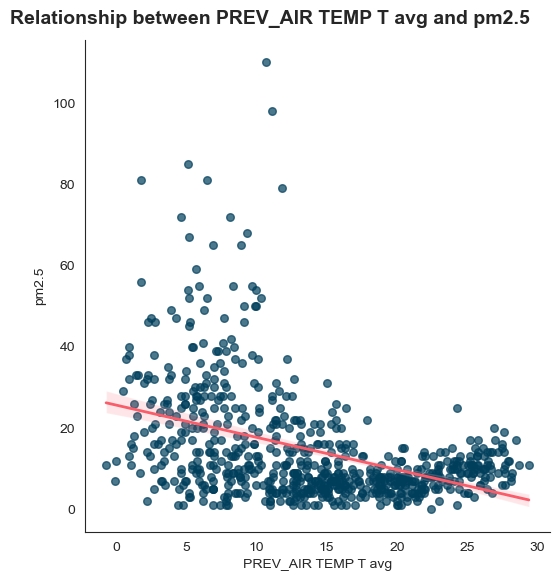


 Correlation test between PREV_AIR TEMP T avg and pm2.5 

The correlation between PREV_AIR TEMP T avg and pm2.5 is -0.41045


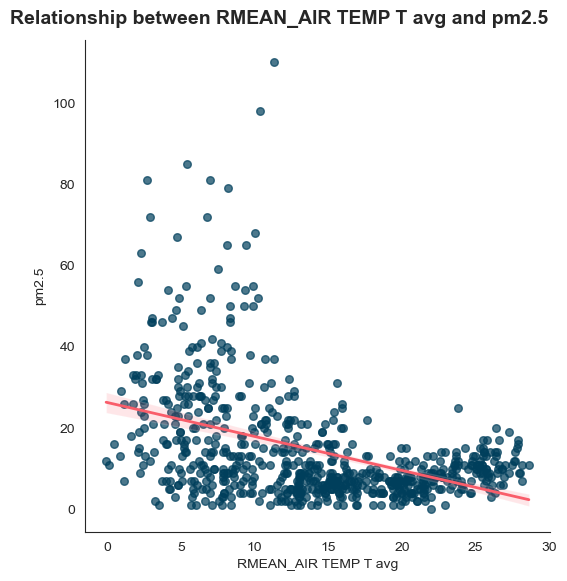


 Correlation test between RMEAN_AIR TEMP T avg and pm2.5 

The correlation between RMEAN_AIR TEMP T avg and pm2.5 is -0.42342


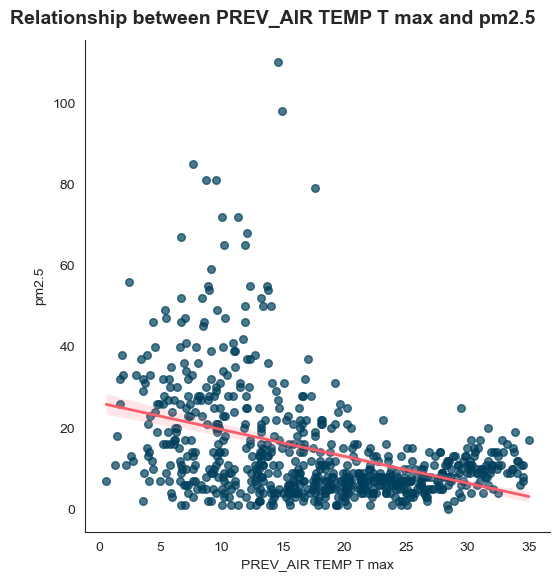


 Correlation test between PREV_AIR TEMP T max and pm2.5 

The correlation between PREV_AIR TEMP T max and pm2.5 is -0.38954


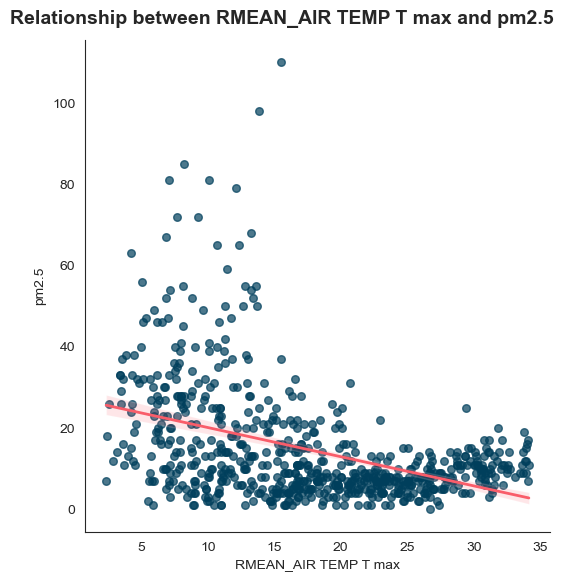


 Correlation test between RMEAN_AIR TEMP T max and pm2.5 

The correlation between RMEAN_AIR TEMP T max and pm2.5 is -0.41214


In [49]:
num_corr(data,('PREV_AIR TEMP T avg','pm2.5'))
num_corr(data,('RMEAN_AIR TEMP T avg','pm2.5'))
num_corr(data,('PREV_AIR TEMP T max','pm2.5'))
num_corr(data,('RMEAN_AIR TEMP T max','pm2.5'))

#### 🌡️ Temperature and PM2.5 – Summary of Observed Relationships

Across all representations (minimum, average, maximum temperature; current, lagged, and rolling values), a consistent negative relationship emerges between air temperature and PM2.5 concentration.

Key patterns include:

- Higher PM2.5 levels are predominantly observed at lower temperatures, especially in winter months.
- As temperature increases, PM2.5 values tend to decline and become more concentrated in lower ranges.

This inverse relationship is visible not only for daily averages but also for:

- Previous-day temperatures (lag),
- Rolling mean temperatures,
- Maximum daily temperatures.

The stratification by time of day (morning, afternoon, evening, night) confirms that the negative slope remains structurally similar across periods, although dispersion is greater during colder nighttime conditions.

Overall, the relationship appears stable and coherent: **colder atmospheric conditions are systematically associated with higher particulate concentrations, while warmer conditions correspond to lower PM2.5 levels and reduced variability.**

### Relationship between PM 2.5 levels and humidity

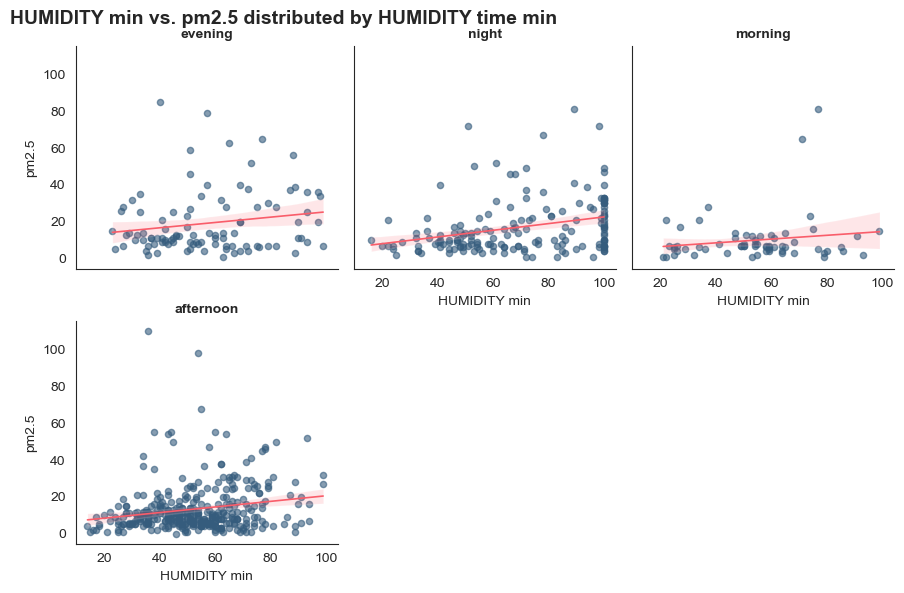


 Correlation test between HUMIDITY min and pm2.5 

The correlation between HUMIDITY min and pm2.5 is 0.2416


 ANOVA test between the values of  HUMIDITY min based on the groups of HUMIDITY time min 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time min and the column HUMIDITY min is 0.0 so there is a significant deviation of the median of HUMIDITY min in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of HUMIDITY time min 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time min and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


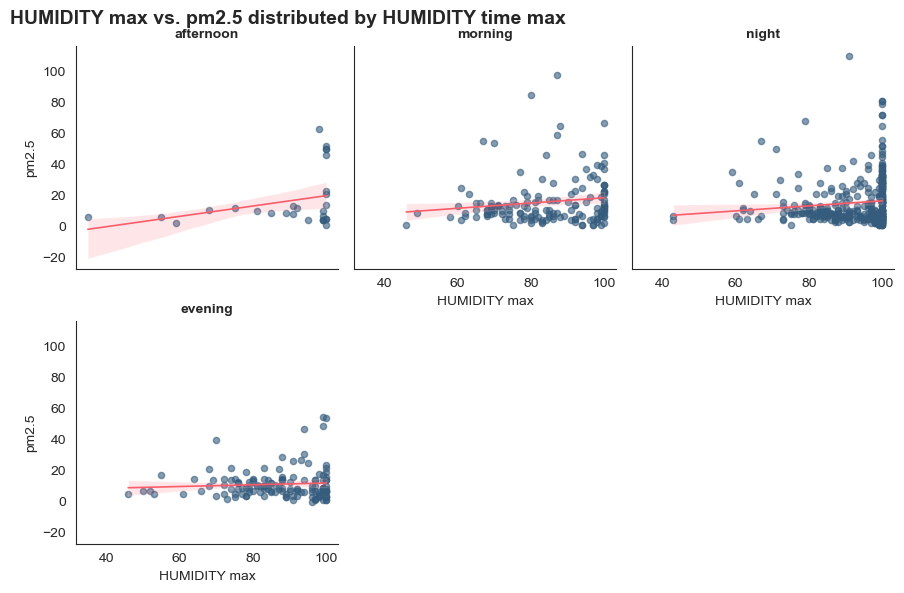


 Correlation test between HUMIDITY max and pm2.5 

The correlation between HUMIDITY max and pm2.5 is 0.12973


 ANOVA test between the values of  HUMIDITY max based on the groups of HUMIDITY time max 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time max and the column HUMIDITY max is 0.0 so there is a significant deviation of the median of HUMIDITY max in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of HUMIDITY time max 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time max and the column pm2.5 is 0.07454 so the median of pm2.5 for the different groups does not show relevant deviations.


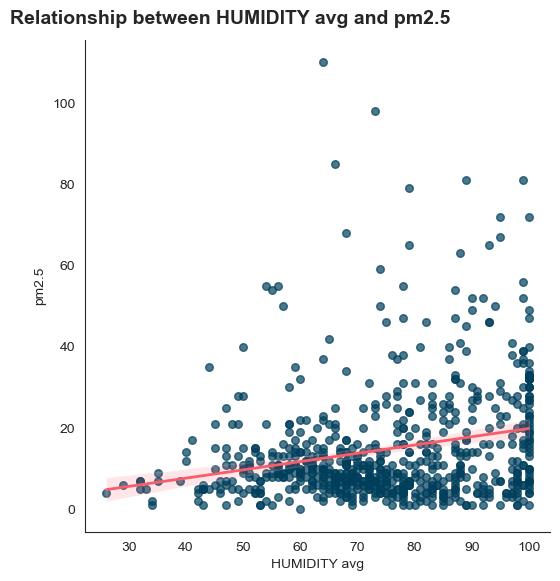


 Correlation test between HUMIDITY avg and pm2.5 

The correlation between HUMIDITY avg and pm2.5 is 0.23544


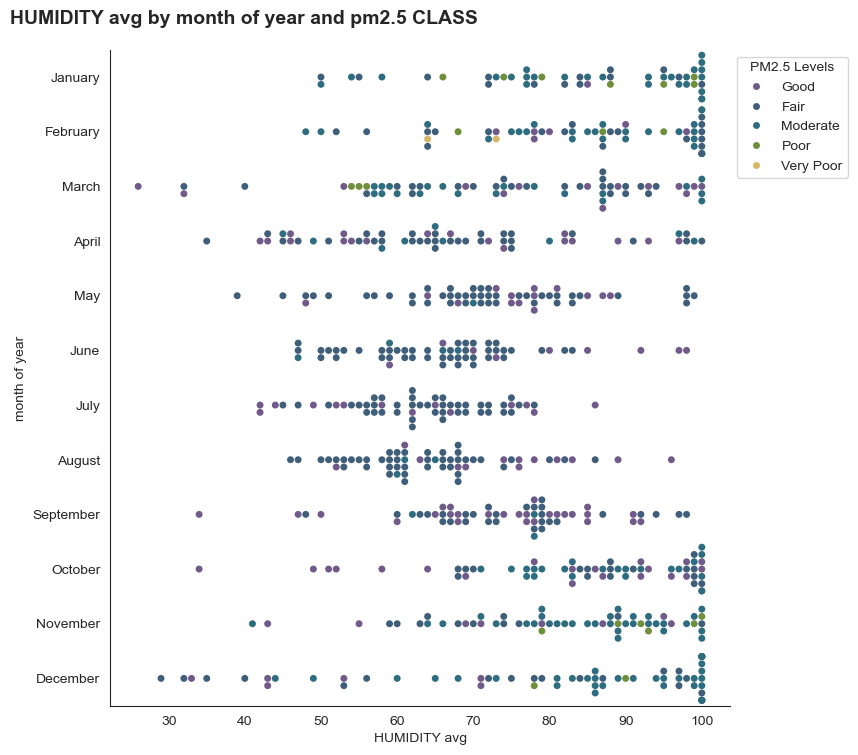



 ANOVA test between the values of  HUMIDITY avg based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 ANOVA test between the values of  HUMIDITY avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column month of year are dependent to each other


In [50]:
numx_numy_cat_rel(data,'HUMIDITY min','pm2.5','HUMIDITY time min','Part of day',
                 ['morning','afternoon','evening','night'])
numx_numy_cat_rel(data,'HUMIDITY max','pm2.5','HUMIDITY time max','Part of day',
                 ['morning','afternoon','evening','night'])
num_corr(data,('HUMIDITY avg','pm2.5'))
numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'HUMIDITY avg','month of year','pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

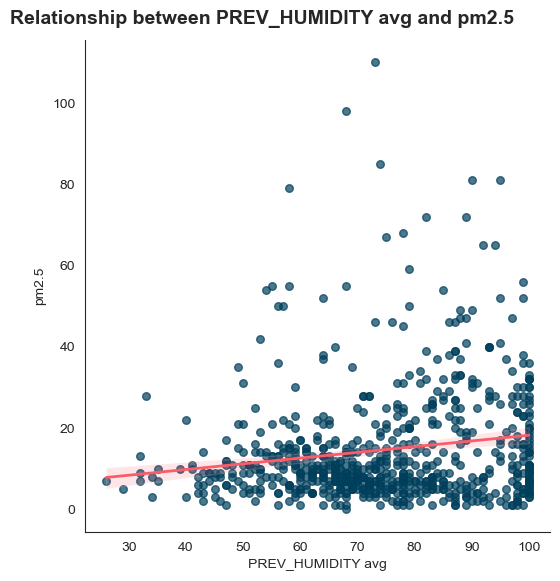


 Correlation test between PREV_HUMIDITY avg and pm2.5 

The correlation between PREV_HUMIDITY avg and pm2.5 is 0.16395


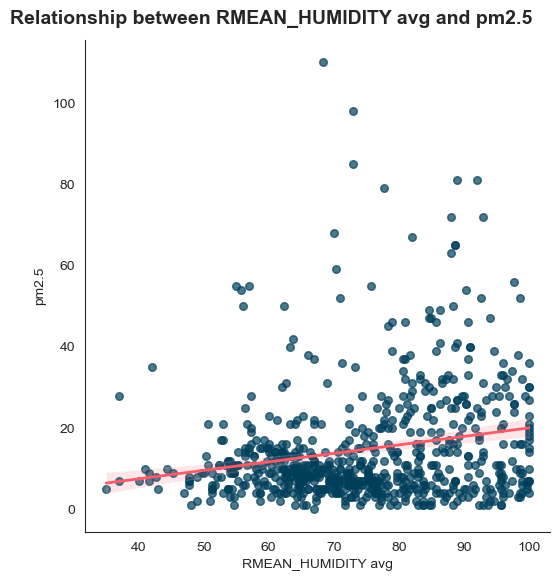


 Correlation test between RMEAN_HUMIDITY avg and pm2.5 

The correlation between RMEAN_HUMIDITY avg and pm2.5 is 0.20776


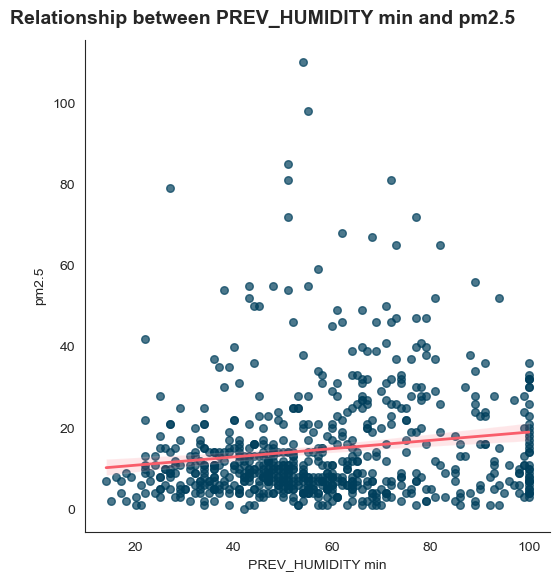


 Correlation test between PREV_HUMIDITY min and pm2.5 

The correlation between PREV_HUMIDITY min and pm2.5 is 0.1484


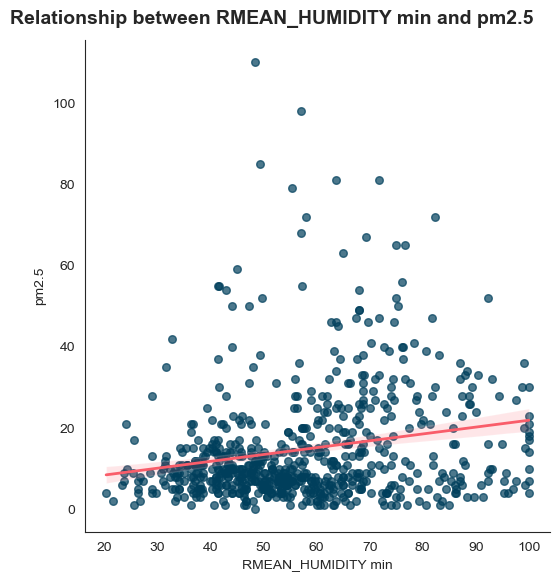


 Correlation test between RMEAN_HUMIDITY min and pm2.5 

The correlation between RMEAN_HUMIDITY min and pm2.5 is 0.20373


In [51]:
num_corr(data,('PREV_HUMIDITY avg','pm2.5'))
num_corr(data,('RMEAN_HUMIDITY avg','pm2.5'))
num_corr(data,('PREV_HUMIDITY min','pm2.5'))
num_corr(data,('RMEAN_HUMIDITY min','pm2.5'))

### 💧 Humidity and PM2.5- Key Findings

Across all humidity representations (minimum, maximum, average; current, lagged, and rolling), a consistent positive relationship emerges between humidity and PM2.5 concentration.

Key observations:

- Higher humidity levels tend to be associated with higher PM2.5 values, although the dispersion remains wide.
- The positive slope appears across different times of day (morning, afternoon, evening, night), suggesting structural coherence rather than time-specific behavior.

The relationship persists when considering:

- Previous-day humidity,
- Rolling mean humidity,
- Minimum humidity levels.

The strongest clustering of elevated PM2.5 values is generally observed at high humidity ranges (above ~70-80%), particularly during colder and transitional months.

While variability remains significant and extreme PM2.5 events are not exclusively tied to high humidity, the overall pattern indicates that humid atmospheric conditions are systematically associated with increased particulate concentrations.

In summary, humidity appears to act as a reinforcing factor for PM2.5 accumulation, complementing the previously observed inverse relationship between temperature and particulate levels.

### Relationship between PM 2.5 levels and winds

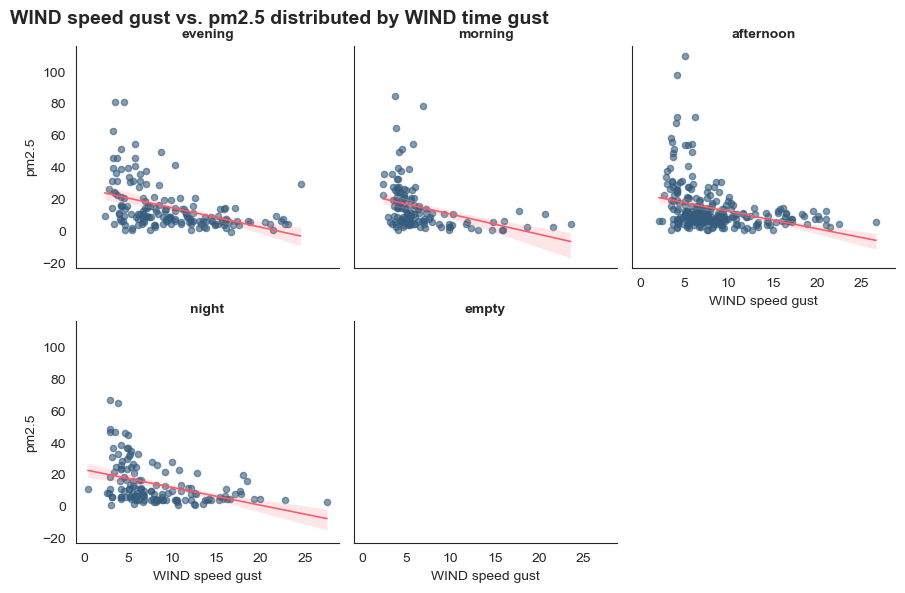


 Correlation test between WIND speed gust and pm2.5 

The correlation between WIND speed gust and pm2.5 is -0.36196


 ANOVA test between the values of  WIND speed gust based on the groups of WIND time gust 

The Kruskal-Wallis H-test for the different groups of the column WIND time gust and the column WIND speed gust is nan so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of WIND time gust 

The Kruskal-Wallis H-test for the different groups of the column WIND time gust and the column pm2.5 is 0.20062 so the median of pm2.5 for the different groups does not show relevant deviations.


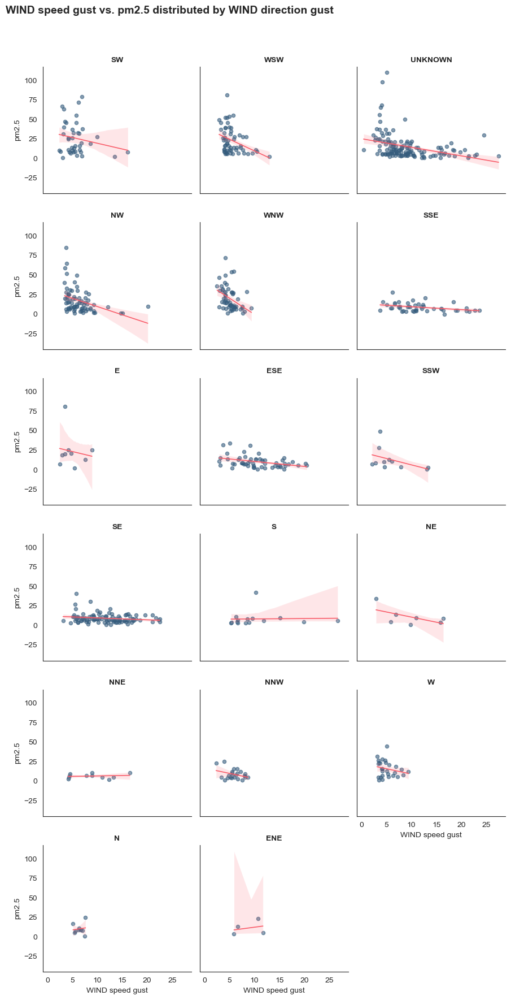


 Correlation test between WIND speed gust and pm2.5 

The correlation between WIND speed gust and pm2.5 is -0.36196


 ANOVA test between the values of  WIND speed gust based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


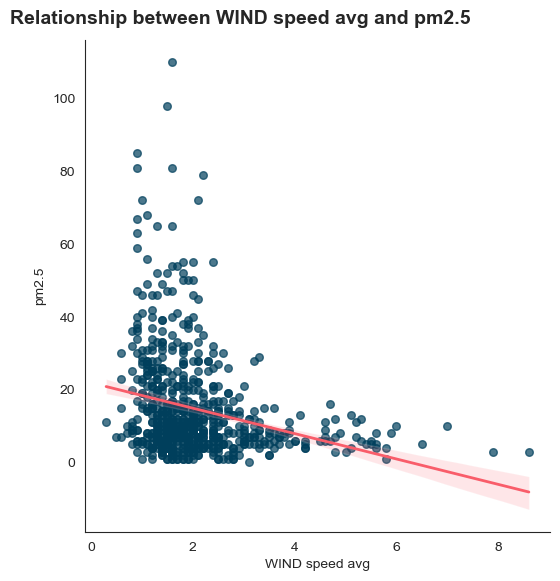


 Correlation test between WIND speed avg and pm2.5 

The correlation between WIND speed avg and pm2.5 is -0.25396


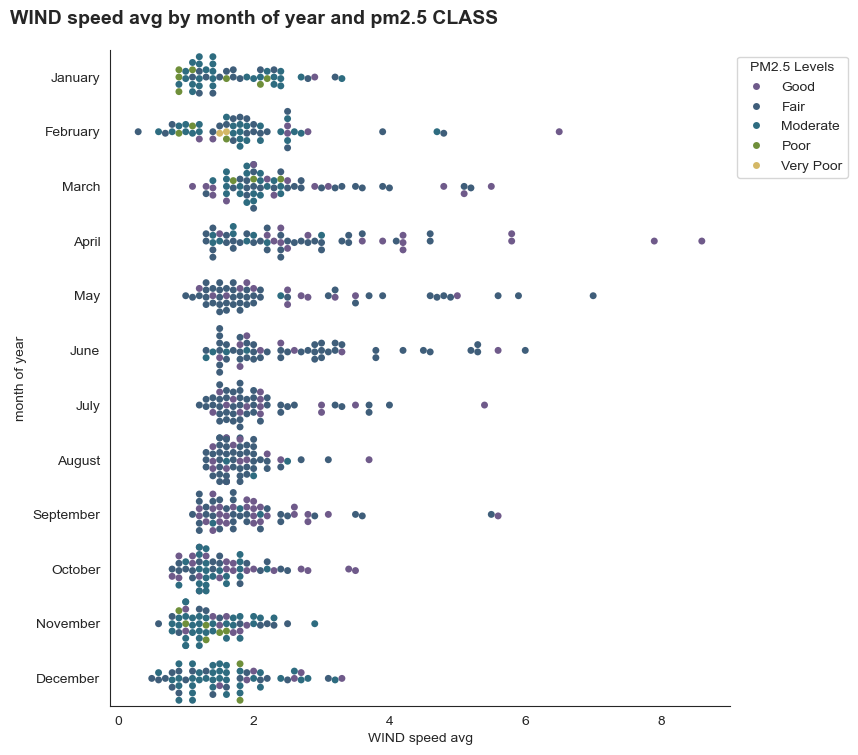



 ANOVA test between the values of  WIND speed avg based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 ANOVA test between the values of  WIND speed avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column month of year are dependent to each other


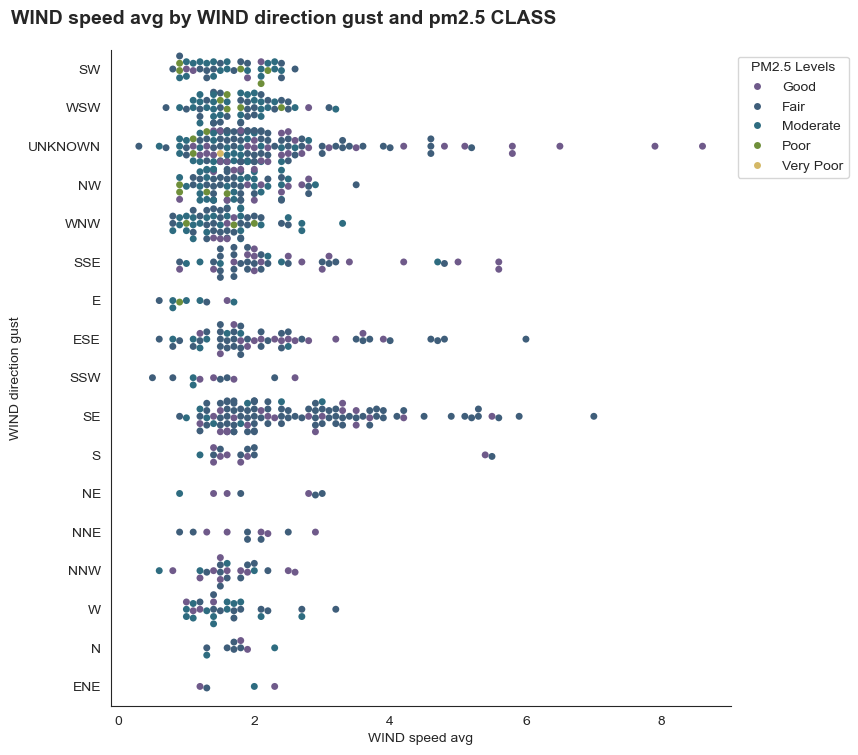



 ANOVA test between the values of  WIND speed avg based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 ANOVA test between the values of  WIND speed avg based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of WIND direction gust 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column WIND direction gust are dependent to each other


In [52]:
numx_numy_cat_rel(data,'WIND speed gust','pm2.5','WIND time gust','Part of day',
                 ['morning','afternoon','evening','night'])
numx_numy_cat_rel(data,'WIND speed gust','pm2.5','WIND direction gust','Direction',
                 ['UNKNOWN','N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW'])
num_corr(data,('WIND speed avg','pm2.5'))
numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'WIND speed avg','month of year','pm2.5 CLASS',
                  'PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])
numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'WIND speed avg','WIND direction gust',
                  'pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

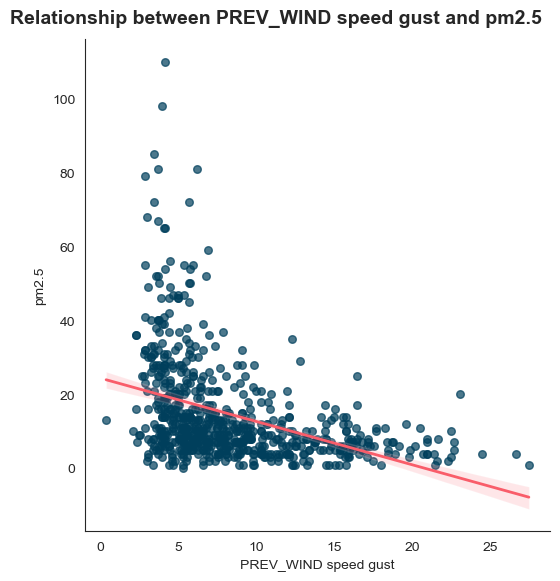


 Correlation test between PREV_WIND speed gust and pm2.5 

The correlation between PREV_WIND speed gust and pm2.5 is -0.38441


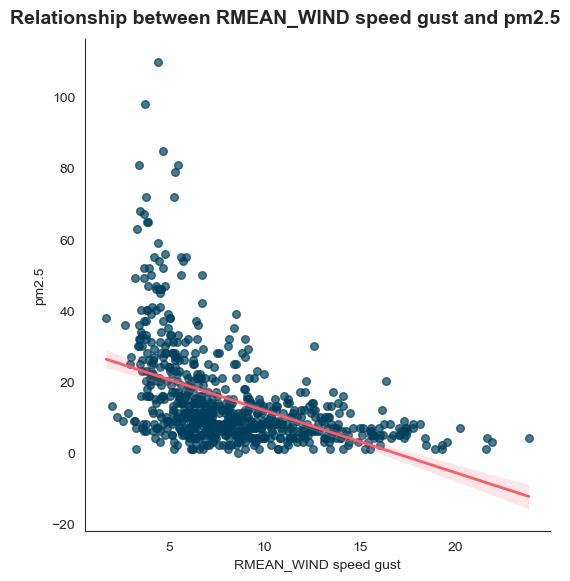


 Correlation test between RMEAN_WIND speed gust and pm2.5 

The correlation between RMEAN_WIND speed gust and pm2.5 is -0.46121


In [53]:
num_corr(data,('PREV_WIND speed gust','pm2.5'))
num_corr(data,('RMEAN_WIND speed gust','pm2.5'))

#### 💨 Wind and PM2.5 - Key Findings

Across all representations (gust speed, average wind speed; current, lagged, and rolling values), a clear negative relationship emerges between wind intensity and PM2.5 concentration.

Main observations:

- Higher wind speeds are systematically associated with lower PM2.5 levels, confirming the dispersion effect of wind.
- Elevated PM2.5 concentrations are concentrated at low wind speeds, particularly below moderate gust thresholds.

The negative slope remains consistent across:

- Different times of day (morning, afternoon, evening, night),
- Previous-day wind values,
- Rolling mean wind intensity.

When stratified by wind direction, the inverse relationship generally persists, although variability increases in less frequent directional classes due to limited observations. Prevailing directions show more stable and interpretable patterns.

The monthly distribution confirms that higher pollution classes are predominantly observed during periods characterized by low average wind speed, while stronger winds are more often associated with Good or Fair PM2.5 levels.

Overall, wind intensity appears to act as a structural mitigating factor for particulate accumulation, reinforcing the dispersion mechanism already suggested by the temperature and humidity analyses.

### Relationship between PM 2.5 levels and rain intensity

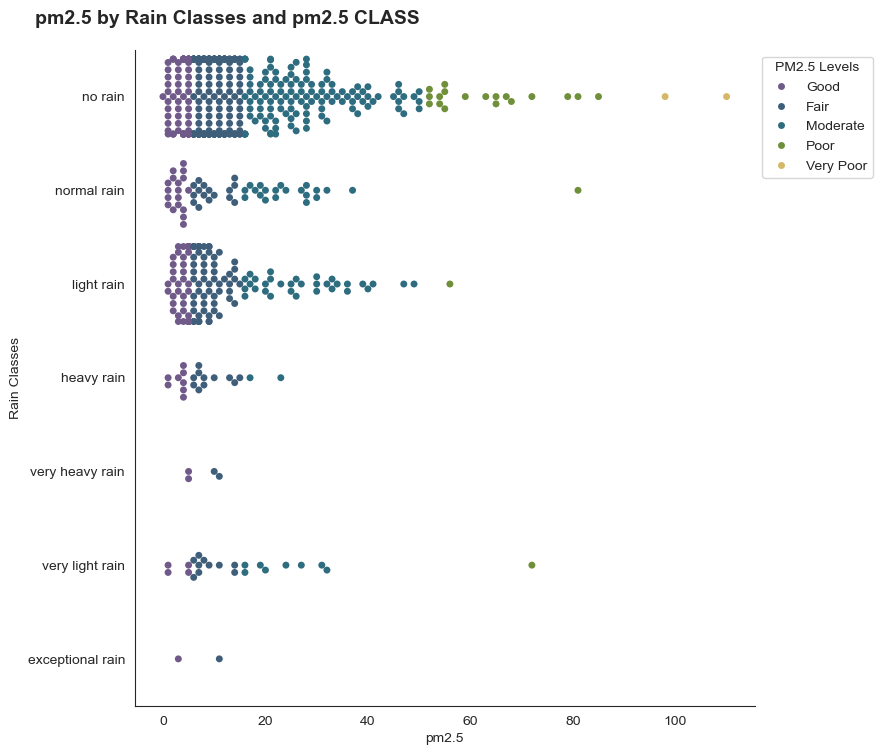



 ANOVA test between the values of  pm2.5 based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column pm2.5 is 0.00248 so there is a significant deviation of the median of pm2.5 in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of Rain Classes 

The result of the Chi Squared test, with a Pvalue of 0.09237  does not leave us reject the null hypotesys that the column pm2.5 CLASS and the column Rain Classes are independent to each other


In [54]:
numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'pm2.5','Rain Classes','pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

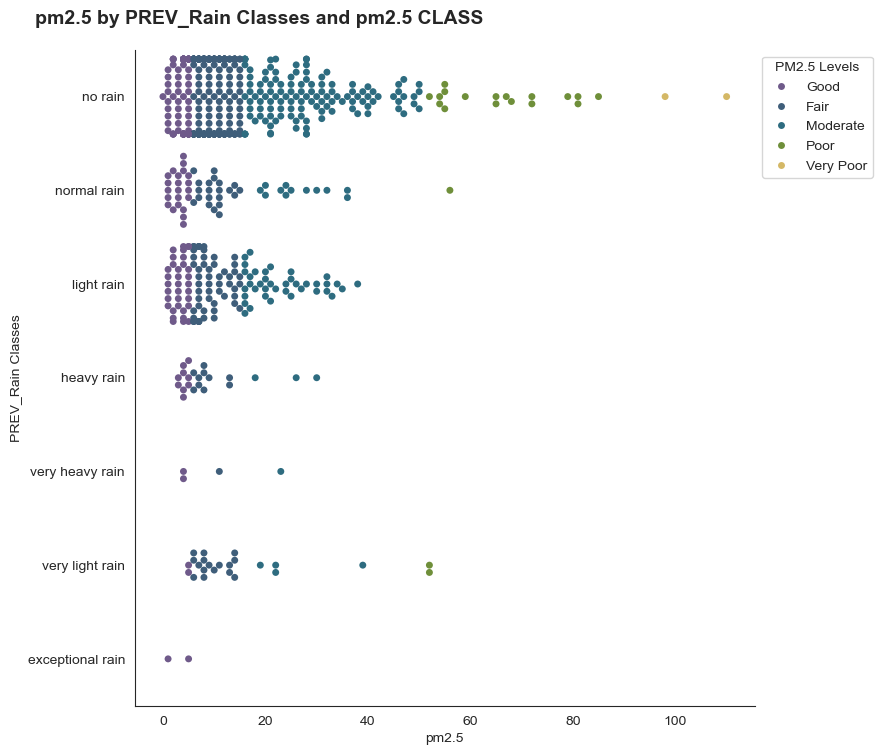



 ANOVA test between the values of  pm2.5 based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of PREV_Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column PREV_Rain Classes and the column pm2.5 is 0.00088 so there is a significant deviation of the median of pm2.5 in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of PREV_Rain Classes 

The result of the Chi Squared test, with a Pvalue of 0.00379 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column PREV_Rain Classes are dependent to each other


In [55]:
numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'].iloc[1:],'pm2.5','PREV_Rain Classes','pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

#### 🌧️ Rainfall Regimes and PM2.5 Key Findings

Across both current and previous-day rain classes, a clear structural pattern emerges between precipitation and PM2.5 levels.

Key observations:

- No-rain days are associated with the widest dispersion and the highest PM2.5 values, including most of the Poor and Very Poor episodes.
- Light and normal rain conditions still show moderate PM2.5 levels, but extreme concentrations become less frequent.
- Heavy and very heavy rain days are generally associated with lower PM2.5 values, with limited variability.
- Exceptional rain events are rare and show low particulate concentrations.

The same structure is visible when considering previous-day rain classes, suggesting that precipitation effects may extend beyond the same day, contributing to reduced particulate levels even after rainfall has occurred.

Overall, rainfall appears to act as a mitigating factor for PM2.5 accumulation, with dry conditions favoring higher concentrations and intense precipitation contributing to particulate washout and lower dispersion of extreme values.

### Relationship between PM 2.5, its values of the previous day and values of other pollutants

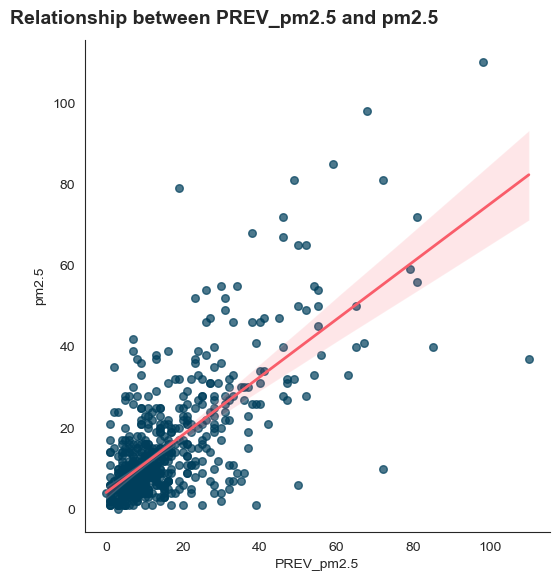


 Correlation test between PREV_pm2.5 and pm2.5 

The correlation between PREV_pm2.5 and pm2.5 is 0.71872


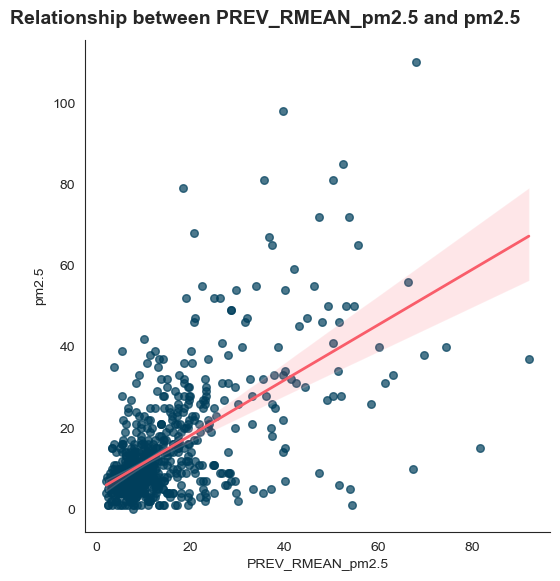


 Correlation test between PREV_RMEAN_pm2.5 and pm2.5 

The correlation between PREV_RMEAN_pm2.5 and pm2.5 is 0.60737


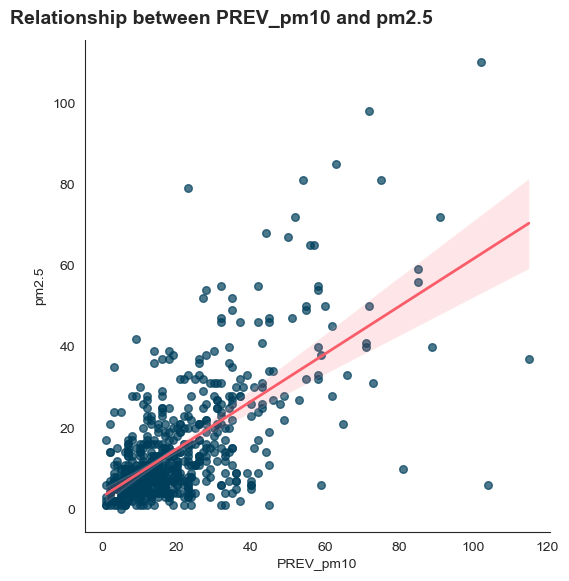


 Correlation test between PREV_pm10 and pm2.5 

The correlation between PREV_pm10 and pm2.5 is 0.65689


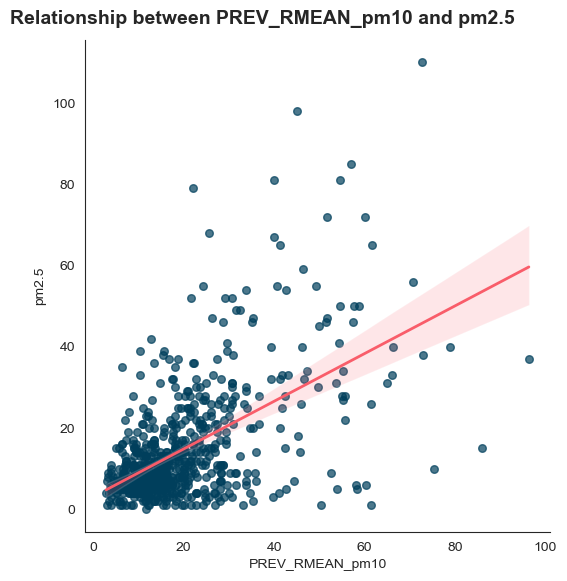


 Correlation test between PREV_RMEAN_pm10 and pm2.5 

The correlation between PREV_RMEAN_pm10 and pm2.5 is 0.56013


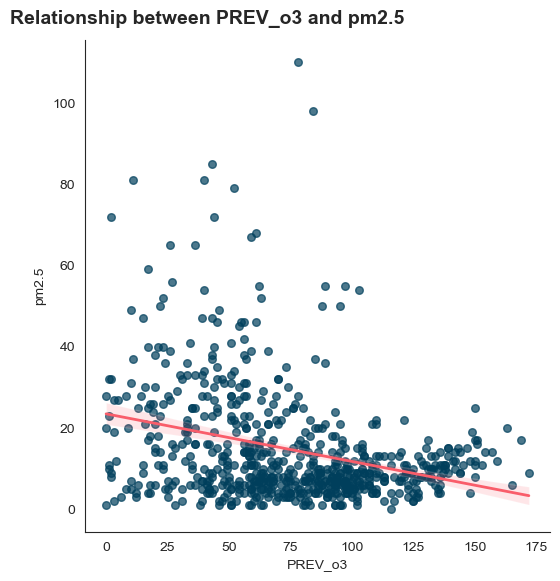


 Correlation test between PREV_o3 and pm2.5 

The correlation between PREV_o3 and pm2.5 is -0.30322


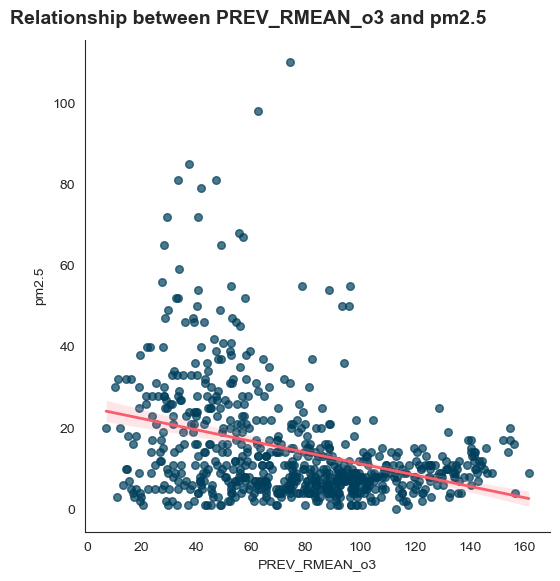


 Correlation test between PREV_RMEAN_o3 and pm2.5 

The correlation between PREV_RMEAN_o3 and pm2.5 is -0.33291


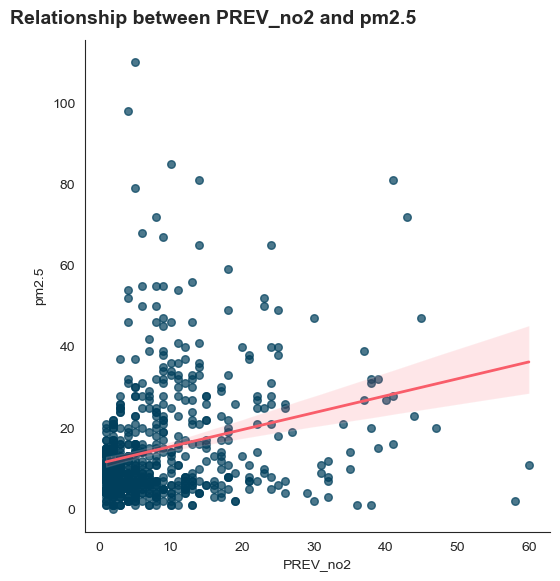


 Correlation test between PREV_no2 and pm2.5 

The correlation between PREV_no2 and pm2.5 is 0.26366


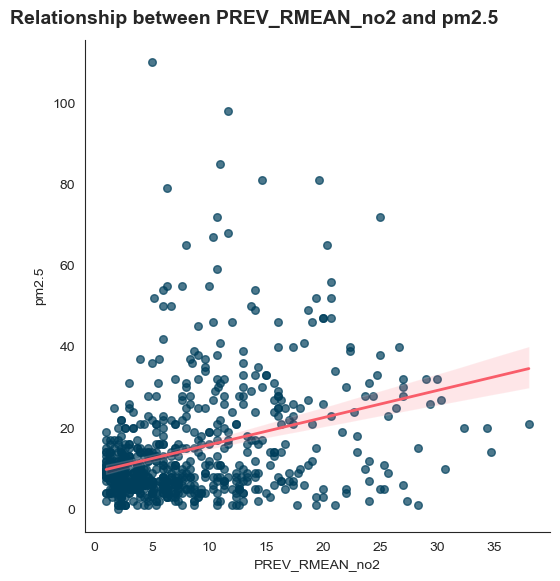


 Correlation test between PREV_RMEAN_no2 and pm2.5 

The correlation between PREV_RMEAN_no2 and pm2.5 is 0.32151


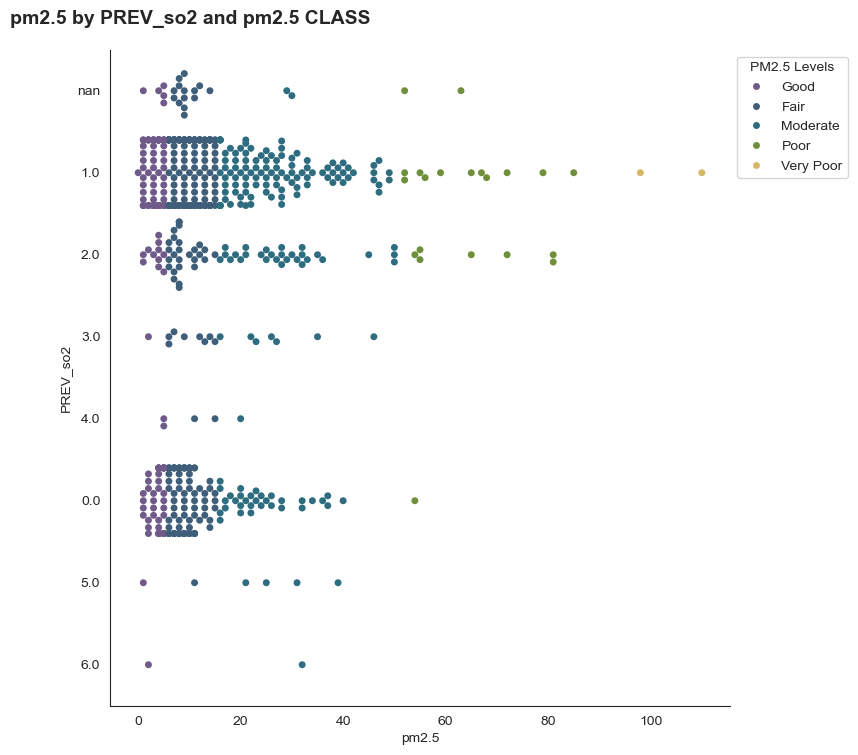



 ANOVA test between the values of  pm2.5 based on the groups of pm2.5 CLASS 

The Kruskal-Wallis H-test for the different groups of the column pm2.5 CLASS and the column pm2.5 is 0.0 so there is a significant deviation of the median of pm2.5 in at least two groups.


 ANOVA test between the values of  pm2.5 based on the groups of PREV_so2 

The Kruskal-Wallis H-test for the different groups of the column PREV_so2 and the column pm2.5 is 0.00114 so there is a significant deviation of the median of pm2.5 in at least two groups.


 Chi-Squared test between the elements of  pm2.5 CLASS and those of PREV_so2 

The result of the Chi Squared test, with a Pvalue of 0.00795 makes us reject the null hypotesys, so the column pm2.5 CLASS and the column PREV_so2 are dependent to each other


In [56]:
num_corr(data,('PREV_pm2.5','pm2.5'))
num_corr(data,('PREV_RMEAN_pm2.5','pm2.5'))

num_corr(data,('PREV_pm10','pm2.5'))
num_corr(data,('PREV_RMEAN_pm10','pm2.5'))

num_corr(data,('PREV_o3','pm2.5'))
num_corr(data,('PREV_RMEAN_o3','pm2.5'))

num_corr(data,('PREV_no2','pm2.5'))
num_corr(data,('PREV_RMEAN_no2','pm2.5'))

numx_caty_cat_rel(data[data['pm2.5 CLASS'] != 'missing_vals'],'pm2.5','PREV_so2','pm2.5 CLASS','PM2.5 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

These analisys highlight the **strong temporal persistence** of PM2.5 and its relationship with previously observed pollutant levels.

First, the relationship between previous PM2.5 values (PREV_pm2.5 and PREV_RMEAN_pm2.5) and current PM2.5 is clearly positive and well structured. The regression lines are steep and the dispersion follows a coherent upward trend, confirming that PM2.5 concentrations exhibit strong short-term autocorrelation. In practical terms, high pollution levels tend to persist from one day (or rolling period) to the next.

A similarly strong positive association is observed with previous PM10 values (PREV_pm10 and PREV_RMEAN_pm10). This is consistent with the physical relationship between particulate fractions: PM2.5 and PM10 often share emission sources (traffic, combustion, secondary aerosol formation), and their concentrations tend to co-vary.

In contrast, **previous O₃ (PREV_o3 and PREV_RMEAN_o3) shows a clear negative relationship with PM2.5.** Higher ozone levels are generally associated with warmer, more ventilated atmospheric conditions, which tend to reduce particulate accumulation. This inverse pattern reflects different atmospheric regimes: stagnation episodes favor PM2.5, while photochemical conditions favor ozone.

For **previous NO₂ (PREV_no2 and PREV_RMEAN_no2), the relationship with PM2.5 is positive but more dispersed**. This suggests shared emission sources (notably traffic and combustion), though the association is weaker and more variable than for particulate indicators.

Finally, the **PM2.5 distribution across previous SO₂ categories (PREV_so2) does not show a strong or consistent structure**, likely due to limited variability and fewer extreme values in SO₂.

Overall, these results indicate that:

- Lagged PM2.5 and PM10 are the strongest predictors, reflecting pollutant persistence and shared sources.
- Ozone behaves inversely, capturing different meteorological and chemical regimes.
- NO₂ shows moderate co-variation, consistent with emission-related coupling.
- SO₂ appears less influential in this dataset.

From a modeling perspective, lagged particulate variables and rolling averages are likely to provide substantial predictive power, while gaseous pollutants contribute complementary regime-related information.

## O3

### Differences between 2024 and 2025 in the same period

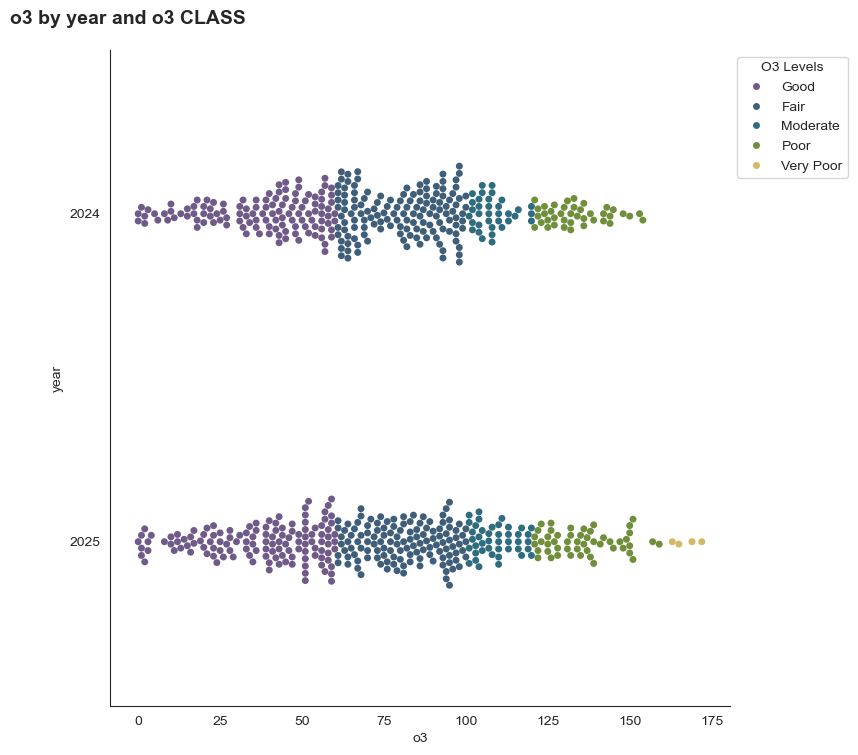



 ANOVA test between the values of  o3 based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


 ANOVA test between the values of  o3 based on the groups of year 

The Kruskal-Wallis H-test for the different groups of the column year and the column o3 is 0.35329 so the median of o3 for the different groups does not show relevant deviations.


 Chi-Squared test between the elements of  o3 CLASS and those of year 

The result of the Chi Squared test, with a Pvalue of 0.18016  does not leave us reject the null hypotesys that the column o3 CLASS and the column year are independent to each other


In [57]:
day_month = data.index.strftime('%d-%m')

listed_2024 = (data.index.year == 2024) & (day_month.isin(day_month[data.index.year == 2025]))
listed_2025 = (data.index.year == 2025) & (day_month.isin(day_month[data.index.year == 2024]))

data_year = data.loc[data.index[listed_2024 | listed_2025]]


numx_caty_cat_rel(data_year[data_year['o3 CLASS'] != 'missing_vals'],'o3','year','o3 CLASS','O3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

#### Observation
The distribution of O₃ concentrations across 2024 and 2025 appears visually very similar, with comparable spreads and proportions across the “Good”, “Fair”, “Moderate”, and “Poor” classes.

Consistent with the parametric test results, there is no evident structural shift between the two years: ozone levels show a stable pattern over time, suggesting that year does not significantly influence O₃ concentrations in this dataset.

### Relationship between O3 levels and air temperature

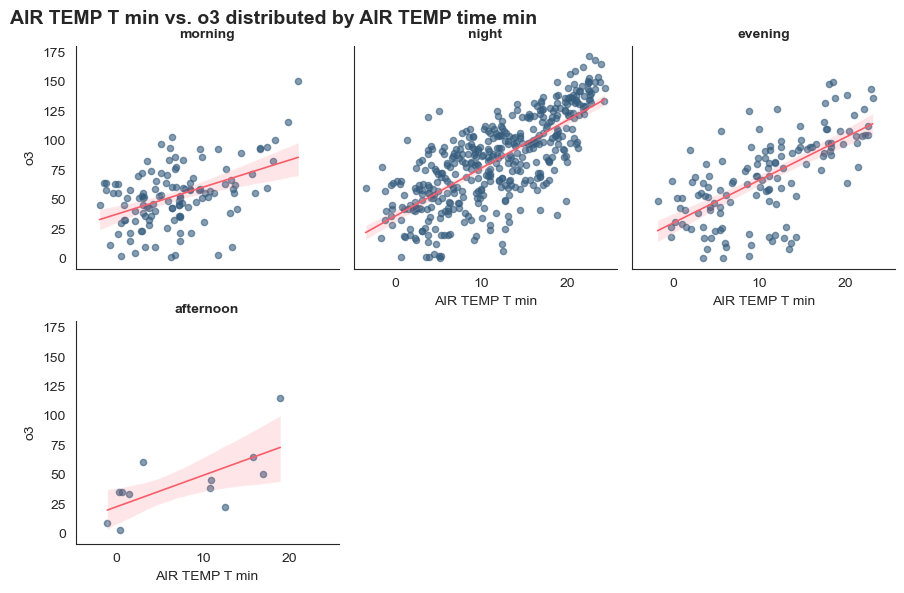


 Correlation test between AIR TEMP T min and o3 

The correlation between AIR TEMP T min and o3 is 0.71066


 ANOVA test between the values of  AIR TEMP T min based on the groups of AIR TEMP time min 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time min and the column AIR TEMP T min is 0.0 so there is a significant deviation of the median of AIR TEMP T min in at least two groups.


 ANOVA test between the values of  o3 based on the groups of AIR TEMP time min 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time min and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


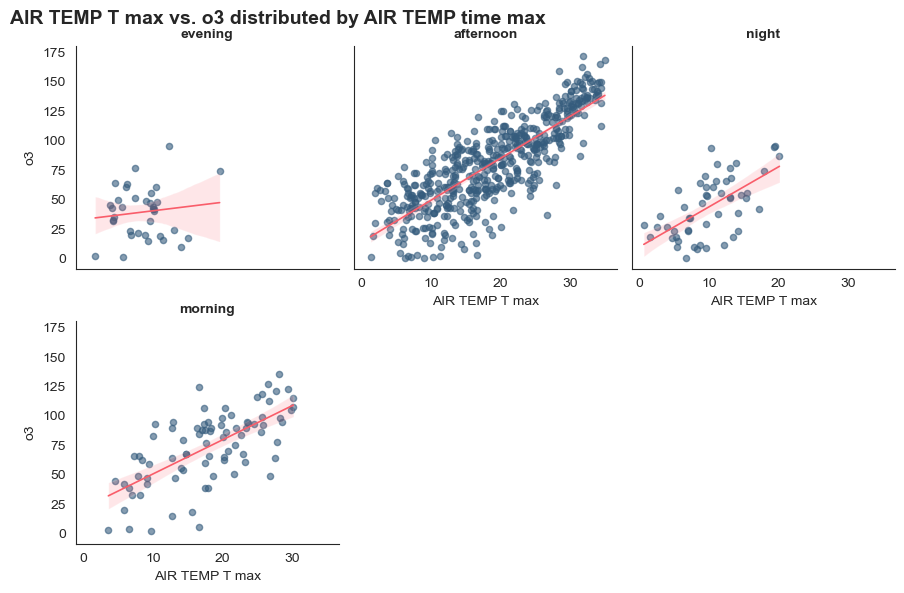


 Correlation test between AIR TEMP T max and o3 

The correlation between AIR TEMP T max and o3 is 0.80623


 ANOVA test between the values of  AIR TEMP T max based on the groups of AIR TEMP time max 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time max and the column AIR TEMP T max is 0.0 so there is a significant deviation of the median of AIR TEMP T max in at least two groups.


 ANOVA test between the values of  o3 based on the groups of AIR TEMP time max 

The Kruskal-Wallis H-test for the different groups of the column AIR TEMP time max and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


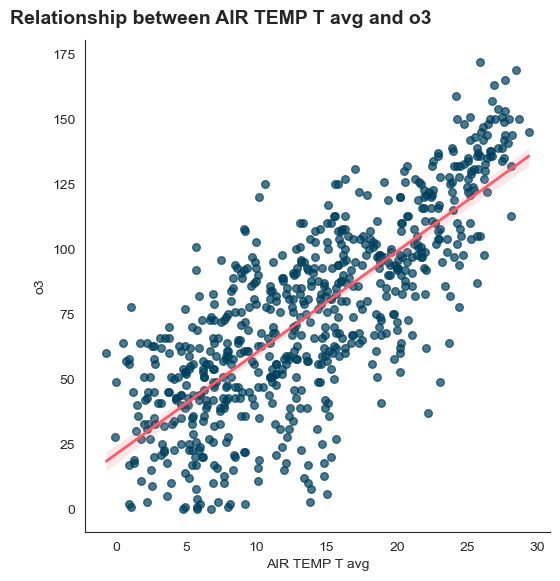


 Correlation test between AIR TEMP T avg and o3 

The correlation between AIR TEMP T avg and o3 is 0.77504


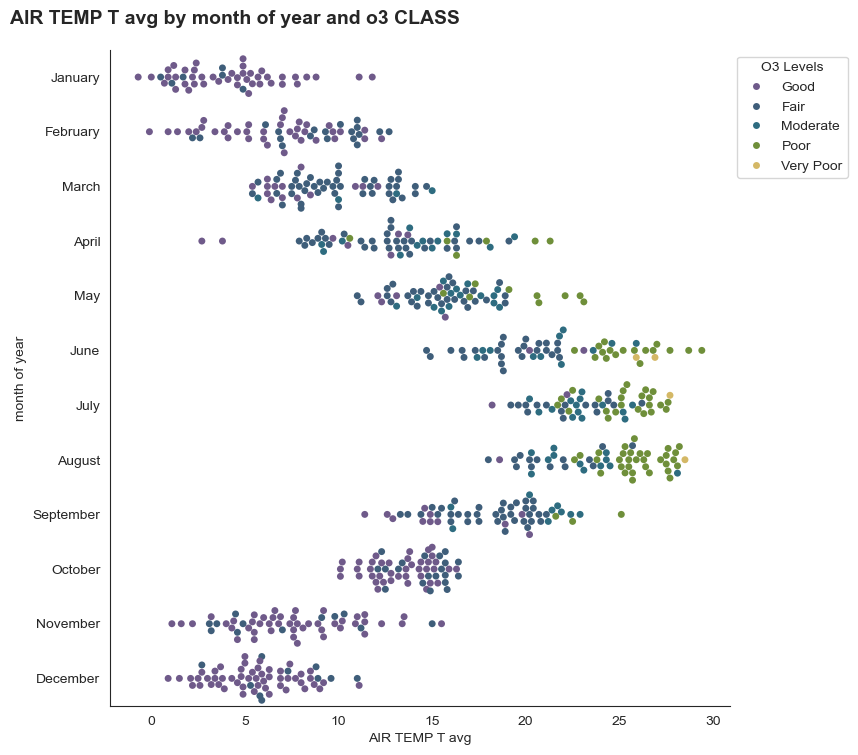



 ANOVA test between the values of  AIR TEMP T avg based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 ANOVA test between the values of  AIR TEMP T avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column AIR TEMP T avg is 0.0 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column o3 CLASS and the column month of year are dependent to each other


In [58]:
numx_numy_cat_rel(data,'AIR TEMP T min','o3','AIR TEMP time min','Part of day',
                 ['morning','afternoon','evening','night'])
numx_numy_cat_rel(data,'AIR TEMP T max','o3','AIR TEMP time max','Part of day',
                 ['morning','afternoon','evening','night'])
num_corr(data,('AIR TEMP T avg','o3'))
numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'AIR TEMP T avg','month of year','o3 CLASS','O3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

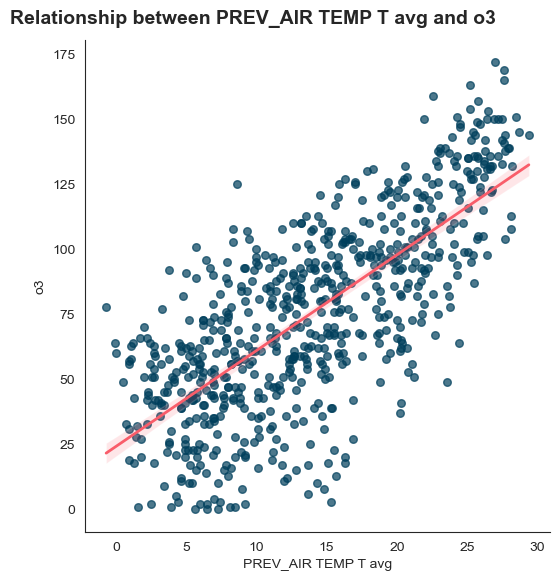


 Correlation test between PREV_AIR TEMP T avg and o3 

The correlation between PREV_AIR TEMP T avg and o3 is 0.73147


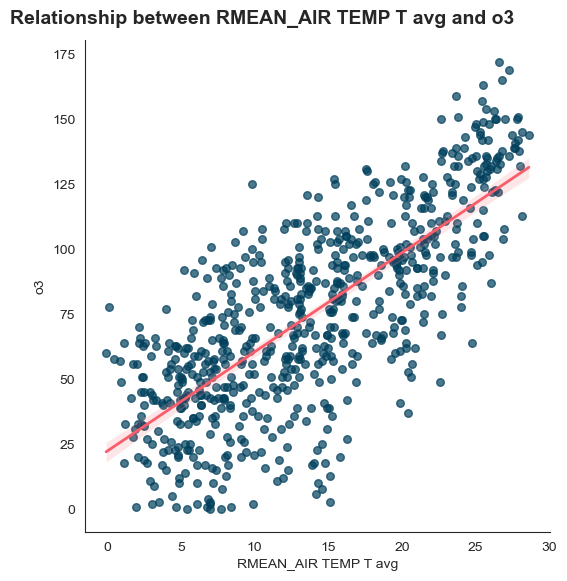


 Correlation test between RMEAN_AIR TEMP T avg and o3 

The correlation between RMEAN_AIR TEMP T avg and o3 is 0.74779


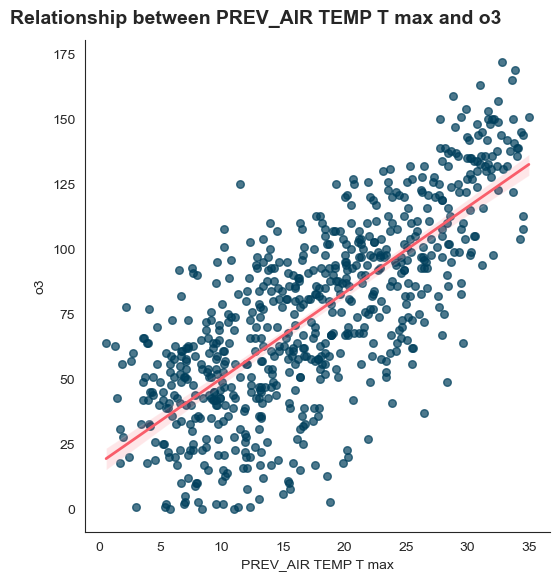


 Correlation test between PREV_AIR TEMP T max and o3 

The correlation between PREV_AIR TEMP T max and o3 is 0.74674


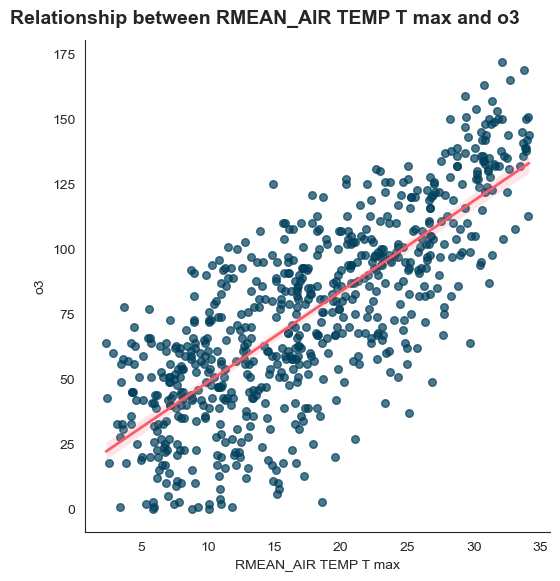


 Correlation test between RMEAN_AIR TEMP T max and o3 

The correlation between RMEAN_AIR TEMP T max and o3 is 0.77471


In [59]:
num_corr(data,('PREV_AIR TEMP T avg','o3'))
num_corr(data,('RMEAN_AIR TEMP T avg','o3'))

num_corr(data,('PREV_AIR TEMP T max','o3'))
num_corr(data,('RMEAN_AIR TEMP T max','o3'))

#### 🌡️ Temperature and O3 – Key Findings

Across all metrics (T min, T avg, T max, previous-day and rolling mean values), O₃ increases as temperature increases.
The linear trend is strong and visually consistent, confirming temperature as a key driver of ozone concentration.

**Maximum temperature shows the strongest effect**

The steepest and most compact relationships appear for:

- AIR TEMP T max
- PREV_AIR TEMP T max
- RMEAN_AIR TEMP T max

This suggests that peak daily temperature plays a central role in O₃ formation.

**Persistence over time**

Previous-day and rolling mean temperature variables show very similar slopes to same-day temperature.
This indicates a short-term accumulation effect: ozone responds not only to current temperature but also to recent thermal conditions.

**Strong seasonal structure**

In the monthly distribution plot:

- Summer months (June-August) concentrate most Moderate, Poor and Very Poor O₃ levels.
- Winter months are dominated by Good/Fair classes.

This confirms the typical photochemical behavior of ozone.

**Stronger linearity than PM2.5**

Compared to PM2.5, O₃ displays:

- A cleaner linear pattern
- Less dispersion around the regression line
- A more structurally stable relationship with temperature

Overall, temperature, especially maximum daily temperature, emerges as a major explanatory factor for O₃ variability.

### Relationship between O3 levels and humidity

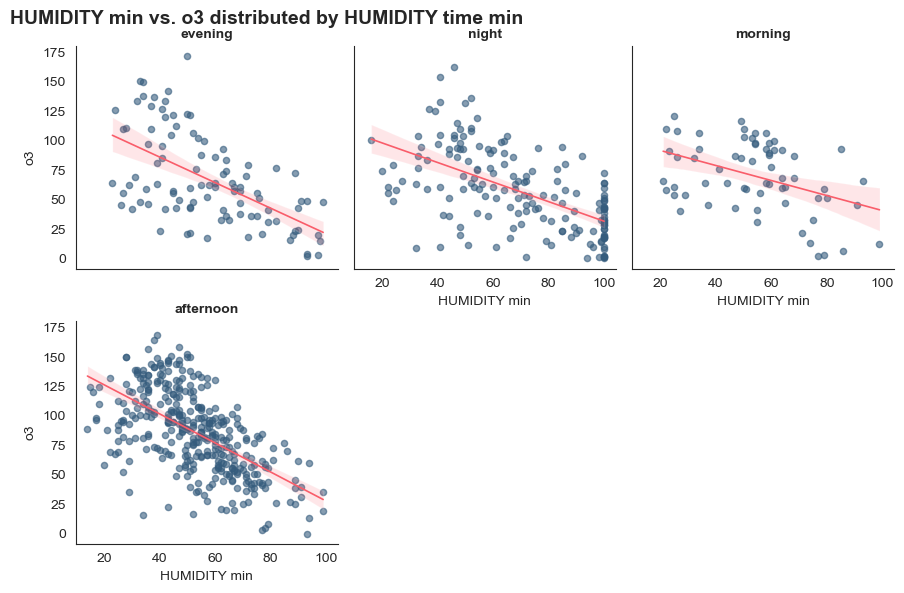


 Correlation test between HUMIDITY min and o3 

The correlation between HUMIDITY min and o3 is -0.60429


 ANOVA test between the values of  HUMIDITY min based on the groups of HUMIDITY time min 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time min and the column HUMIDITY min is 0.0 so there is a significant deviation of the median of HUMIDITY min in at least two groups.


 ANOVA test between the values of  o3 based on the groups of HUMIDITY time min 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time min and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


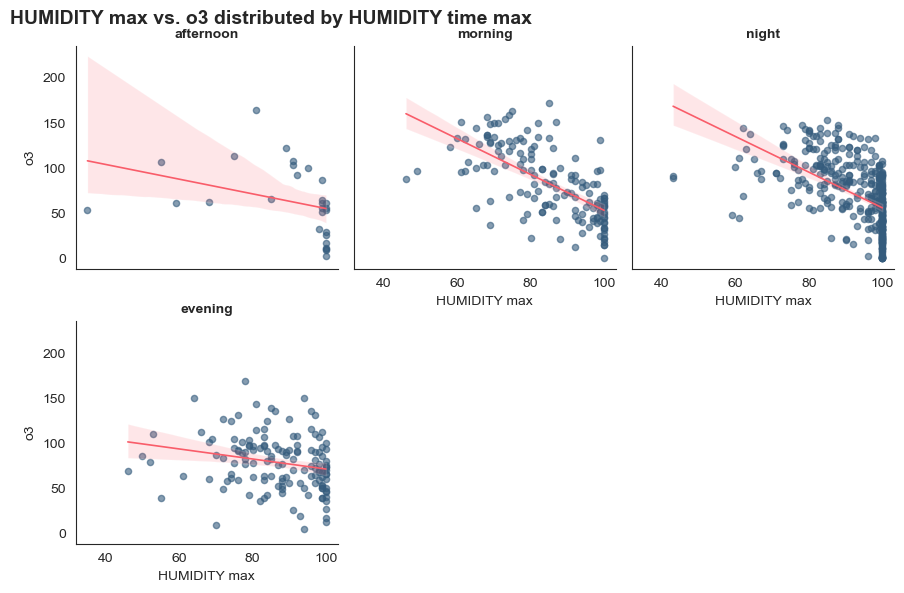


 Correlation test between HUMIDITY max and o3 

The correlation between HUMIDITY max and o3 is -0.50893


 ANOVA test between the values of  HUMIDITY max based on the groups of HUMIDITY time max 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time max and the column HUMIDITY max is 0.0 so there is a significant deviation of the median of HUMIDITY max in at least two groups.


 ANOVA test between the values of  o3 based on the groups of HUMIDITY time max 

The Kruskal-Wallis H-test for the different groups of the column HUMIDITY time max and the column o3 is 0.00269 so there is a significant deviation of the median of o3 in at least two groups.


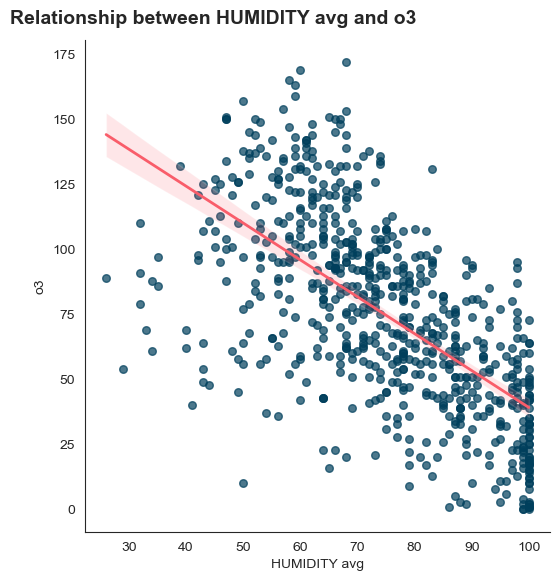


 Correlation test between HUMIDITY avg and o3 

The correlation between HUMIDITY avg and o3 is -0.6348


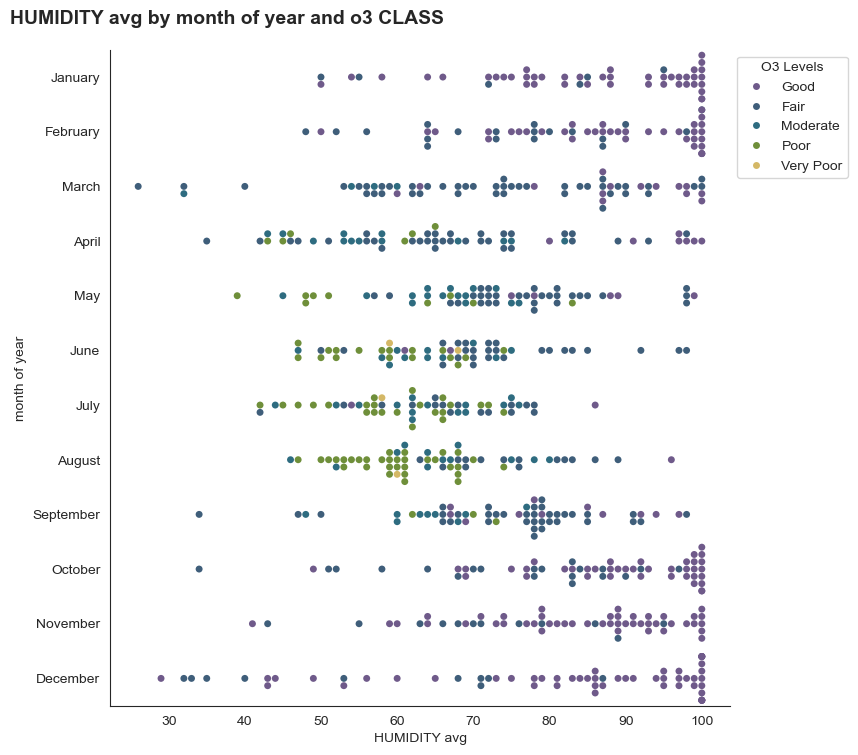



 ANOVA test between the values of  HUMIDITY avg based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 ANOVA test between the values of  HUMIDITY avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column HUMIDITY avg is 0.0 so there is a significant deviation of the median of HUMIDITY avg in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column o3 CLASS and the column month of year are dependent to each other


In [60]:
numx_numy_cat_rel(data,'HUMIDITY min','o3','HUMIDITY time min','Part of day',
                 ['morning','afternoon','evening','night'])
numx_numy_cat_rel(data,'HUMIDITY max','o3','HUMIDITY time max','Part of day',
                 ['morning','afternoon','evening','night'])
num_corr(data,('HUMIDITY avg','o3'))
numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'HUMIDITY avg','month of year','o3 CLASS','O3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

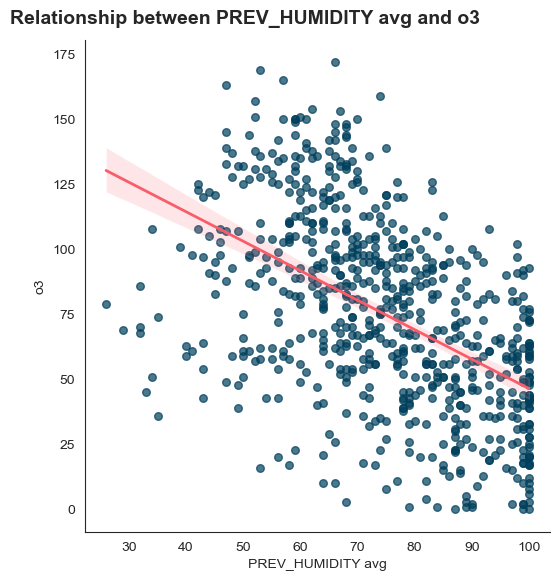


 Correlation test between PREV_HUMIDITY avg and o3 

The correlation between PREV_HUMIDITY avg and o3 is -0.50842


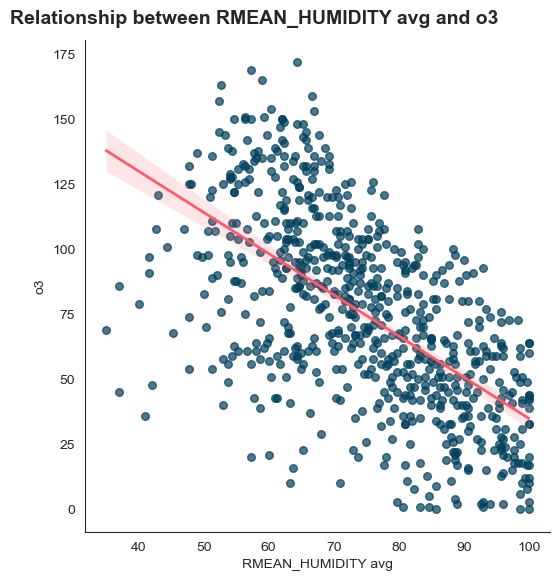


 Correlation test between RMEAN_HUMIDITY avg and o3 

The correlation between RMEAN_HUMIDITY avg and o3 is -0.61051


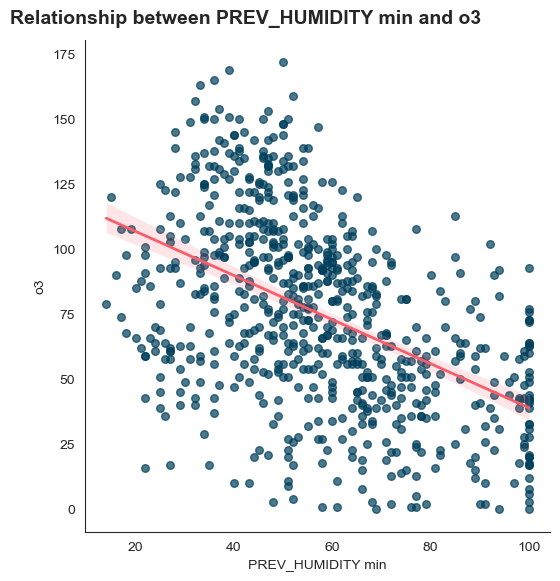


 Correlation test between PREV_HUMIDITY min and o3 

The correlation between PREV_HUMIDITY min and o3 is -0.47466


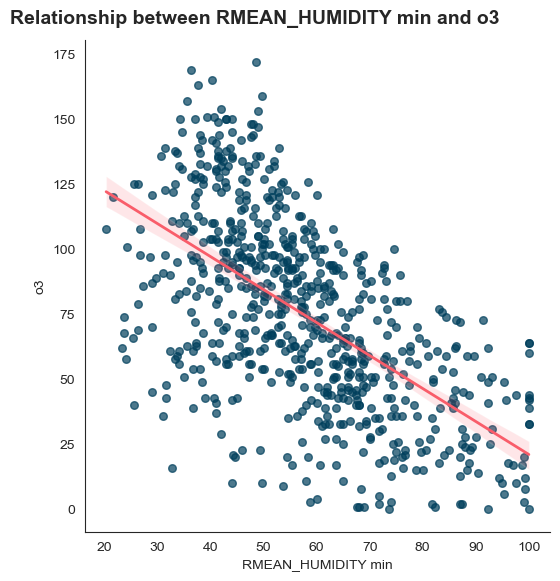


 Correlation test between RMEAN_HUMIDITY min and o3 

The correlation between RMEAN_HUMIDITY min and o3 is -0.59316


In [61]:
num_corr(data,('PREV_HUMIDITY avg','o3'))
num_corr(data,('RMEAN_HUMIDITY avg','o3'))

num_corr(data,('PREV_HUMIDITY min','o3'))
num_corr(data,('RMEAN_HUMIDITY min','o3'))

#### 💧 Humidity and O3 - Key Findings

Across all specifications (min, max, avg, previous, and rolling means), humidity shows a clear and consistent negative relationship with O₃ concentrations.

Higher humidity levels are systematically associated with lower ozone values, with the strongest and most stable inverse patterns observed for average and rolling mean humidity (both current and previous). The relationship appears robust across different times of day, particularly during afternoon and night, where the slope is steeper and dispersion is lower.

Seasonal plots reinforce this pattern:

- Low humidity months (late spring–summer) tend to coincide with higher O₃ classes (Moderate–Poor).
- High humidity months (autumn–winter) are predominantly associated with Good–Fair ozone levels.

Overall, the evidence suggests that humidity acts as a mitigating factor for ozone formation or accumulation, consistent with atmospheric chemistry mechanisms where drier, warmer conditions favor photochemical ozone production.

### Relationship between O3 levels and winds

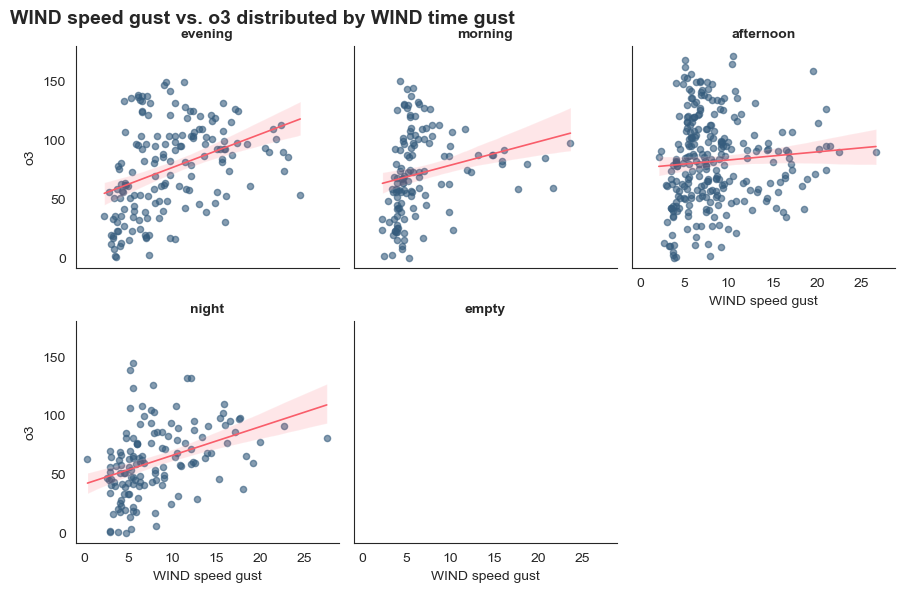


 Correlation test between WIND speed gust and o3 

The correlation between WIND speed gust and o3 is 0.23907


 ANOVA test between the values of  WIND speed gust based on the groups of WIND time gust 

The Kruskal-Wallis H-test for the different groups of the column WIND time gust and the column WIND speed gust is nan so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  o3 based on the groups of WIND time gust 

The Kruskal-Wallis H-test for the different groups of the column WIND time gust and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


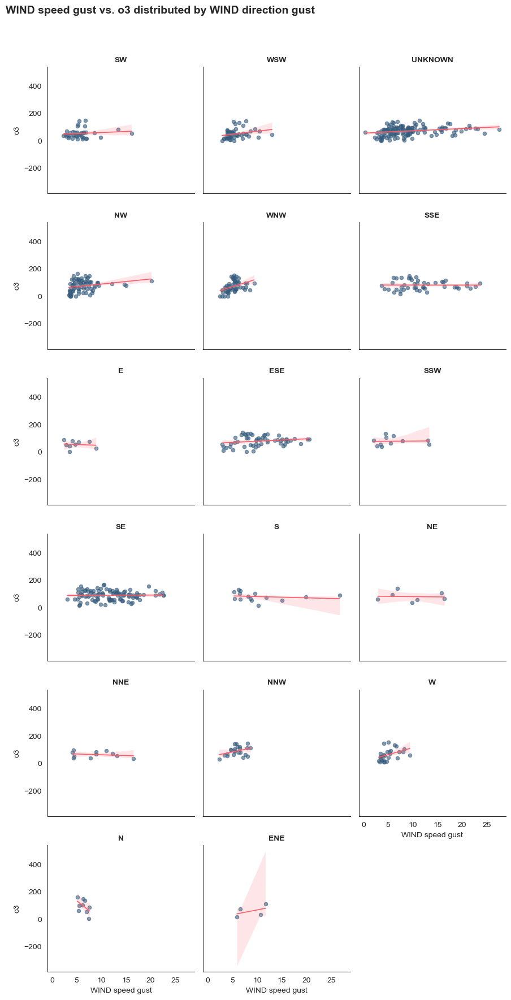


 Correlation test between WIND speed gust and o3 

The correlation between WIND speed gust and o3 is 0.23907


 ANOVA test between the values of  WIND speed gust based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed gust is 0.0 so there is a significant deviation of the median of WIND speed gust in at least two groups.


 ANOVA test between the values of  o3 based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


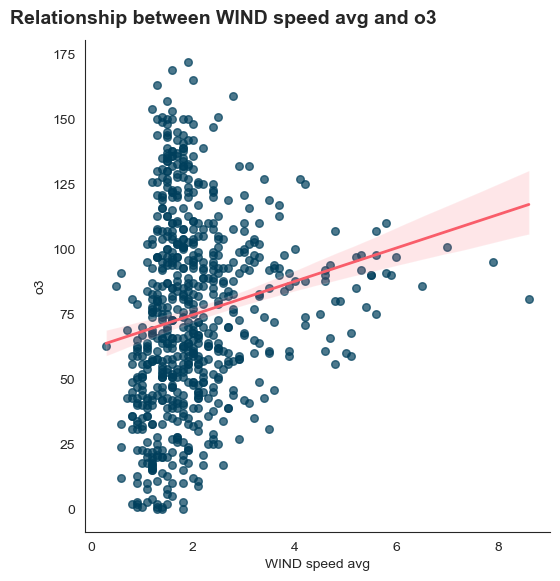


 Correlation test between WIND speed avg and o3 

The correlation between WIND speed avg and o3 is 0.18123


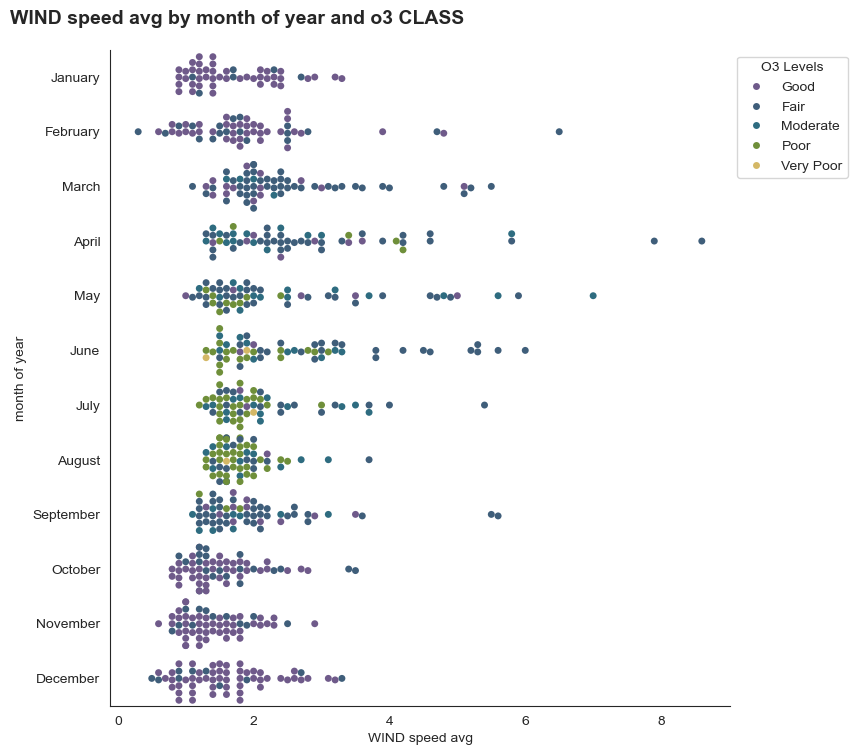



 ANOVA test between the values of  WIND speed avg based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 ANOVA test between the values of  WIND speed avg based on the groups of month of year 

The Kruskal-Wallis H-test for the different groups of the column month of year and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of month of year 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column o3 CLASS and the column month of year are dependent to each other


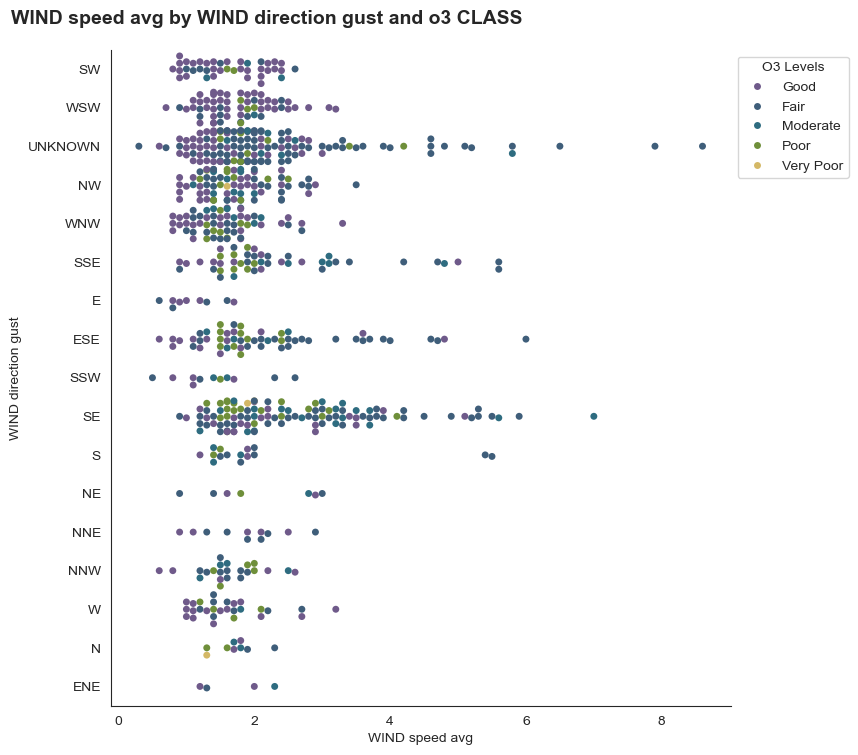



 ANOVA test between the values of  WIND speed avg based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 ANOVA test between the values of  WIND speed avg based on the groups of WIND direction gust 

The Kruskal-Wallis H-test for the different groups of the column WIND direction gust and the column WIND speed avg is 0.0 so there is a significant deviation of the median of WIND speed avg in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of WIND direction gust 

The result of the Chi Squared test, with a Pvalue of 0.0 makes us reject the null hypotesys, so the column o3 CLASS and the column WIND direction gust are dependent to each other


In [62]:
numx_numy_cat_rel(data,'WIND speed gust','o3','WIND time gust','Part of day',
                 ['morning','afternoon','evening','night'])
numx_numy_cat_rel(data,'WIND speed gust','o3','WIND direction gust','Direction',
                 ['UNKNOWN','N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW'])
num_corr(data,('WIND speed avg','o3'))
numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'WIND speed avg','month of year','o3 CLASS',
                  'O3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])
numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'WIND speed avg','WIND direction gust',
                  'o3 CLASS','O3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

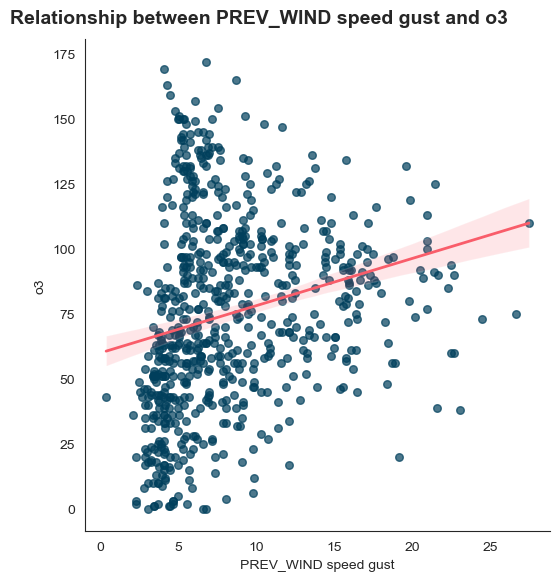


 Correlation test between PREV_WIND speed gust and o3 

The correlation between PREV_WIND speed gust and o3 is 0.22845


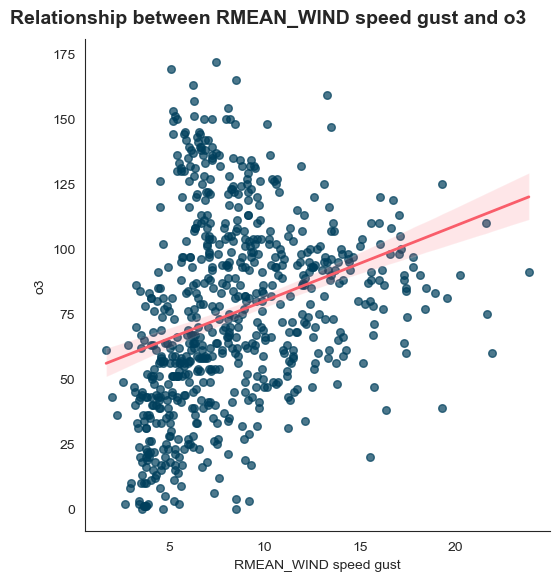


 Correlation test between RMEAN_WIND speed gust and o3 

The correlation between RMEAN_WIND speed gust and o3 is 0.29555


In [63]:
num_corr(data,('PREV_WIND speed gust','o3'))
num_corr(data,('RMEAN_WIND speed gust','o3'))

#### 🌬️ Wind and O₃ – Key Findings
**WIND speed gust vs O₃ (by time of day)**

- A positive relationship is visible across all time periods.
- The association is stronger in the evening and night, where higher gust speeds correspond to higher ozone levels.
- In the afternoon, the relationship is weaker, likely because photochemical production already dominates O₃ formation.
- Wind appears to enhance transport and vertical mixing, supporting ozone accumulation rather than dilution.

**WIND speed gust vs O₃ (by wind direction)**

- Several directions (e.g., NW, WNW, W) show a clear positive slope.
- Some sectors (e.g., S, SSE) exhibit weaker or near-flat trends.
- This suggests a transport component, where certain air masses are associated with higher ozone concentrations.

**WIND speed avg vs O₃**

- A clear positive linear trend emerges.
- Higher average wind speeds are associated with higher O₃ levels.
- Unlike particulate matter, ozone does not decrease with wind; instead, wind appears to support its regional distribution.

**WIND speed avg by month and O₃ class**
- Summer months (June-August) show more Moderate and Poor O₃ classes.
- Winter months are dominated by Good and Fair classes, even at comparable wind speeds.
- Seasonality (solar radiation and temperature) remains a primary driver, with wind acting as a reinforcing factor.

**PREV_WIND speed gust vs O₃**

- A positive association is also present with previous-day wind gust.
- This indicates meteorological persistence, where favorable conditions for ozone transport last multiple days.

**RMEAN_WIND speed gust vs O₃**

- The relationship becomes even more stable using rolling averages.
- Persistent windy conditions are associated with sustained higher ozone levels, reinforcing the importance of large-scale atmospheric patterns.

**Overall Interpretation**

Across all wind metrics (instantaneous, previous, and rolling), wind is consistently positively associated with ozone.
Wind acts as a transport and mixing mechanism, supporting O₃ distribution rather than reducing it.

### Relationship between O3 levels and rain intensity

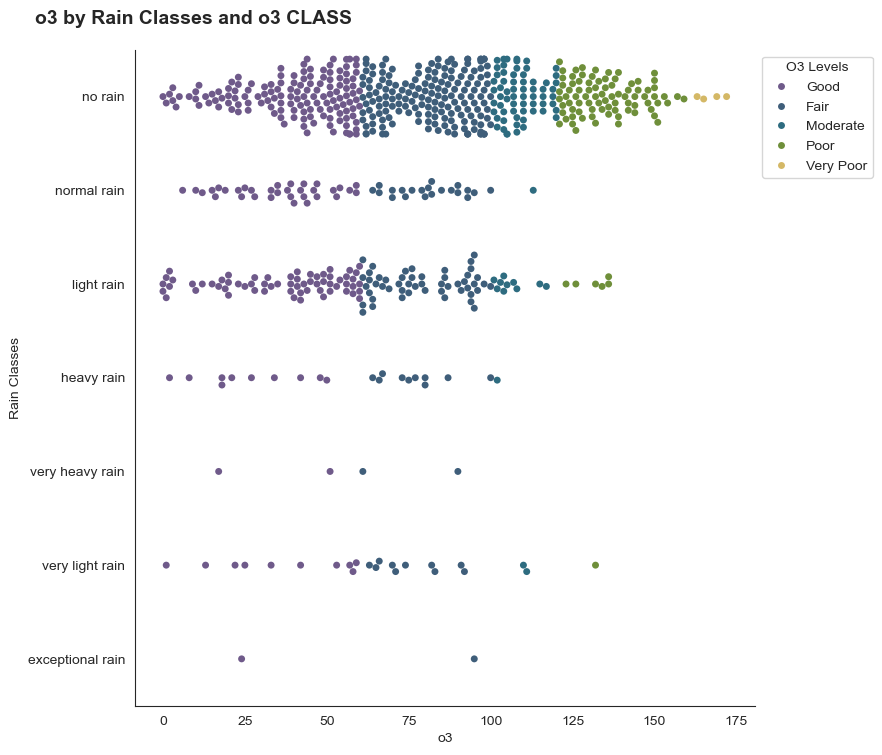



 ANOVA test between the values of  o3 based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


 ANOVA test between the values of  o3 based on the groups of Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column Rain Classes and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of Rain Classes 

The result of the Chi Squared test, with a Pvalue of 5e-05 makes us reject the null hypotesys, so the column o3 CLASS and the column Rain Classes are dependent to each other


In [64]:
numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'o3','Rain Classes','o3 CLASS','O3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

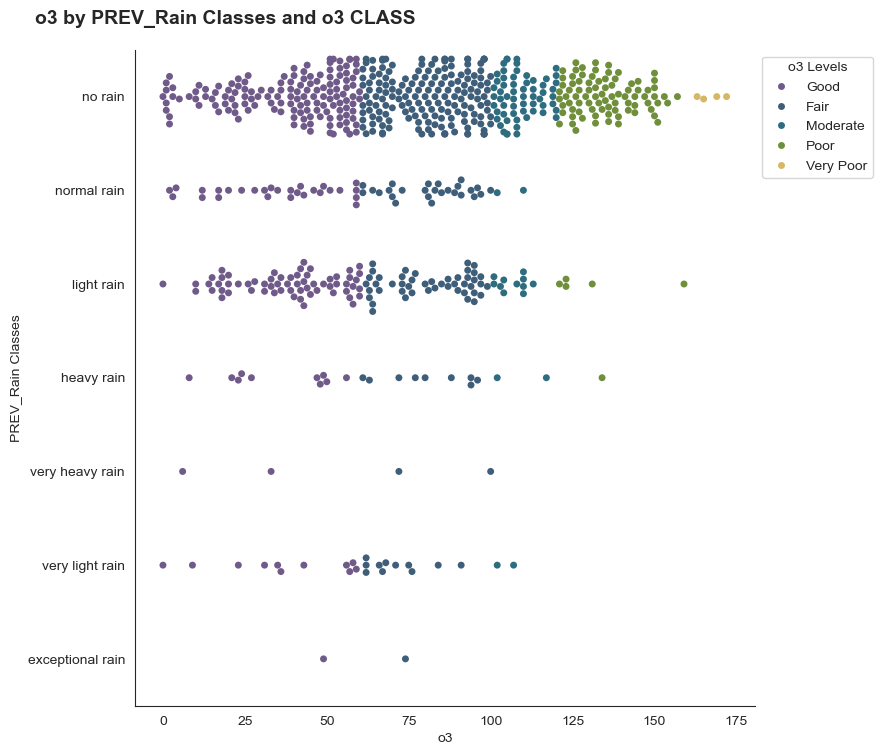



 ANOVA test between the values of  o3 based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


 ANOVA test between the values of  o3 based on the groups of PREV_Rain Classes 

The Kruskal-Wallis H-test for the different groups of the column PREV_Rain Classes and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of PREV_Rain Classes 

The result of the Chi Squared test, with a Pvalue of 0.00045 makes us reject the null hypotesys, so the column o3 CLASS and the column PREV_Rain Classes are dependent to each other


In [65]:
numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'].iloc[1:],'o3','PREV_Rain Classes','o3 CLASS','o3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

#### 🌧️ O₃ and Rainfall Classes

The distribution of O₃ across rain classes shows a clear pattern: higher O₃ concentrations are predominantly observed under no rain conditions. As rainfall intensity increases (light, normal, heavy), O₃ values tend to concentrate in the lower and moderate classes.

Very heavy and exceptional rain events are associated with generally lower O₃ levels, although the number of observations in these categories is limited.

The same pattern is observed when considering previous-day rain classes, confirming that dry conditions, both current and lagged, are associated with higher ozone concentrations, while rainfall tends to coincide with reduced O₃ levels.

### Relationship between O3, its values of the previous day and values of other pollutants

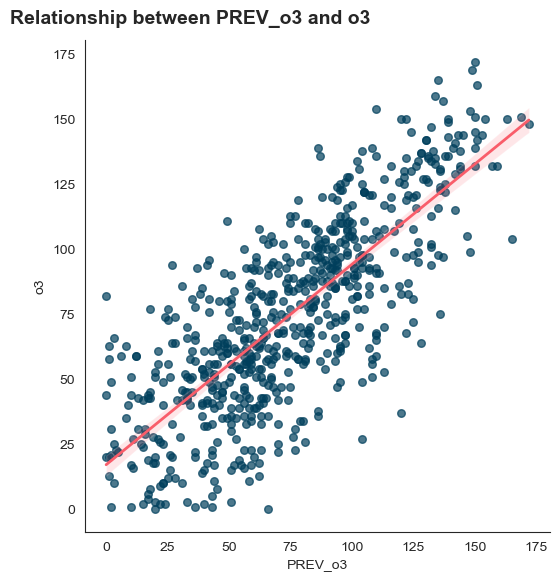


 Correlation test between PREV_o3 and o3 

The correlation between PREV_o3 and o3 is 0.77526


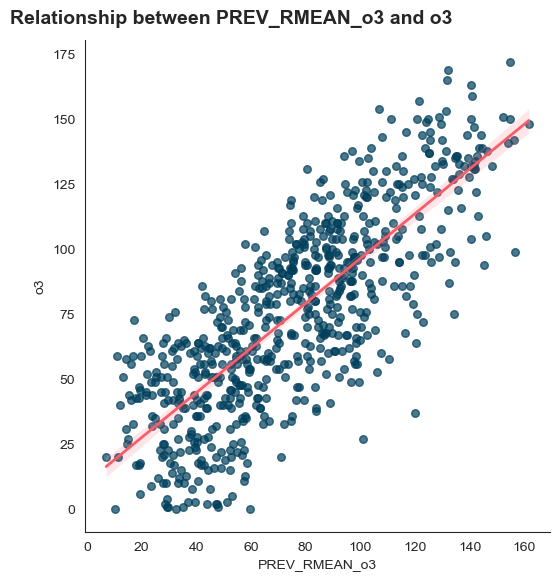


 Correlation test between PREV_RMEAN_o3 and o3 

The correlation between PREV_RMEAN_o3 and o3 is 0.79135


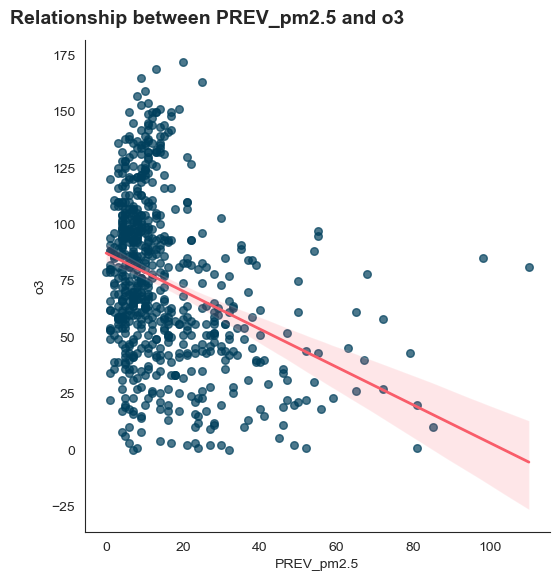


 Correlation test between PREV_pm2.5 and o3 

The correlation between PREV_pm2.5 and o3 is -0.3311


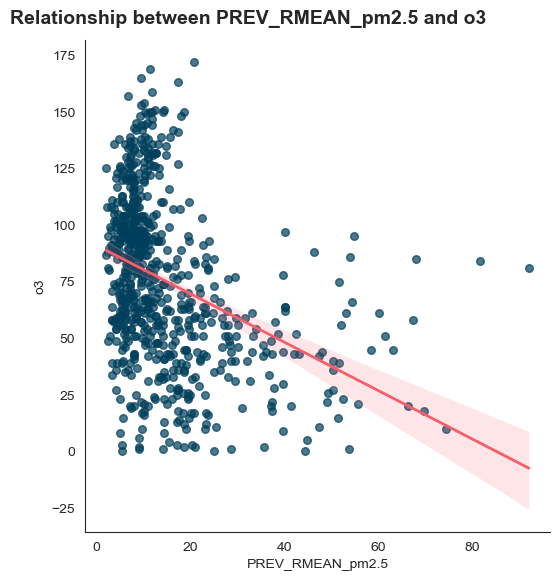


 Correlation test between PREV_RMEAN_pm2.5 and o3 

The correlation between PREV_RMEAN_pm2.5 and o3 is -0.3665


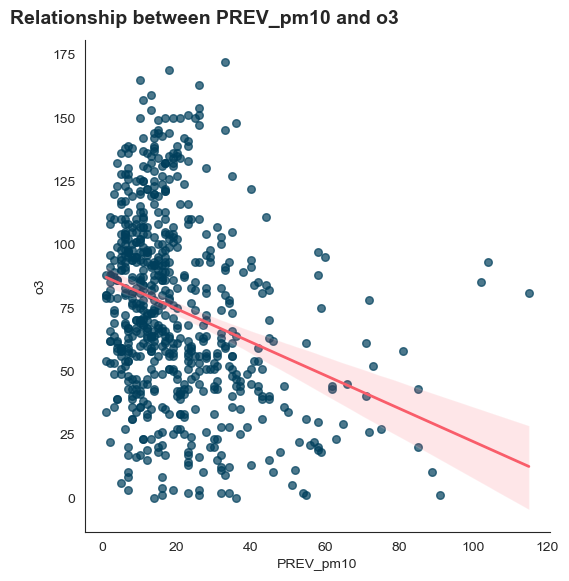


 Correlation test between PREV_pm10 and o3 

The correlation between PREV_pm10 and o3 is -0.28585


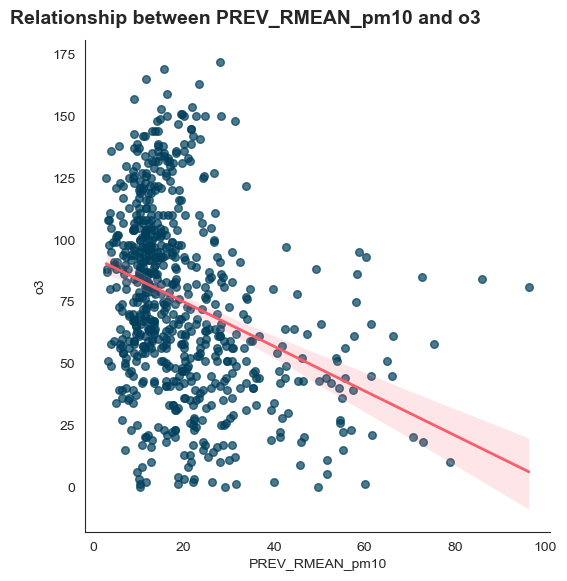


 Correlation test between PREV_RMEAN_pm10 and o3 

The correlation between PREV_RMEAN_pm10 and o3 is -0.33075


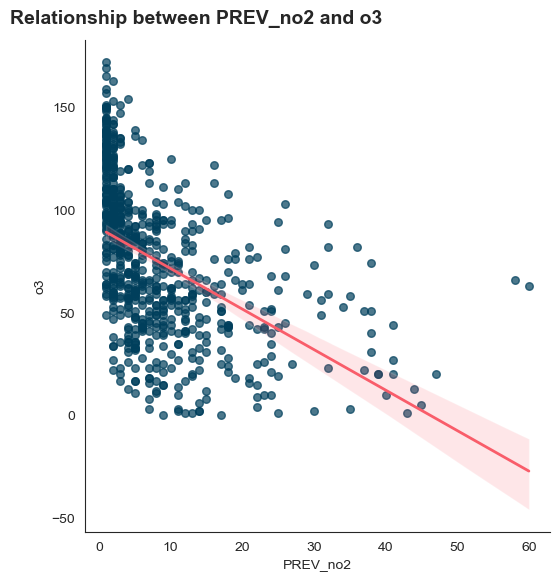


 Correlation test between PREV_no2 and o3 

The correlation between PREV_no2 and o3 is -0.4844


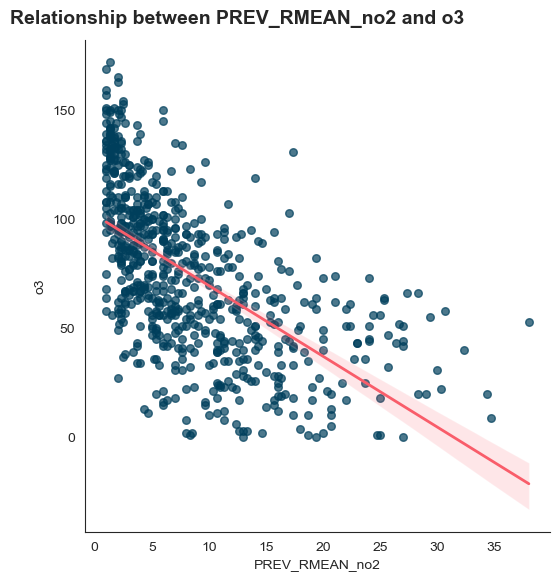


 Correlation test between PREV_RMEAN_no2 and o3 

The correlation between PREV_RMEAN_no2 and o3 is -0.59717


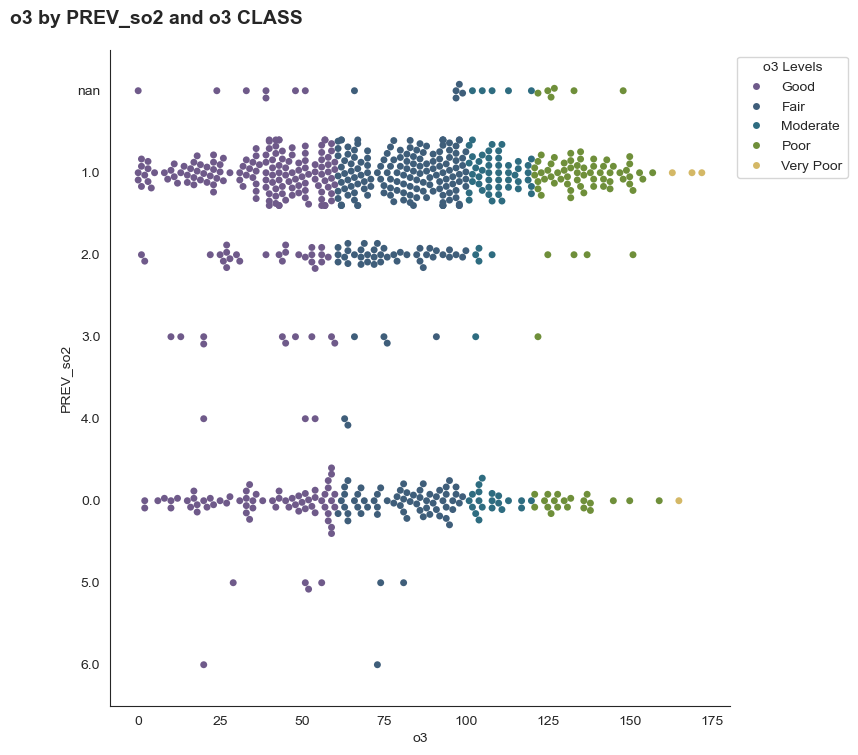



 ANOVA test between the values of  o3 based on the groups of o3 CLASS 

The Kruskal-Wallis H-test for the different groups of the column o3 CLASS and the column o3 is 0.0 so there is a significant deviation of the median of o3 in at least two groups.


 ANOVA test between the values of  o3 based on the groups of PREV_so2 

The Kruskal-Wallis H-test for the different groups of the column PREV_so2 and the column o3 is 0.02607 so there is a significant deviation of the median of o3 in at least two groups.


 Chi-Squared test between the elements of  o3 CLASS and those of PREV_so2 

The result of the Chi Squared test, with a Pvalue of 0.3599  does not leave us reject the null hypotesys that the column o3 CLASS and the column PREV_so2 are independent to each other


In [66]:
num_corr(data,('PREV_o3','o3'))
num_corr(data,('PREV_RMEAN_o3','o3'))

num_corr(data,('PREV_pm2.5','o3'))
num_corr(data,('PREV_RMEAN_pm2.5','o3'))

num_corr(data,('PREV_pm10','o3'))
num_corr(data,('PREV_RMEAN_pm10','o3'))

num_corr(data,('PREV_no2','o3'))
num_corr(data,('PREV_RMEAN_no2','o3'))

numx_caty_cat_rel(data[data['o3 CLASS'] != 'missing_vals'],'o3','PREV_so2','o3 CLASS','o3 Levels',
                 ['Good','Fair','Moderate','Poor','Very Poor'])

#### 📌 Key Findings – O₃ vs Previous Pollutants and PM Variables

Overall, these graphs highlight strong temporal persistence in ozone and clear relationships with other pollutants.

**O₃ vs Previous O₃**

Very strong positive linear relationship between current O₃ and both PREV_o3 and PREV_RMEAN_o3.

This confirms high temporal autocorrelation: ozone levels tend to remain elevated once high.

**O₃ vs Previous PM2.5**

Clear negative relationship between O₃ and both PREV_pm2.5 and PREV_RMEAN_pm2.5.

Higher previous particulate concentrations are generally associated with lower ozone levels.

This suggests different atmospheric regimes: stagnant conditions favor PM accumulation, while photochemical conditions favor O₃ formation.

**O₃ vs Previous PM10**

Similar negative trend with PREV_pm10 and PREV_RMEAN_pm10.

Stronger particulate pollution in prior periods tends to correspond to reduced ozone levels.

**O₃ vs Previous NO₂**

Strong negative association with PREV_no2 and PREV_RMEAN_no2.

This is consistent with ozone titration chemistry, where NOₓ reduces O₃ concentrations.

**O₃ vs Previous SO₂ (categorical view)**

No clear monotonic pattern across SO₂ classes.

O₃ appears more strongly driven by photochemical and NOₓ-related dynamics rather than SO₂ levels.

🎯 Interpretation

Ozone shows:

- Strong temporal persistence
- Inverse relationship with particulates (PM2.5, PM10)
- Clear negative association with NO₂

These patterns support the interpretation that ozone is primarily governed by photochemical processes and atmospheric chemistry rather than by direct particulate accumulation mechanisms.

## Data Cleanup

In [67]:
data_orig = data.copy()

Lines where a pollutant is null are dropped (all pollutants are null in the same lines in the dataset so it is enough to check a single one)

In [68]:
data.drop(data[data['pm2.5'].isna()].index, axis = 0, inplace = True)

In [69]:
data.drop(data[data['PREV_pm2.5'].isna()].index, axis = 0, inplace = True)

It is assumed that when the registered wind speed is null, then its value is zero.
Also, it is assumed that when the speed of the wind gust is null, its speed equals to the average wind speed.

In [70]:
data['WIND speed avg'].fillna(0, inplace = True)

In [71]:
data['WIND speed gust'].fillna(data['WIND speed avg'], inplace = True)

In [72]:
data['PREV_WIND speed gust'].fillna(data['WIND speed avg'].shift(1), inplace = True)

In [73]:
pm_vals = data['pm2.5']
pm_classes = data['pm2.5 CLASS']

o3_vals = data['o3']
o3_classes = data['o3 CLASS']

eu_aqi = data['eu aqi']
data.drop(['pm2.5','pm10','o3','eu aqi','pm2.5 CLASS','pm10 CLASS','o3 CLASS'], axis = 1, inplace = True)

## Day types - Clustering

It is pretty useful and interesting, for visualization and analysis reasons, to summarize weather conditions in different profiles, which means performing a clustering.

In [74]:
df_clustering = data[['WIND speed gust','PREV_WIND speed gust',
                        'AIR TEMP T avg','PREV_AIR TEMP T avg','HUMIDITY min', 'PREV_HUMIDITY avg','Rain Classes']].copy()

In [75]:
df_clustering = pd.get_dummies(df_clustering)
# It is CRUCIAL to scale data before performing the clustering!
scaler = RobustScaler().fit(df_clustering)

In [76]:
df_clustering = scaler.transform(df_clustering)

The clustering is performed with KMeans and the number of clusters is chosen with the elbow method.

Number of Clusters: 5 	Average Distortion: 1.2774142430343363
Number of Clusters: 6 	Average Distortion: 1.2392951242444872
Number of Clusters: 7 	Average Distortion: 1.208477189695737
Number of Clusters: 8 	Average Distortion: 1.1340825087365176
Number of Clusters: 9 	Average Distortion: 1.1047938714726708
Number of Clusters: 10 	Average Distortion: 1.0848712523926296
Number of Clusters: 11 	Average Distortion: 1.057927929831177
Number of Clusters: 12 	Average Distortion: 1.023039272899789
Number of Clusters: 13 	Average Distortion: 1.0112142547635847
Number of Clusters: 14 	Average Distortion: 1.0016824437728473
Number of Clusters: 15 	Average Distortion: 0.9822584761331326
Number of Clusters: 16 	Average Distortion: 0.9692949818592796
Number of Clusters: 17 	Average Distortion: 0.9594988666047489
Number of Clusters: 18 	Average Distortion: 0.9550756338583454
Number of Clusters: 19 	Average Distortion: 0.9414206868785479


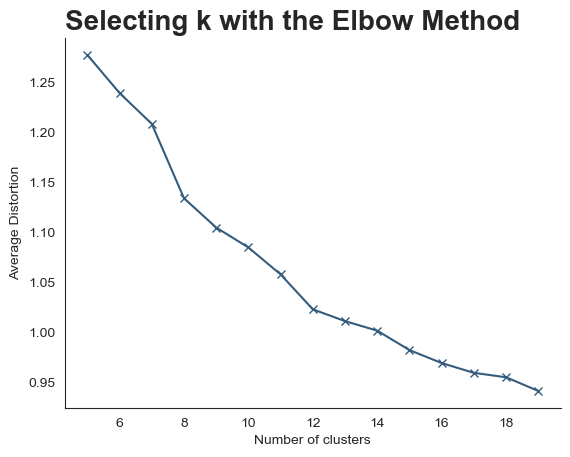

In [77]:
clusters = range(5, 20)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters = k, random_state = 0)
    model.fit(df_clustering)
    prediction = model.predict(df_clustering)
    distortion = (
        sum(np.min(cdist(df_clustering, model.cluster_centers_, "euclidean"), axis = 1))
        / df_clustering.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-", color="#355C7D")
plt.xlabel("Number of clusters")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize=20, ha='left', x=0.0, weight='bold')
sns.despine()
plt.show()

In [78]:
kmeans_model = KMeans(n_clusters = 12, random_state = 0).fit(df_clustering)

In [79]:
clust_analysis = data[['WIND speed gust','PREV_WIND speed gust',
                        'AIR TEMP T avg','PREV_AIR TEMP T avg','HUMIDITY min', 'PREV_HUMIDITY avg']]

clust_analysis['Rain Classes'] = data.loc[data.index, 'Rain Classes']

clust_analysis['Day Type'] = kmeans_model.predict(df_clustering).astype(str)

Now that the clusters have been created, it is important to analyze the different weather conditions in each of them to give them a descriptive and useful name.

****************************************************************************************************
Distribution of WIND speed gust for different clusters of days
The Kruskal-Wallis H-test for the different groups of the column Day Type and the column WIND speed gust is 1.718005923611274e-78 so there is a significant deviation of the median of WIND speed gust in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
0,26.0,15.961538,3.780590,10.3,13.025,15.40,18.150,24.5
1,68.0,6.610294,2.851297,0.0,4.800,6.25,8.025,15.8
10,49.0,7.173469,2.779971,0.0,5.400,6.60,9.100,14.3
11,78.0,5.973077,2.096607,2.9,4.200,5.20,8.125,10.0
2,43.0,4.627907,1.824741,2.5,3.350,4.10,5.300,10.7
3,99.0,6.992929,1.785614,4.1,5.500,6.60,7.900,11.6
4,57.0,14.828070,2.934509,10.3,12.600,14.40,16.100,23.1
5,49.0,8.146939,3.178777,0.0,6.100,8.80,10.300,13.4
6,89.0,4.687640,1.464258,2.6,3.600,4.20,5.600,9.4


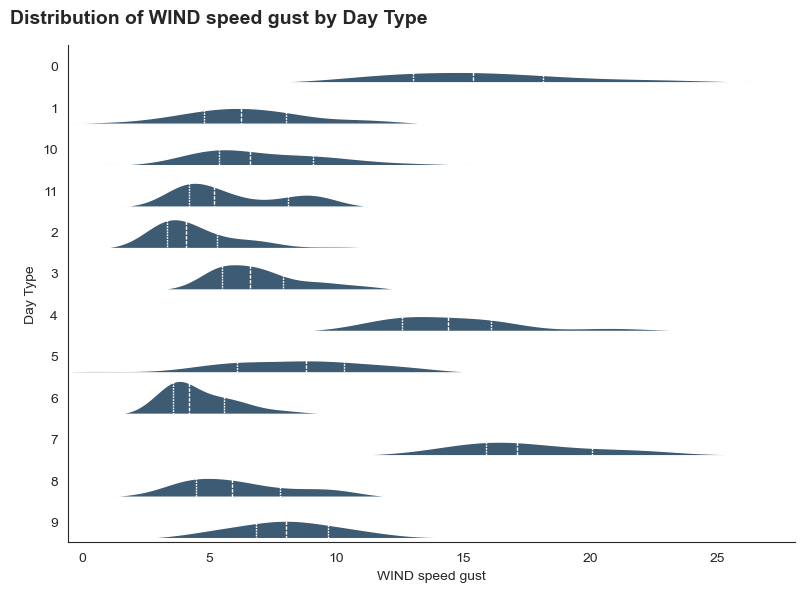

****************************************************************************************************
Distribution of PREV_WIND speed gust for different clusters of days
The Kruskal-Wallis H-test for the different groups of the column Day Type and the column PREV_WIND speed gust is 3.687809903445152e-73 so there is a significant deviation of the median of PREV_WIND speed gust in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
0,26.0,7.134615,2.785382,2.9,5.525,6.95,8.550,14.8
1,68.0,6.091176,2.957042,0.0,4.175,5.80,7.625,15.0
10,49.0,7.697959,2.678657,1.5,5.500,7.60,9.500,13.4
11,78.0,6.046154,2.074376,3.0,4.325,5.40,7.475,11.0
2,43.0,5.151163,2.439786,2.3,3.400,4.20,6.050,10.9
3,99.0,6.920202,1.894998,4.0,5.500,6.50,7.700,12.9
4,57.0,8.787719,2.613705,0.0,7.500,8.90,10.800,13.7
5,49.0,14.802041,2.734311,10.9,12.500,14.50,16.200,21.5
6,89.0,5.035955,1.944529,0.0,3.700,4.40,6.000,12.8


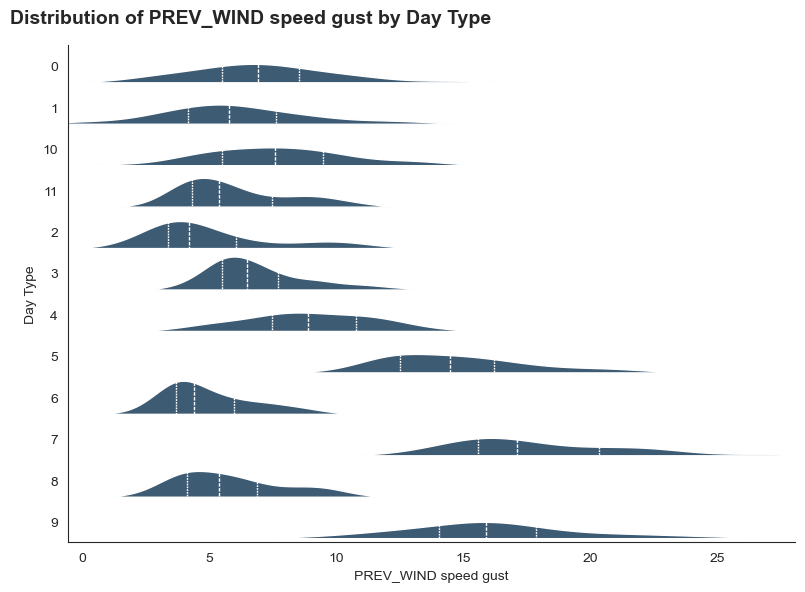

****************************************************************************************************
Distribution of AIR TEMP T avg for different clusters of days
The Kruskal-Wallis H-test for the different groups of the column Day Type and the column AIR TEMP T avg is 7.35698897095367e-96 so there is a significant deviation of the median of AIR TEMP T avg in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
0,26.0,9.934615,3.302235,4.6,7.80,9.15,12.600,16.2
1,68.0,8.732353,3.450695,1.7,5.70,8.95,11.000,16.4
10,49.0,14.042857,5.500871,2.6,9.40,14.80,18.800,23.0
11,78.0,15.246154,3.096739,8.9,12.95,15.35,16.900,22.1
2,43.0,6.325581,3.952039,-0.1,3.60,5.80,8.000,15.1
3,99.0,24.642424,2.686136,15.6,22.90,25.20,26.600,29.4
4,57.0,18.421053,4.892733,5.5,14.40,19.20,22.500,25.9
5,49.0,17.193878,4.339950,7.9,13.90,17.00,20.300,25.9
6,89.0,5.276404,2.820381,-0.7,2.80,5.50,7.600,11.2


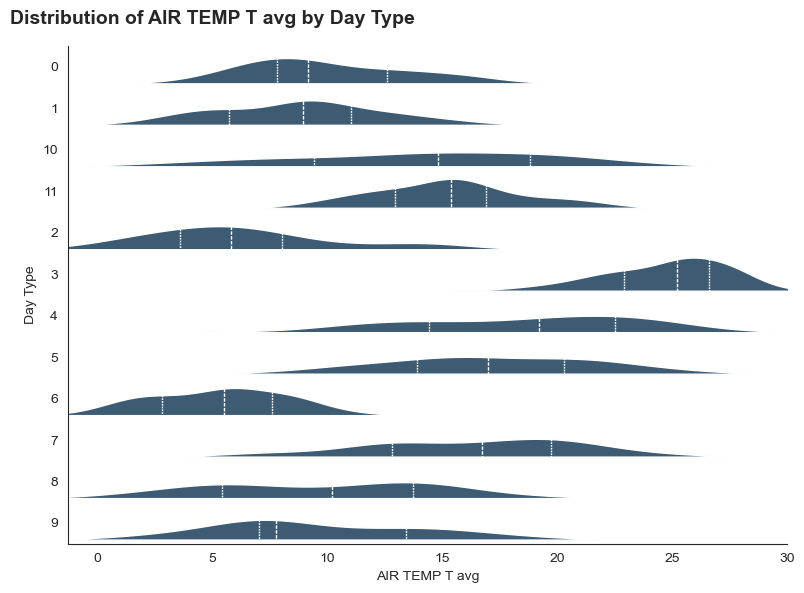

****************************************************************************************************
Distribution of PREV_AIR TEMP T avg for different clusters of days
The Kruskal-Wallis H-test for the different groups of the column Day Type and the column PREV_AIR TEMP T avg is 2.2724033066243573e-93 so there is a significant deviation of the median of PREV_AIR TEMP T avg in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
0,26.0,8.626923,3.253620,3.8,6.300,7.95,10.875,15.7
1,68.0,8.797059,3.773196,1.2,5.775,8.80,11.175,19.1
10,49.0,13.312245,5.494225,1.1,9.400,13.50,18.200,22.9
11,78.0,14.684615,3.280920,6.2,12.550,14.90,16.000,22.1
2,43.0,5.983721,3.849547,-0.1,3.000,5.80,7.350,14.8
3,99.0,24.287879,2.972399,16.3,22.050,25.10,26.450,29.4
4,57.0,19.145614,4.882222,7.2,15.600,19.90,22.600,26.8
5,49.0,17.551020,4.585672,8.0,13.900,18.30,21.100,25.7
6,89.0,5.693258,2.919324,-0.7,3.600,5.80,7.800,12.0


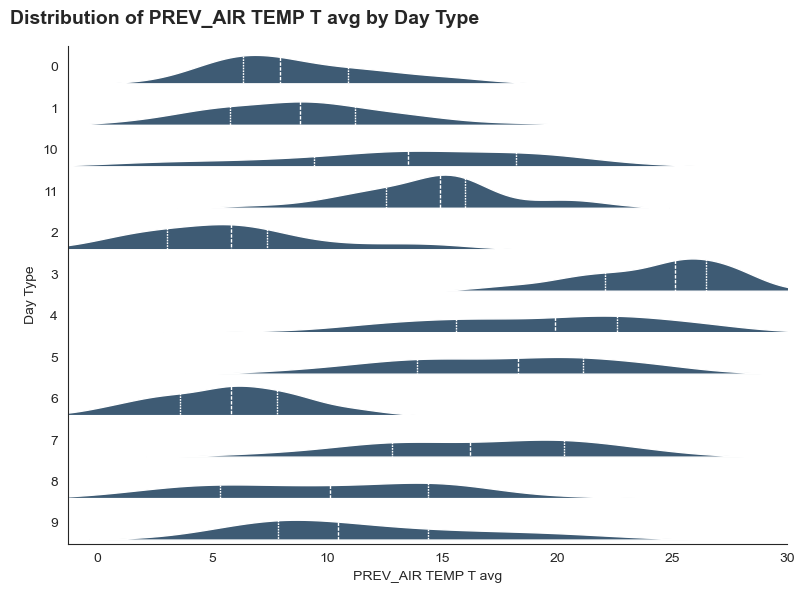

****************************************************************************************************
Distribution of HUMIDITY min for different clusters of days
The Kruskal-Wallis H-test for the different groups of the column Day Type and the column HUMIDITY min is 4.090134965308821e-82 so there is a significant deviation of the median of HUMIDITY min in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
0,26.0,53.730769,17.696458,20.0,41.25,59.5,62.75,100.0
1,68.0,36.720588,11.799122,16.0,26.75,36.0,45.25,64.0
10,49.0,52.122449,13.733524,25.0,42.00,54.0,59.00,80.0
11,78.0,57.525641,11.524930,25.0,50.00,58.0,66.00,79.0
2,43.0,92.418605,8.843164,68.0,88.50,96.0,100.00,100.0
3,99.0,40.373737,7.950851,17.0,35.00,40.0,46.00,56.0
4,57.0,50.035088,12.317184,16.0,46.00,51.0,56.00,85.0
5,49.0,49.653061,15.265090,14.0,37.00,52.0,61.00,71.0
6,89.0,68.775281,13.879967,26.0,62.00,69.0,77.00,100.0


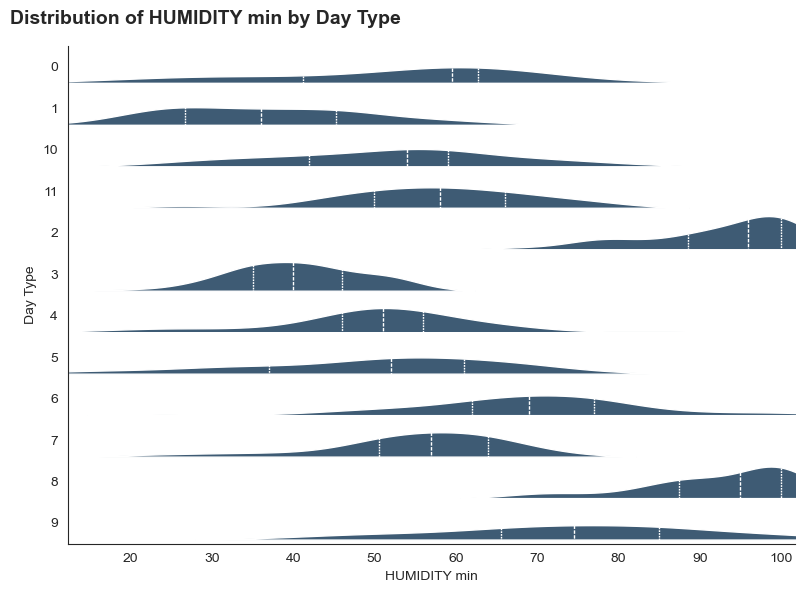

****************************************************************************************************
Distribution of PREV_HUMIDITY avg for different clusters of days
The Kruskal-Wallis H-test for the different groups of the column Day Type and the column PREV_HUMIDITY avg is 1.8399341603063108e-91 so there is a significant deviation of the median of PREV_HUMIDITY avg in at least two groups.


,count,mean,std,min,25%,50%,75%,max
Day Type,,,,,,,,
0,26.0,94.961538,6.587751,74.0,91.25,98.0,100.0,100.0
1,68.0,55.735294,12.518187,26.0,50.00,57.0,64.0,84.0
10,49.0,83.897959,10.809419,62.0,78.00,84.0,92.0,100.0
11,78.0,78.384615,9.115750,52.0,72.00,78.0,83.0,98.0
2,43.0,96.162791,6.597006,70.0,96.00,99.0,100.0,100.0
3,99.0,59.808081,7.953534,42.0,53.50,60.0,66.0,76.0
4,57.0,61.719298,11.114268,32.0,54.00,64.0,69.0,83.0
5,49.0,66.510204,10.661696,34.0,63.00,67.0,75.0,85.0
6,89.0,84.269663,9.163619,56.0,78.00,86.0,90.0,100.0


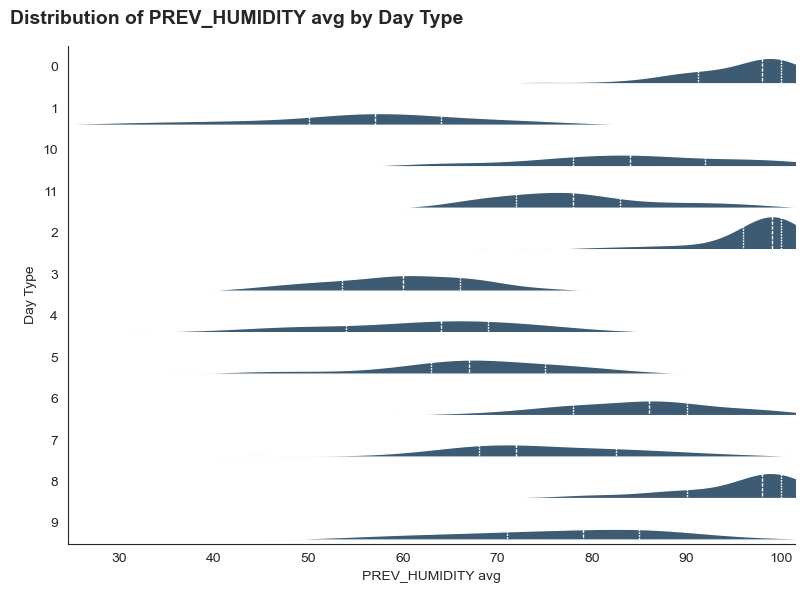

****************************************************************************************************
Distribution of Rain Classes for different clusters of days
The result of the Chi Squared test makes us reject the null hypotesys, so the column Rain Classes and the column Day Type are dependent to each other


Day Type,0,1,10,11,2,3,4,5,6,7,8,9
Rain Classes,,,,,,,,,,,,
no rain,6,62,0,75,0,96,48,45,85,22,1,2
very light rain,1,2,2,2,0,0,1,1,4,4,6,0
light rain,8,2,43,0,43,3,6,1,0,11,0,12
normal rain,7,2,0,0,0,0,2,2,0,7,25,8
heavy rain,3,0,3,1,0,0,0,0,0,2,8,4
very heavy rain,1,0,0,0,0,0,0,0,0,1,2,0
exceptional rain,0,0,1,0,0,0,0,0,0,0,1,0


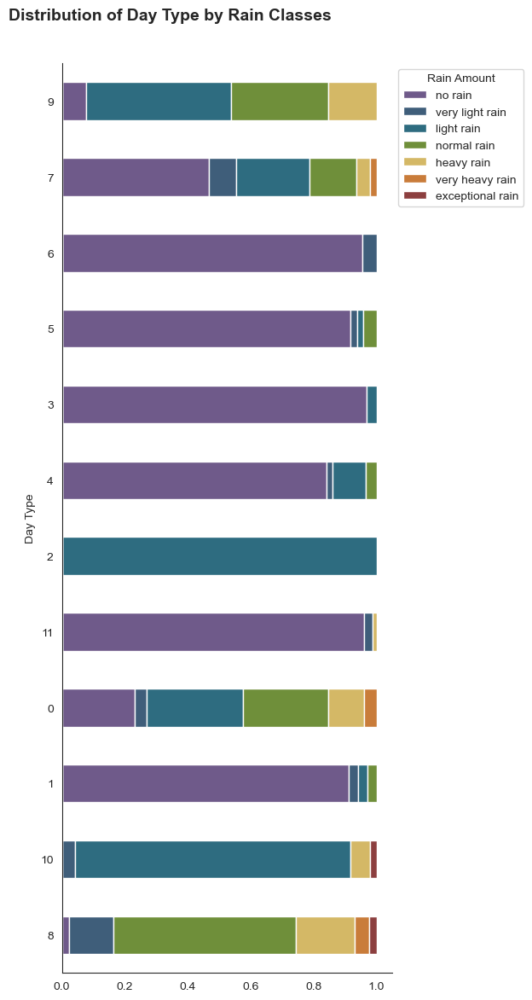

In [80]:
for c in clust_analysis.columns.tolist()[:-1]:
    print('*'*100)
    print('Distribution of',c,'for different clusters of days')
    if clust_analysis[c].dtypes == 'O':
        cat_cat_rel(clust_analysis,c,'Day Type','Rain Amount',
                 ['no rain','very light rain','light rain','normal rain','heavy rain','very heavy rain',
                 'exceptional rain'])
    else:
        cat_num_rel(clust_analysis,'Day Type',c, lgscale = False)

### 🌦️ Weather Clustering Evaluation
The K-Means algorithm identified **12 distinct weather types** which serve as a powerful feature:
*   Groups representing **"Dry, Stable, Calm"** conditions are likely strong predictors for **High PM2.5**.
*   Groups representing **"Perturbed, Windy, Rainy"** conditions are predictors for **Clean Air**.
This "Day Type" feature helps the model capture the **synoptic context** that single variables (like just 'temp' or just 'wind') might miss.


### Cluster 0

- name: windy_humid_worsening
- description: Wind speed increases compared to the previous day, humidity is elevated and precipitation is frequent. Represents deteriorating weather conditions with growing instability and approaching disturbances.

### Cluster 1

- name: dry_stable_calm
- description: Low humidity, weak wind, and almost no precipitation. Represents stable atmospheric conditions with generally clear or mostly clear skies.

### Cluster 2

- name: overcast_persistent_light_rain
- description: Very high humidity with continuous or very frequent light precipitation. Typically associated with overcast skies and weak atmospheric dynamics.

### Cluster 3

- name: hot_dry_stable
- description: High temperatures, low humidity, weak winds, and absence of precipitation. Represents strongly stable, dry, and clear weather conditions.

### Cluster 4

- name: mild_unstable_showers
- description: Moderate temperatures, increasing wind, and scattered light to moderate precipitation. Represents unstable conditions often associated with variable cloud cover and intermittent showers.

### Cluster 5

- name: variable_clearing
- description: Transitional conditions with decreasing wind, occasional residual precipitation, and progressively drier air. Represents improving weather following unsettled conditions.

### Cluster 6

- name: very_humid_overcast_calm
- description: High humidity, weak wind, frequent cloud cover, and limited precipitation. Often associated with persistent low clouds or mist and limited atmospheric circulation.

### Cluster 7

- name: strongly_perturbed_very_windy
- description: Very strong wind, frequent precipitation including heavy events, and highly variable conditions. Represents intense disturbed weather with active atmospheric dynamics.

### Cluster 8

- name: very_humid_frequently_rainy
- description: Persistently high humidity with frequent precipitation events. Represents generally unsettled conditions with limited drying between rainfall episodes.

### Cluster 9

- name: continuous_stratiform_rain
- description: Persistent precipitation occurring on most days, high humidity, weak to moderate wind. Represents organized and continuous rainfall with widespread cloud cover.

### Cluster 10

- name: slightly_unstable_variable
- description: Moderate humidity, occasional weak precipitation, and moderate wind. Represents mixed conditions with alternating cloudy and clearer periods.

### Cluster 11

- name: mild_stable_partly_cloudy
- description: Mild temperatures, limited precipitation, moderate humidity, and generally stable conditions. Represents fair weather with variable or partly cloudy skies.

In [81]:
day_type_labels = {
    0:  "windy_humid_worsening",
    1:  "dry_stable_calm",
    2:  "overcast_persistent_light_rain",
    3:  "hot_dry_stable",
    4:  "mild_unstable_showers",
    5:  "variable_clearing",
    6:  "very_humid_overcast_calm",
    7:  "strongly_perturbed_very_windy",
    8:  "very_humid_frequently_rainy",
    9:  "continuous_stratiform_rain",
    10: "slightly_unstable_variable",
    11: "mild_stable_partly_cloudy"
}

In [82]:
day_types = pd.Series(kmeans_model.predict(df_clustering)).map(day_type_labels)

In [83]:
clust_analysis['Day Type'] = day_types.values

Description of column Day Type
The column Day Type has 0 missing values


,Day Type values,Absolute frequency,Relative frequency (%)
0,hot_dry_stable,99,14.69
1,very_humid_overcast_calm,89,13.20
2,mild_stable_partly_cloudy,78,11.57
3,dry_stable_calm,68,10.09
4,mild_unstable_showers,57,8.46
5,variable_clearing,49,7.27
6,slightly_unstable_variable,49,7.27
7,strongly_perturbed_very_windy,47,6.97
8,overcast_persistent_light_rain,43,6.38
9,very_humid_frequently_rainy,43,6.38


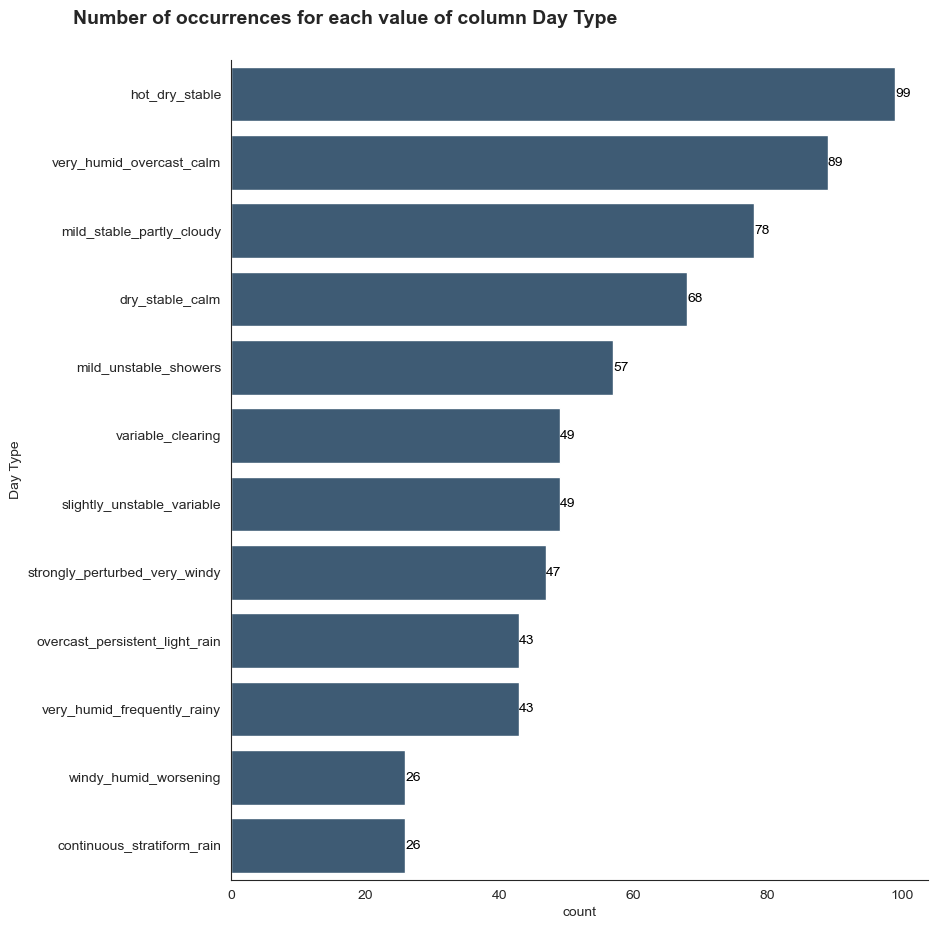

In [84]:
describe_cat_column_h(clust_analysis, 'Day Type')

#### 📊 **Day Type Distribution (Clustering Output)**

The clustered day types show a relatively balanced but structured distribution across meteorological regimes.

The most frequent class is **hot_dry_stable** (99), followed by **very_humid_overcast_calm** (89) and **mild_stable_partly_cloudy** (78).
👉 *Stable atmospheric conditions—both dry-hot and humid-overcast—represent a large share of the dataset.*

- Dry_stable_calm (68) and mild_unstable_showers (57) are also well represented, indicating moderate variability in atmospheric dynamics.
- Transitional or mixed regimes such as variable_clearing (49) and slightly_unstable_variable (49) occur with medium frequency.
- Strongly dynamic or disturbed conditions (e.g., strongly_perturbed_very_windy (47)) are less common but still significant.
- Persistent rainy regimes (e.g., continuous_stratiform_rain (26), windy_humid_worsening (26)) are the least frequent.

🎯 **Insights**

The clustering produced a **dataset dominated by stable atmospheric conditions, with fewer strongly perturbed or persistently rainy regimes**.

This distribution suggests that most observations occur under meteorological setups favorable to pollutant accumulation (stable, calm conditions), while extreme dynamic weather patterns are comparatively rarer.

Since the type of regression that will be done is a quantile regression the target metric is the pinball loss, however for the median model it is equal to half the MAE, which is a much easier metric to interpret for people, so it will be used to represent the quality of median models together with pinball score.

## **Export data for Part 2**

In [85]:
data_full = data.copy()

In [86]:
# Creating the processed data folder if it does not exist yet
os.makedirs('../data/processed', exist_ok=True)

# Saving the prepared data to be loaded in Notebook 2
# data_full contains all the engineered features ready for modeling
data_full.to_pickle('../data/processed/data_full.pkl')

# data_orig is the dataset before the data cleanup step, needed by the baseline() function
data_orig.to_pickle('../data/processed/data_orig.pkl')

# Target variables and their class labels
pm_vals.to_pickle('../data/processed/pm_vals.pkl')
o3_vals.to_pickle('../data/processed/o3_vals.pkl')
pm_classes.to_pickle('../data/processed/pm_classes.pkl')
o3_classes.to_pickle('../data/processed/o3_classes.pkl')

# The fitted KMeans model and the day type series derived from it
with open('../data/processed/kmeans_model.pkl', 'wb') as f:
    pickle.dump(kmeans_model, f)

day_types.to_pickle('../data/processed/day_types.pkl')

print('All files saved successfully.')

All files saved successfully.


## **Transition to Modeling Phase**

The exploratory analysis and feature engineering phases have provided a comprehensive understanding of the structure, variability, and driving factors of air quality in the study area.

Through univariate and multivariate analyses, the key relationships between pollutant concentrations and meteorological conditions have been identified, highlighting the importance of variables such as wind intensity, temperature, humidity, and precipitation patterns.

The clustering analysis further enriched the dataset by introducing the **Day Type** feature, which captures recurring meteorological regimes. This variable enables the models to distinguish between structurally different atmospheric conditions, improving their ability to learn context-dependent pollutant dynamics.

At this stage, the dataset can be considered **model-ready**, as it includes:

- cleaned and validated observations  
- engineered temporal and meteorological features  
- categorical representations of environmental conditions  
- clustering-based structural descriptors  

The dataset is now exported in a structured format and will be used in the next phase to develop and evaluate predictive models for pollutant concentration estimation and air quality classification.